In [420]:
import sys
import os
sys.path.append(os.path.abspath("..")) 
import importlib
import src

In [421]:
try: 
    for module in [src.models, src.data, src.utils, src.train, src.verification, src.visualisation]:
        if module:
            importlib.reload(module)
    print("Reloading")
except:
    print("Not reloading")

from src.models import *
from src.data import *
from src.utils import *
from src.train import *
from src.verification import *
from src.visualisation import *

Reloading


In [422]:
import numpy as np
import torch
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.optim import Adam
import matplotlib.cm as cm


import math
from IPython.display import display
import yfinance as yf


In [423]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [424]:
import pandas_datareader.data as web
import yfinance as yf
from datetime import datetime

In [425]:
trainval_start = "2006-04-02"
trainval_end = "2019-12-31"
test_start = "2020-01-01"
# test_start = "2020-01-01"
test_end = "2022-12-31"

trainval_end = (pd.to_datetime(trainval_end) - pd.tseries.offsets.BDay(53)).strftime("%Y-%m-%d")
test_start = (pd.to_datetime(test_start) - pd.tseries.offsets.BDay(53)).strftime("%Y-%m-%d")

In [426]:
etfs = ['AGG', 'DBC', 'VTI']
asset_names = etfs + ["VIX"]
n_assets = len(asset_names)
vix = web.DataReader('VIXCLS', 'fred',  start=trainval_start, end=test_end)
close_df = yf.download(etfs, start=trainval_start, end=test_end)["Close"]
close_df["VIX"] = vix

returns_df =  close_df.pct_change()[1:]
close_df = close_df[1:]

[*********************100%***********************]  3 of 3 completed


/tmp/ipykernel_4677/1499455753.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


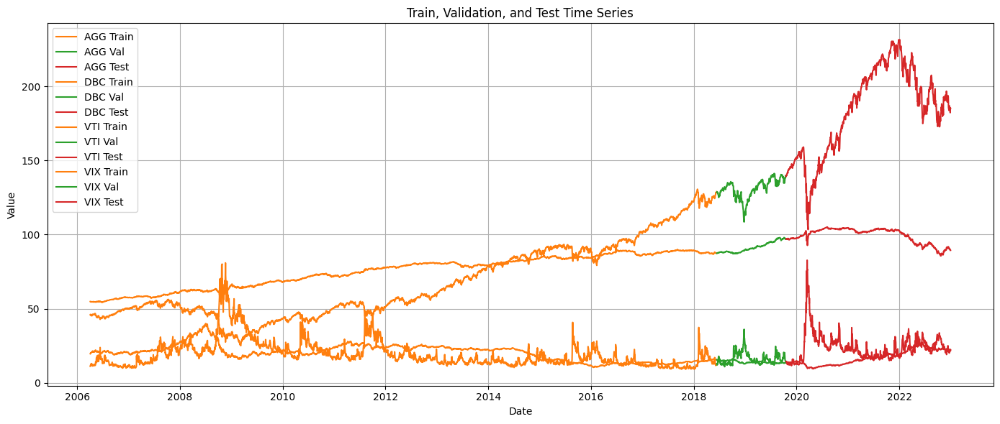

In [427]:
# df = returns_df

colors = cm.get_cmap('tab10')


trainval_mask = (close_df.index >= trainval_start) & (close_df.index <= trainval_end)
trainval_indices = close_df[trainval_mask].index

# 10% validation split
val_size = int(0.10 * len(trainval_indices))
train_indices = trainval_indices[:-val_size]
val_indices = trainval_indices[-val_size:]

# Test period

test_mask = (close_df.index >= test_start) & (close_df.index <= test_end)
test_indices = close_df[test_mask].index

plt.figure(figsize=(14, 6))

for i, ticker in enumerate(close_df.columns):
    for idx, label, line in zip([train_indices, val_indices, test_indices], ["Train", "Val", "Test"], [1,2,3]):
        plt.plot(close_df.loc[idx][ticker], color = colors(line), label=f"{ticker} {label}")


plt.title('Train, Validation, and Test Time Series')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [428]:
def create_windows(data, indices, lookback, horizon):
    X, y = [], []
    index_list = []

    for i in range(len(indices) - lookback - horizon):
        # print(i)
        window_start = indices[i]
        input_end = indices[i + lookback]
        output_end = indices[i + lookback + horizon]

        x_window = data.loc[window_start:input_end].iloc[:-1].values  # shape: (lookback, features)
        y_window = data.loc[input_end:output_end].iloc[:horizon].values  # shape: (horizon, features)
        
        X.append(x_window)
        y.append(y_window)
        index_list.append(input_end)  # center timestamp for reference

    return np.array(X), np.array(y), index_list


lookback = 50   # e.g., past 20 time steps
horizon = 5     # predict next 5 steps
allocation_step = 5

X_train, y_train, train_idx = create_windows(returns_df, train_indices, lookback, horizon)
X_val, y_val, val_idx = create_windows(returns_df, val_indices, lookback, horizon)
X_test, y_test, test_idx = create_windows(returns_df, test_indices, lookback, horizon)

batch_size = 28

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)


# X_test_, y_test_, test_idx = create_windows(returns_df, test_indices, 1, 251)

# X_test_tensor_annual = torch.tensor(X_test_, dtype=torch.float32)
# y_test_tensor_annual = torch.tensor(y_test_, dtype=torch.float32)

/tmp/ipykernel_4677/2135482227.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


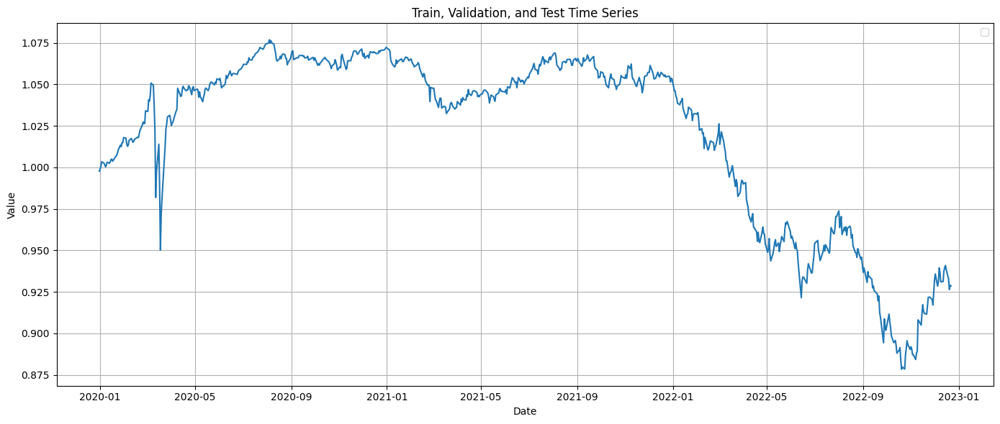

In [429]:
plt.figure(figsize=(14, 6))

# for i, ticker in enumerate(close_df.columns):
#     for idx, label, line in zip([train_indices, val_indices, test_indices], ["Train", "Val", "Test"], [1,2,3]):
plt.plot(test_idx, (y_test[:, :1, :].squeeze(1) + 1).cumprod(0)[:,0])

# plt.plot(close_df.loc[test_indices]["AGG"] - 97)



plt.title('Train, Validation, and Test Time Series')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [430]:
from torch.utils.data import Dataset


class Jitter:
    def __init__(self, sigma=0.03):
        self.sigma = sigma

    def __call__(self, x):
        noise = torch.randn_like(x) * self.sigma
        return x + noise
    
class AugmentedTimeSeriesDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        if self.transform:
            x = self.transform(x)
        return x, self.y[idx]
    

sigma = 0.03 * X_train_tensor.std().item()
jitter = Jitter(sigma=sigma)

train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

## Model Defs

In [431]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CustomTCN(nn.Module):
    def __init__(self):
        super(CustomTCN, self).__init__()

        self.conv1 = nn.Conv1d(in_channels=4, out_channels=16, kernel_size=3, padding=2, dilation=2)
        self.relu1 = nn.ReLU()

        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(1, 3), padding=(0, 1))
        self.relu2 = nn.ReLU()

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(32 * 1 * 50, 100)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(100, 4)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = x.transpose(1, 2)  # (B, 4, 50) for Conv1d
        # x = F.pad(x, (2 * 2, 0))  # Causal padding for dilation=2
        x = self.conv1(x)        # (B, 16, 50)
        # x = x[:, :, -50:]
        x = self.relu1(x)

        x = x.unsqueeze(2)       # (B, 16, 1, 50)
        x = self.conv2(x)        # (B, 32, 1, 50)
        x = self.relu2(x)

        x = self.flatten(x)      # (B, 1600)
        x = self.fc1(x)          # (B, 100)
        x = self.relu3(x)
        x = self.fc2(x)          # (B, 4)
        # x /= 5
        x = self.softmax(x)
        return x
    

# model = CustomTCN()
# print(sum(p.numel() for p in model.parameters() if p.requires_grad))

In [432]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CausalConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size):
        super().__init__()
        self.pad = kernel_size - 1
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size)

    def forward(self, x):
        # Left-pad to preserve causality
        x = F.pad(x, (self.pad, 0))  # (left, right)
        return self.conv(x)

# class CNNAllocatorCausal(nn.Module):
#     def __init__(self, input_channels=4, time_steps=50, hidden_size=100, temperature=1.0, dropout_rate=0.3):
#         super().__init__()
#         self.temperature = temperature

#         self.conv1 = CausalConv1d(in_channels=input_channels, out_channels=32, kernel_size=3)
        
#         self.conv2 = CausalConv1d(in_channels=32, out_channels=64, kernel_size=3)
#         self.relu = nn.ReLU()

#         self.dropout = nn.Dropout(dropout_rate)

#         self.flatten = nn.Flatten()
#         self.fc1 = nn.Linear(64 * time_steps, hidden_size)
#         self.fc2 = nn.Linear(hidden_size, input_channels)

#     def forward(self, x):
#         # x: (B, T, N) → (B, N, T)
#         x = x.transpose(1, 2)

#         x = self.relu(self.conv1(x))
#         x = self.dropout(x)

#         x = self.relu(self.conv2(x))
#         x = self.dropout(x)

#         x = self.flatten(x)
#         x = self.relu(self.fc1(x))
#         x = self.dropout(x)

#         x = self.fc2(x)
#         return F.softmax(x / self.temperature, dim=1)




In [433]:
def MR_Loss(weights, y):
    weights = weights.unsqueeze(1)
    return (-weights * y).mean()

def enhanced_loss(weights, y, lambda_risk=1.0, lambda_entropy=0.01):
    # print(weights.shape, y.shape)

    portfolio_returns = (weights * y.sum(dim=1)).sum(dim=1)
    # total_return = torch.einsum("bi,bij->b", weights, y.sum(dim=1)) 


    loss = -portfolio_returns.mean()
    loss += lambda_risk * portfolio_returns.var()
    loss -= lambda_entropy * (-(weights * torch.log(weights + 1e-8)).sum(dim=1).mean())

    return loss

In [434]:
def sharpe_ratio(returns):
    mean_return = np.mean(returns)
    volatility = np.std(returns)
    return mean_return / volatility

def max_drawdown(cum_returns):
    peak = np.maximum.accumulate(cum_returns)
    drawdowns = (cum_returns - peak) / (peak + 1e-8)
    return -drawdowns.min()

def entropy(weights):
    entropy = -torch.sum(weights * torch.log(weights + 1e-8), dim=1)  # (T,)
    return entropy

def mean_entropy(weights):
    entropy = -torch.sum(weights * torch.log(weights + 1e-8), dim=1)  # (T,)
    return entropy.mean().item()

In [435]:
def reallocte_weights(weights, step):
    n = weights.shape[0]
    weights = weights[::step]
    weights = weights.unsqueeze(1).repeat(1, step, 1).view(-1, 4)[:n]
    return weights


In [456]:
class CustomSoftmax(nn.Module):
    def __init__(self, dim: int = -1):
        super(CustomSoftmax, self).__init__()
        self.dim = dim

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x_exp = torch.exp(x)
        return  x_exp * (1 / x_exp.sum(dim=self.dim).unsqueeze(self.dim))

class SimpleAssetAllocationModel(nn.Module):
    def __init__(self, input_channels=4, output_channels=4):
        super(SimpleAssetAllocationModel, self).__init__()
        
        input_size = input_channels
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, output_channels)
        self.softmax = CustomSoftmax(dim=-1)

        # self.fc4 = nn.Linear(4*50, 4)

    def forward(self, x):

        x = torch.flatten(x, start_dim=-2)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return self.softmax(x)    
    
class CNNAllocatorCausal(nn.Module):
    def __init__(self, input_channels=4, time_steps=50, hidden_size=100, dropout_rate=0.3):
        super().__init__()

        self.conv1 = nn.Conv1d(in_channels=input_channels, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * time_steps, hidden_size)
        self.fc2 = nn.Linear(hidden_size, input_channels)
        self.softmax = CustomSoftmax(dim=-1)

    def forward(self, x):
        # x: (B, T, N) → (B, N, T)
        x = x.transpose(1, 2)

        x = self.relu(self.conv1(x))
        # x = self.dropout(x)

        x = self.relu(self.conv2(x))
        # x = self.dropout(x)

        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        # x = self.dropout(x)

        x = self.fc2(x)
        
        return self.softmax(x)

class UniformModel(nn.Module):
    def __init__(self):
        super(UniformModel, self).__init__()

    def forward(self, x):
        b = x.shape[0]
        return torch.full((b, n_assets), 1/n_assets, device=x.device, dtype=x.dtype)
    
class FixedWeightModel(nn.Module):
    def __init__(self, default_weights):
        super(FixedWeightModel, self).__init__()
        self.weights = default_weights
    def forward(self, x):
        b = x.shape[0]
        return self.weights.to(x.device, dtype=x.dtype).expand(b, -1)

## Experiments

In [437]:
import itertools, json, time

def grid_to_sets(grids):
    if not isinstance(grids, list):
        grids = [grids]  # Wrap single grid in a list

    all_combinations = []
    for grid in grids:
        keys = grid.keys()
        combinations = [dict(zip(keys, values)) for values in itertools.product(*grid.values())]
        all_combinations.extend(combinations)

    return all_combinations

def model_file_name(params):
    model_name = ",".join(
            f"{key}={val}" for key, val in params.items() if val is not None
        ) + ".pth"
    return model_name

In [438]:
def get_portfiolio_value(model, data, rebalance_freq):
    portfolio_values = []
    x, y = data[0], data[1].numpy()

    model.eval()
    n = y.shape[0]
    total_value = 1

    weights = []

    for t in range(0, n, rebalance_freq):
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights
        weights.extend([current_weights] * rebalance_freq)
        portfolio_values.extend((1 + y[t:t+rebalance_freq]).cumprod(0) * asset_values)
        asset_values *= (1 + y[t:t+rebalance_freq]).prod(0)
        total_value = asset_values.sum()

    portfolio_values = np.array(portfolio_values)
    weights = np.array(weights)

    return portfolio_values.sum(1), weights[:n], portfolio_values

In [439]:
def run_experiment(model, data, experiment={}):

    # print(experiment)
    params = experiment.get("params", {})
    # print(params)
    rebalance_freq = params.get("rebalance_freq", 252)
    # print(rebalance_freq)
    x, y = data
    model.eval()
    n = y.shape[0]

    # weights = model(x)
    # weights = reallocte_weights(weights, rebalance_freq)

    # print(weights.shape)



    # portfolio_values, weights, holdings = get_portfiolio_value(model, data, rebalance_freq)

    portfolio_values,weights,holdings = get_portfiolio_value(model, data, rebalance_freq)

    # weights = []
    # holdings = []
    

    weights = torch.tensor(weights).squeeze(1)
    holdings = torch.tensor(holdings).squeeze(1)


    # returns = portfolio_values.
    cum_returns = portfolio_values - 1

    returns = (portfolio_values[1:] - portfolio_values[:-1]) / portfolio_values[:-1]

    # Daily metrics
    mean_return = np.mean(returns)
    std_return = np.std(returns)
    sharpe = sharpe_ratio(returns)

    # # Annualized versions
    # annual_return = mean_return * trading_days
    # annual_volatility = std_return * np.sqrt(trading_days)
    # annual_sharpe = annual_return / annual_volatility if annual_volatility > 0 else 0.0

    metrics = {
        "expected_return": cum_returns[-1].item(),
        "shape": sharpe,
        # "annual_return": annual_return,
        # "annual_volatility": annual_volatility,
        # "annual_sharpe_ratio": annual_sharpe,
        "max_drawdown": max_drawdown(portfolio_values),
        "mean_entropy": mean_entropy(weights),
        "mean_return": mean_return,
        "std_return": std_return,
    }

    raw = {
        "weights": weights,
        "returns": returns,
        "cum_returns": cum_returns,
        "holdings": holdings,
    }

    return {"metrics": metrics, "raw": raw}




In [440]:
def label_from_params(params, experiments):
    nested = [list(v["params"].items()) for k, v in experiments.items()]

    ps = {}
    for k,v in [item for sublist in nested for item in sublist]:
        if k in ps:
            ps[k].add(v)
        else:
            ps[k] = {v}

    params_to_use = []

    for k,v in ps.items():
        if len(v) > 1:
            params_to_use.append(k)

    if "label" in params:
        label = params["label"] + " "
    else:
        label = ""

    return label + " ".join(
                f"{key}={val}" for key, val in params.items() if key in params_to_use and key != "label"
            )

In [441]:
def get_experiment_model(model_fn, experiment_path, params_grid, loss_fn_fn):
    experiments = {}

    train_result_path = os.path.join(experiment_path, "train_results.csv")
    os.makedirs(os.path.dirname(train_result_path), exist_ok=True)
    if os.path.exists(train_result_path):
        with open(train_result_path, 'r') as file:
            train_results = json.load(file)
    else:
        train_results = {}

    for params in grid_to_sets(params_grid):
        name = f"{model_file_name(params)}"
        model_path = os.path.join(experiment_path, name)

        if "seed" in params:
            set_seed(params["seed"])

        model = model_fn(params)
        loss_fn = loss_fn_fn(params)

        # model = SimpleAssetAllocationModel(n_assets * lookback, n_assets)
        # model = BoundedModule(model, X_train_tensor).to(device)

        if os.path.exists(model_path):
            print("Loading", label_from_params(params, experiments))
            model.load_state_dict(torch.load(model_path, map_location=device))
        else:
            print("Training", label_from_params(params, experiments))
            start_time = time.time()
            train_losses, val_losses = train_model_final(model, device, train_loader, val_loader, loss_fn, params)
            train_time = time.time() - start_time
            torch.save(model.state_dict(), model_path)
            train_results[model_path] = {"train_time": train_time, "train_losses": train_losses, "val_losses": val_losses}
            with open(train_result_path, 'w') as file: 
                json.dump(train_results, file, indent=4)
            
        experiments[name] = {"model": model, "params": params, "results": {}, "train_results": train_results[model_path] }
    return experiments

In [684]:
def default_linestyle_map(params):
    return "-"

def display_train_results(experiments):
    plt.figure(figsize=(10, 6))
    colors = cm.get_cmap('tab10')

    for idx, (_, experiment) in enumerate(experiments.items()):
        if "train_results" not in experiment:
            continue
        label = label_from_params(experiment["params"], experiments)
        
        data = experiment["train_results"]
        epochs = list(range(1, len(data["train_losses"]) + 1))
        color = colors(idx % 10) 

        plt.plot(epochs, data["train_losses"], label=f"{label} - Train", linestyle='-', color=color)
        plt.plot(epochs, data["val_losses"], label=f"{label} - Val", linestyle='--', color=color)

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Losses")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map=default_linestyle_map):
    metrics_df  = pd.DataFrame({label_from_params(v["params"], experiments): v['results'][dataset_key]["metrics"] for k, v in experiments.items()}).T
    metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)
    display(metrics_df)

    plt.figure(figsize=(10, 6))
    for params, cr in [(v["params"], v['results'][dataset_key]["raw"]["cum_returns"]) for k, v in experiments.items()]:

        print(cr.shape)
        plt.plot(dataset_idx, cr, label=label_from_params(params, experiments), linestyle=linestyle_map(params))

    plt.title(f"Cumulative Returns of Different Models ({dataset_key.title()})")
    plt.xlabel("Time Step")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    ncols = 2
    nrows = math.ceil(len(experiments.items()) / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
    axes = axes.flatten()

    # Loop through and plot
    for i, (params, weights) in enumerate([(v["params"], v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]):
        ax = axes[i]
        ax.stackplot(dataset_idx, weights.T.detach().numpy(), labels=asset_names)
        ax.set_title(f'Stacked Area Plot of Asset Allocations ({label_from_params(params, experiments)})')
        ax.set_xlabel('Time Step')
        ax.set_ylabel('Proportion')
        ax.legend(loc='upper left')
        ax.grid(True)

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
    axes = axes.flatten()

    # Loop through and plot
    for i, (params, holding) in enumerate([(v["params"], v['results'][dataset_key]["raw"]["holdings"]) for k, v in experiments.items()]):
        ax = axes[i]
        ax.plot(dataset_idx, holding.detach().numpy(), label=asset_names)
        ax.set_title(f'Stacked Area Plot of Asset Allocations ({label_from_params(params, experiments)})')
        ax.set_xlabel('Time Step')
        ax.set_ylabel('Proportion')
        ax.legend(loc='upper left')
        ax.grid(True)

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 6))

    for params, weights in [(v["params"], v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]:
        if "epochs" not in params:
            continue
        plt.plot(dataset_idx, entropy(weights).detach().numpy(), label=label_from_params(params, experiments))

    plt.axhline(np.log(n_assets), color='gray', linestyle='--', label='Max Entropy (Uniform)')
    plt.title(f'Allocation Entropy Over Time ({dataset_key.title()})')
    plt.xlabel('Date')
    plt.ylabel('Entropy')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return metrics_df

    

## Standard model vs baselines

# Param tuning entropy

Loading 
Loading 
Loading lambda_entropy=0.001
Loading lambda_entropy=0.01
Loading lambda_entropy=0.05
Loading lambda_entropy=0.1
Loading lambda_entropy=0.5
Loading lambda_entropy=1.0


/tmp/ipykernel_4677/4055398947.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


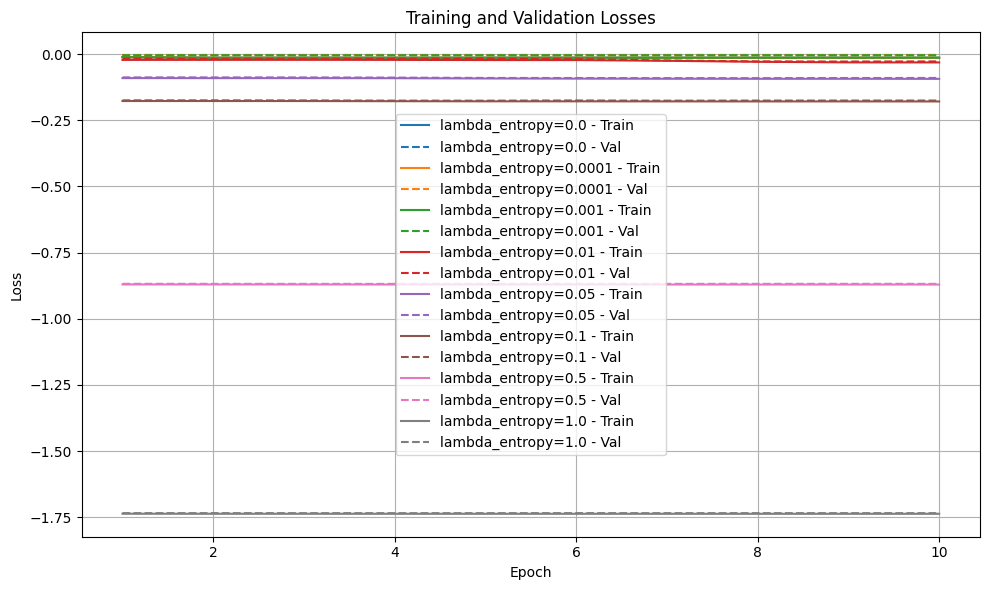

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_4677/4055398947.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
lambda_entropy=0.0,0.483,0.0473,0.818,0.000409,0.00417,0.0883
lambda_entropy=0.0001,0.483,0.0473,0.818,0.000442,0.00417,0.0883
lambda_entropy=0.001,0.484,0.0473,0.818,0.00501,0.00417,0.0882
lambda_entropy=0.01,21.9,0.104,0.341,0.912,0.00547,0.0526
lambda_entropy=0.05,4.07,0.0924,0.211,1.33,0.00256,0.0276
lambda_entropy=0.1,2.32,0.0815,0.217,1.37,0.00188,0.0231
lambda_entropy=0.5,1.38,0.0681,0.181,1.39,0.00138,0.0202
lambda_entropy=1.0,1.25,0.065,0.184,1.39,0.0013,0.02
Uniform Baseline,0.356,0.0289,0.452,1.39,0.000792,0.0274


(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)


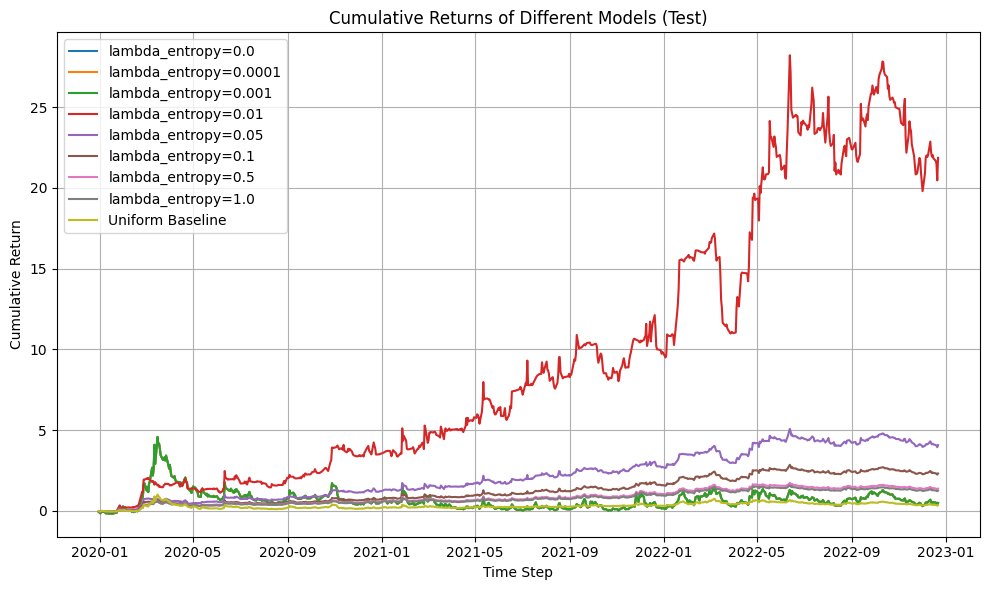

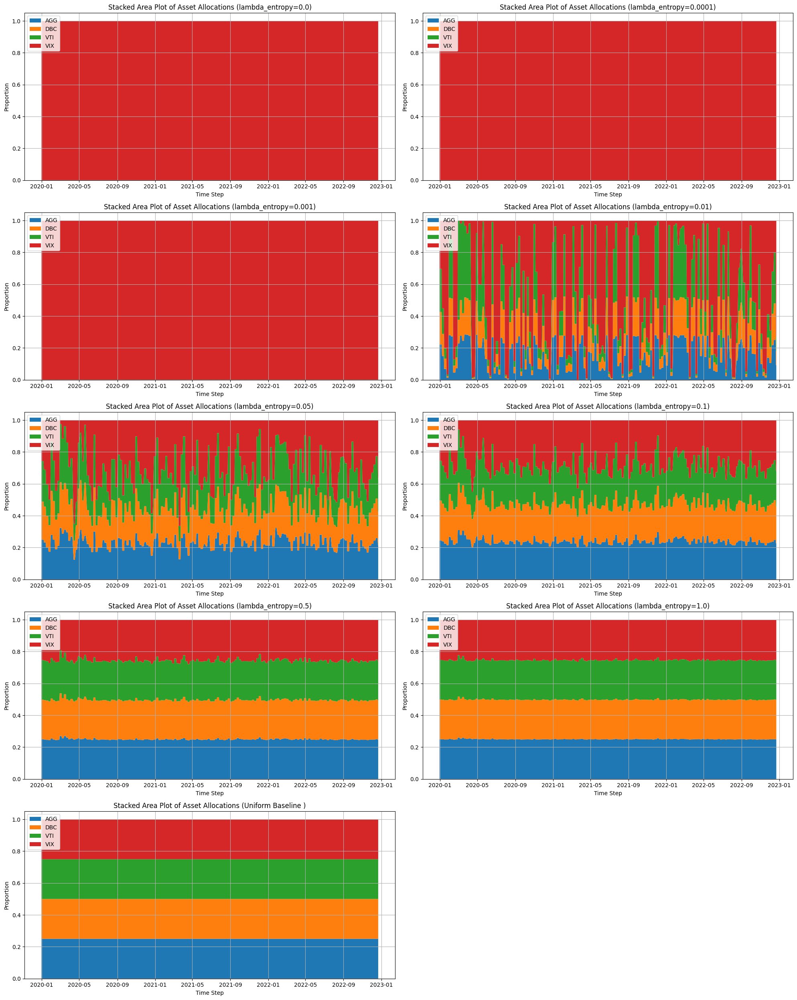

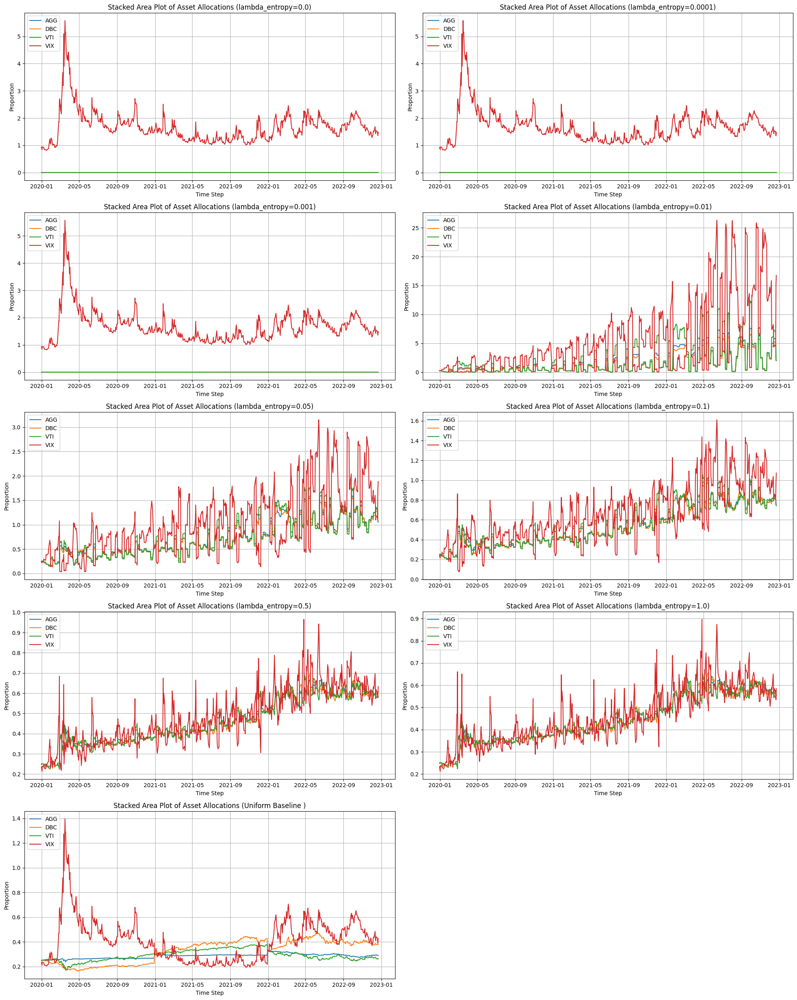

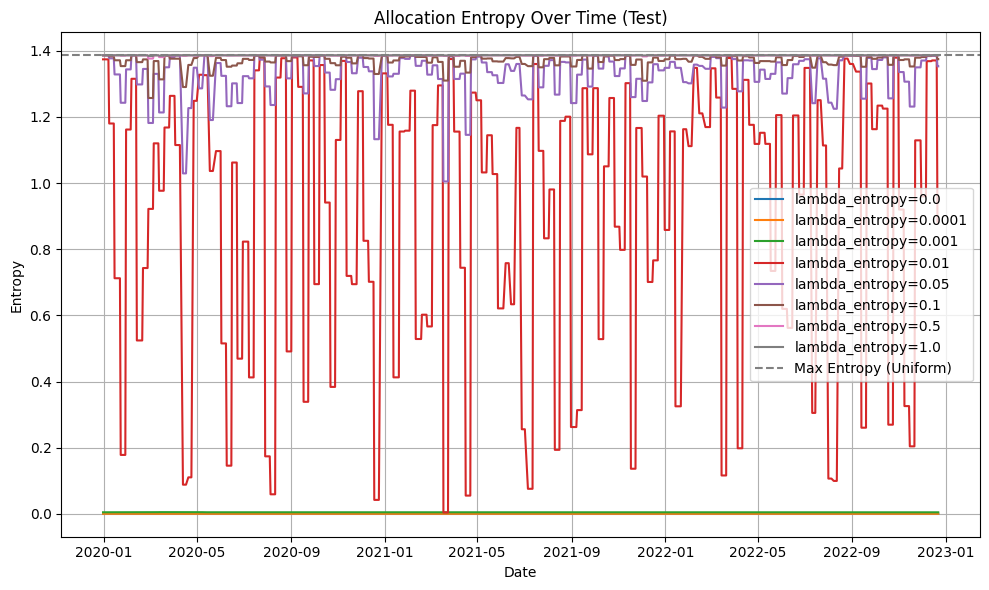

--------------------
Train RESULTS
--------------------


/tmp/ipykernel_4677/4055398947.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
lambda_entropy=0.0,-0.422,0.0357,0.887,0.000409,0.00284,0.0795
lambda_entropy=0.0001,-0.422,0.0357,0.887,0.000442,0.00284,0.0795
lambda_entropy=0.001,-0.419,0.0357,0.886,0.00499,0.00284,0.0795
lambda_entropy=0.01,5.61e+04,0.0988,0.439,0.903,0.00467,0.0473
lambda_entropy=0.05,352,0.0889,0.249,1.33,0.00226,0.0255
lambda_entropy=0.1,53.3,0.0726,0.202,1.37,0.00156,0.0215
lambda_entropy=0.5,7.62,0.0484,0.198,1.39,0.000902,0.0186
lambda_entropy=1.0,5.54,0.0439,0.207,1.39,0.000806,0.0183
Uniform Baseline,0.654,0.0191,0.406,1.39,0.000414,0.0217


(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)


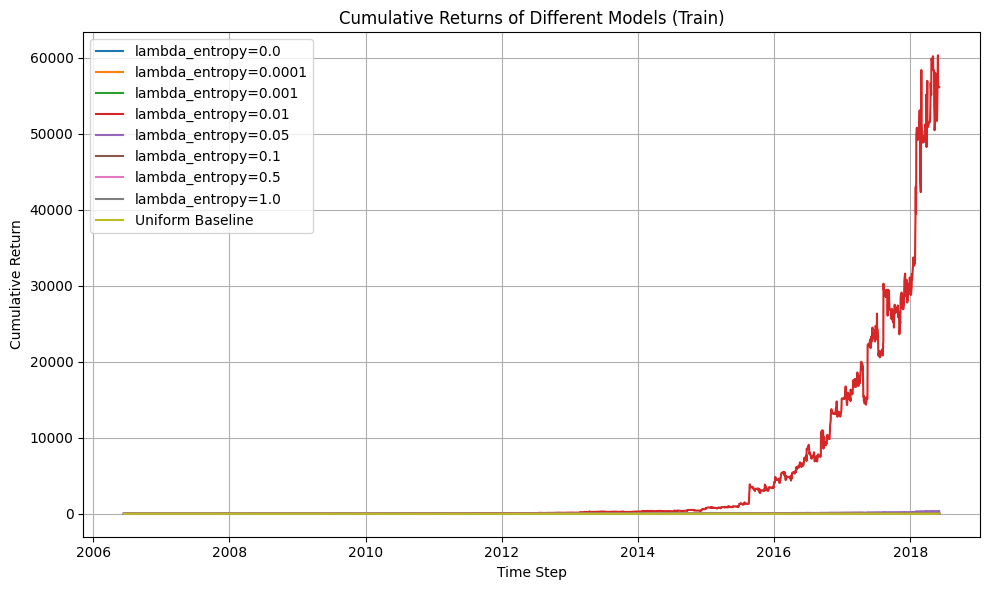

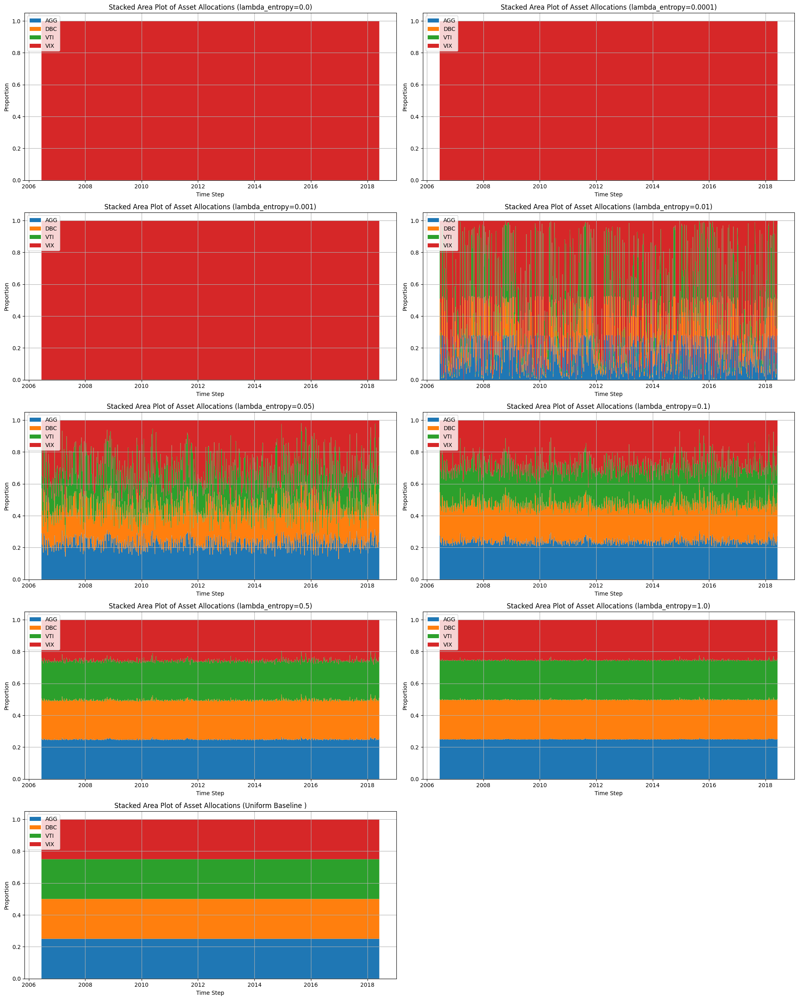

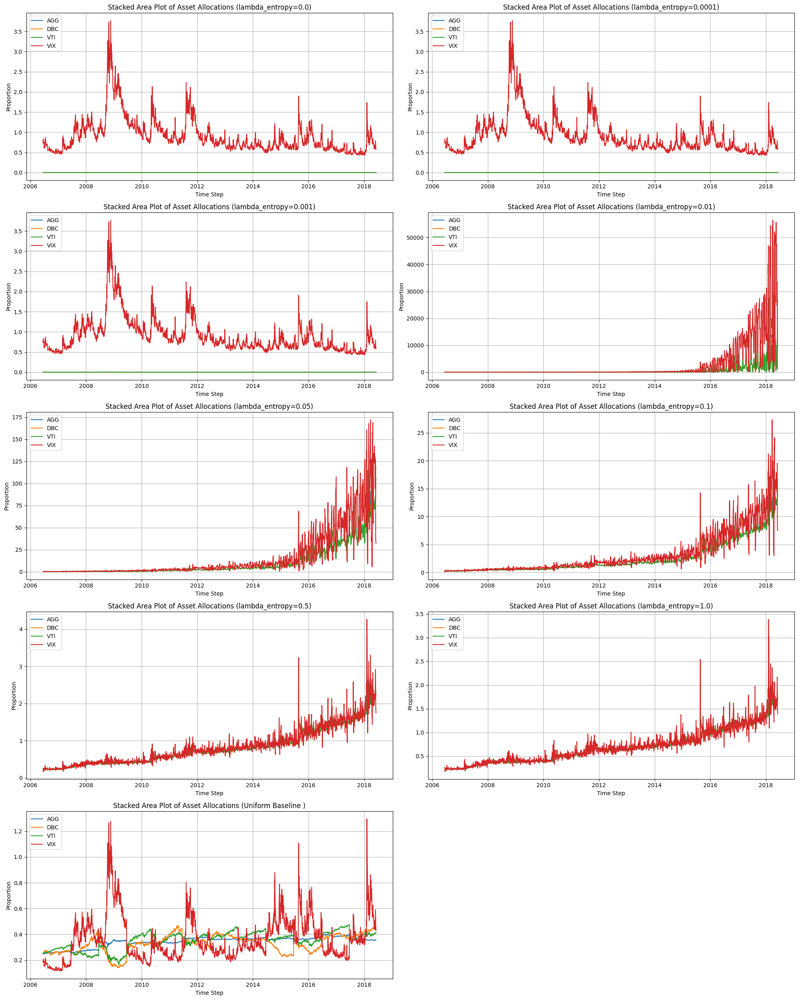

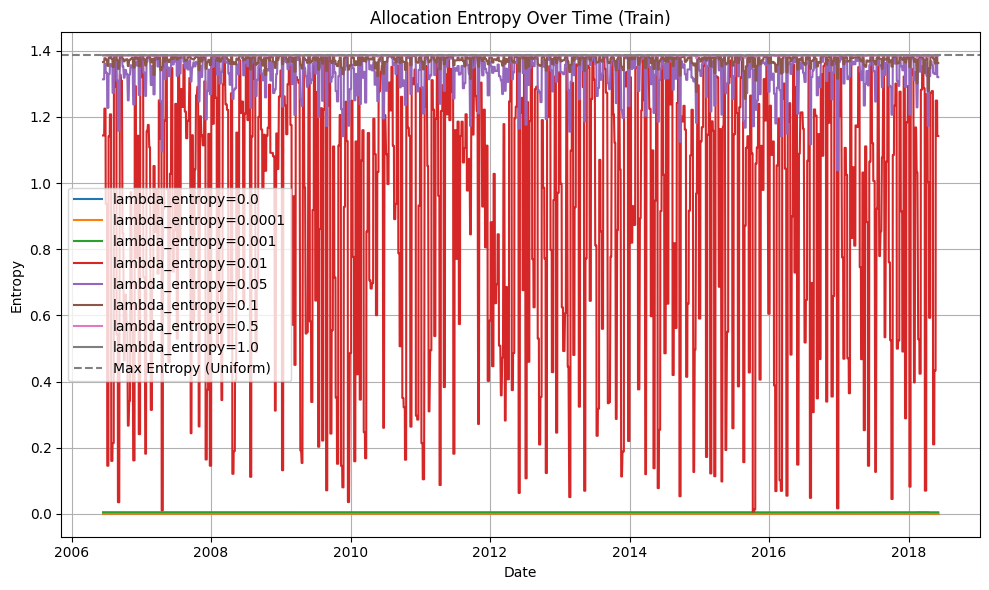

In [443]:

def loss_fn_fn(params):
    lambda_risk = 1.5
    lambda_entropy = params["lambda_entropy"]
    # alpha = params["alpha"]


    def loss_fn(x, y, model):
        weights_ = model(x)
        # ub_, lb_ = verified_bounds(model, x, 0.01, "CROWN-IBP")
        
        weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

        portfolio_returns = (weights * y).sum(1).sum(1)

        natural_loss = -portfolio_returns.mean() 

        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

        return natural_loss -  entropy_loss
    return loss_fn
    

def model_fn(params):

    if params["model"] == "CNN":
        model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"])
    else:
        model = SimpleAssetAllocationModel(4*lookback)

    return model

params_grids = [{
    "seed": [441],
    "epochs": [10],
    "lambda_entropy": [0.0, 1e-4, 1e-3, 1e-2, 0.05, 0.1, 0.5, 1.0],
    # "lambda_entropy": [0.0],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
},
]

experiment_path = "../experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

In [444]:
params_grids = [{
    "seed": [441,2,3],
    "epochs": [10],
    "lambda_entropy": [1e-2],
    "model": ["CNN"],
    "dropout": [0.1, 0],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
},
]

experiment_path = "../experiments/standard_model/"

experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

Loading 
Loading 
Loading dropout=0.1
Loading seed=2 dropout=0
Training seed=3 dropout=0.1
Epoch  1, Train Loss: -0.022497: Val Loss: -0.018975
Epoch  2, Train Loss: -0.023494: Val Loss: -0.012139


KeyboardInterrupt: 

## Param tuning - robust eps alpha first

In [ ]:
e = returns_df.loc[train_indices].std()
e = (e / e["VTI"]).to_numpy()

In [447]:

def robust_loss_fn_fn(params):
    lambda_entropy = params["lambda_entropy"]
    alpha = params["alpha"]
    robust_eps = params["robust_eps"]

    def loss_fn(x, y, model):
        weights_ = model(x)
        # ub_, lb_ = verified_bounds(model, x, 0.01, "IBP")

        eps_vector = torch.tensor(e*robust_eps, dtype=torch.float32, device=x.device)  # One ε per asset
        eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

        perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
        x_perturbed = BoundedTensor(x, perturbation)
        ub_, lb_ = model.compute_bounds(x=(x_perturbed,), method="CROWN-IBP")
        
        weights = weights_.unsqueeze(1).repeat(1, horizon, 1)
        ub = ub_.unsqueeze(1).repeat(1, horizon, 1)
        lb = lb_.unsqueeze(1).repeat(1, horizon, 1)

        portfolio_returns = (weights * y).sum(1).sum(1)
        worst_returns = torch.min(ub * y, lb * y).sum(1).sum(1)

        natural_loss = -portfolio_returns.mean() 
        robust_loss = -worst_returns.mean() 

        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = -lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

        return natural_loss * (1-alpha) + robust_loss * alpha + entropy_loss
    return loss_fn
    
def model_fn(params):
    if params["model"] == "CNN":
        model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"])
        bound_opts = {
            "optimize_bound_args": {
                "enable_alpha_crown": True,   # α-CROWN
                "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
                "optimizer": "adam",          
                "iteration": 5,              # α/β optimization steps
                "lr_alpha": 0.5,
                "lr_beta": 0.05,
                "pruning_in_iteration": True
            },
            "verbose":True,
            "conv_mode": "matrix"
        }
        model = BoundedModule(model, X_train_tensor, bound_opts=bound_opts).to(device)

    else:
        model = SimpleAssetAllocationModel(4*lookback) 
        model = BoundedModule(model, X_train_tensor).to(device)
        
    return model

params_grids = [{
    "seed": [2],
    "epochs": [5],
    "model": ["MLP"],
    "alpha": [0,0.01, 0.1],
    "robust_eps": [0.01, 0.001, 0.05, 0.0001],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.01]
},
]

experiment_path = "../experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

Loading 
Training 
Epoch  1, Train Loss: -0.021794: Val Loss: -0.019564


KeyboardInterrupt: 

## Param tuning - robust eps & alpha

In [ ]:
params_grids = [{
    "seed": [2],
    "epochs": [10],
    "model": ["MLP"],
    "alpha": [0.01, 0.1, 0.2, 0.3, 0.5, 0.75, 1],
    "robust_eps": [0.0001, 0.0005],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.01]
},
]

experiment_path = "../experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test"], [test_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    metrics_df = display_experiment_results(experiments, dataset_key, dataset_idx )

Training 
Epoch  1, Train Loss: -0.021790: Val Loss: -0.019554
Epoch  2, Train Loss: -0.023523: Val Loss: -0.021050
Epoch  3, Train Loss: -0.026845: Val Loss: -0.024428
Epoch  4, Train Loss: -0.029868: Val Loss: -0.025160


KeyboardInterrupt: 

In [ ]:
metrics_df  = pd.DataFrame({label_from_params(v["params"], experiments): v['results']["test"]["metrics"] | v["params"] for k, v in experiments.items()}).T

to_plot = metrics_df[metrics_df["robust_eps"] == 0.0005]

plt.figure()
# plt.plot(to_plot["alpha"], to_plot["shape"], label="Sharpe")
plt.plot(to_plot["alpha"], to_plot["max_drawdown"], label="MD")
plt.plot(to_plot["alpha"], to_plot["mean_entropy"], label="Entropy")
plt.legend()
plt.show()

to_plot = metrics_df[metrics_df["robust_eps"] == 0.0005]

plt.figure()
plt.plot(to_plot["alpha"], to_plot["mean_return"], label="MR")
plt.legend()
plt.show()

plt.figure()
plt.plot(to_plot["alpha"], to_plot["std_return"], label="MR")
plt.legend()
plt.show()
to_plot

KeyError: 'robust_eps'

## Final check sharpe

Training 
Epoch  1, Train Loss: 0.226597: Val Loss: 0.229778
Epoch  2, Train Loss: 0.051464: Val Loss: 0.191183
Epoch  3, Train Loss: 0.046215: Val Loss: 0.189205
Epoch  4, Train Loss: 0.040950: Val Loss: 0.189370
Epoch  5, Train Loss: 0.041906: Val Loss: 0.193316
Epoch  6, Train Loss: 0.028997: Val Loss: 0.172488
Epoch  7, Train Loss: 0.000664: Val Loss: 0.138283
Epoch  8, Train Loss: -0.026388: Val Loss: 0.119145
Epoch  9, Train Loss: -0.050806: Val Loss: 0.104044
Epoch 10, Train Loss: -0.058510: Val Loss: 0.098262


/tmp/ipykernel_50083/4055398947.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


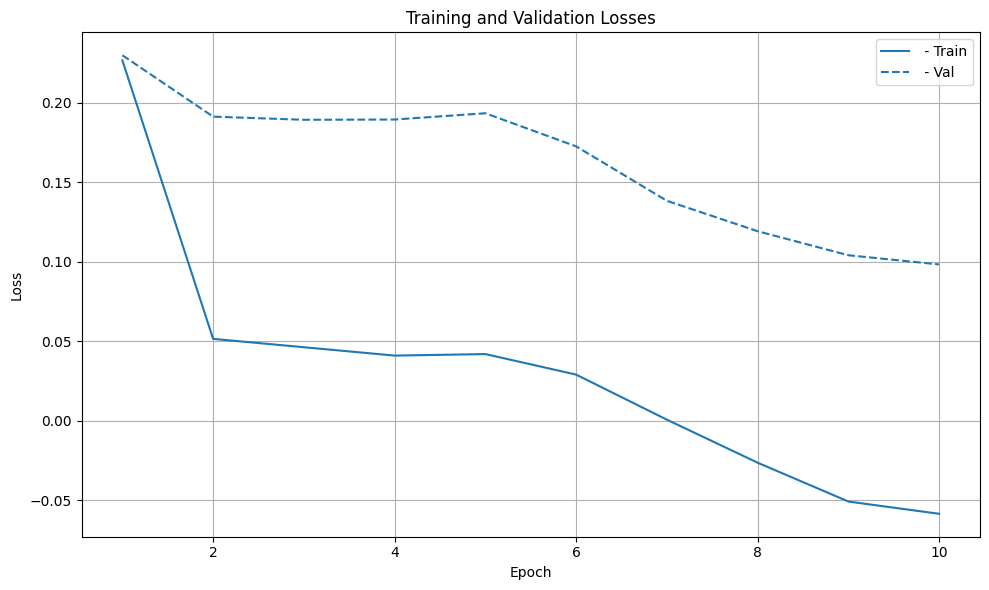

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_50083/4055398947.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
,9.97,0.0782,0.476,0.238,0.00548,0.0701
Uniform Baseline,0.356,0.0289,0.452,1.39,0.000792,0.0274


(752,)
(752,)


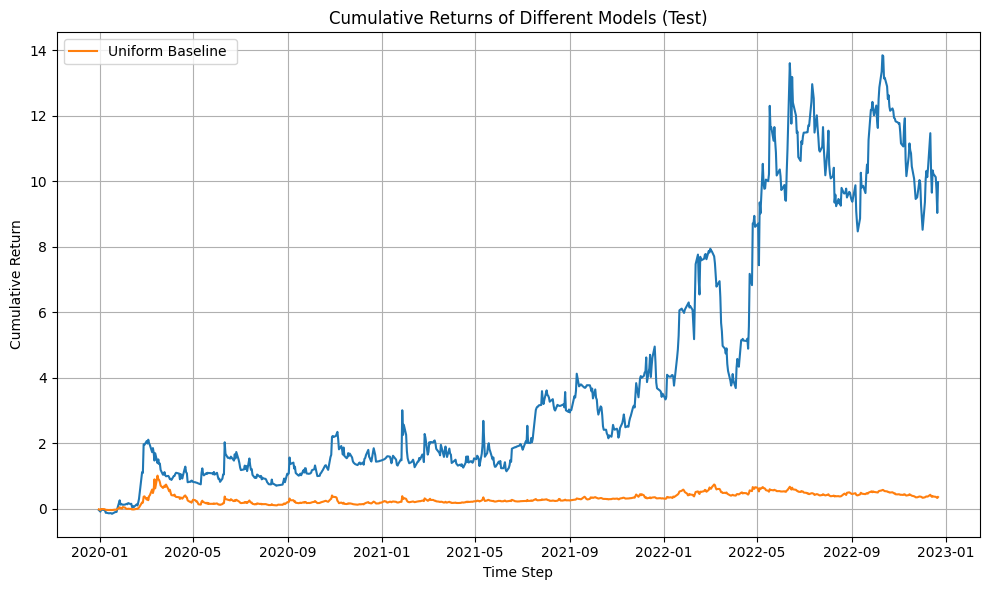

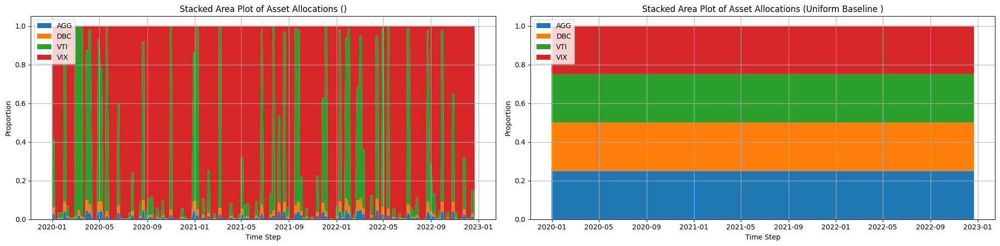

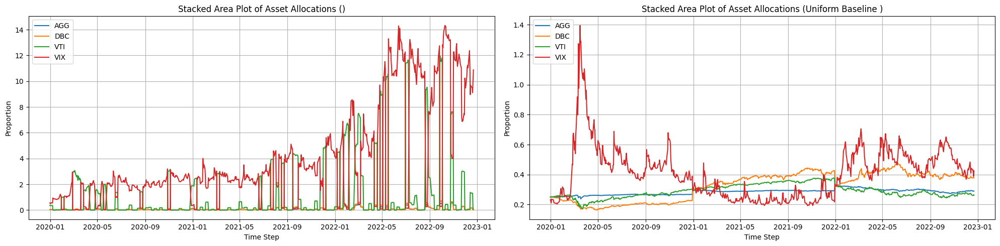

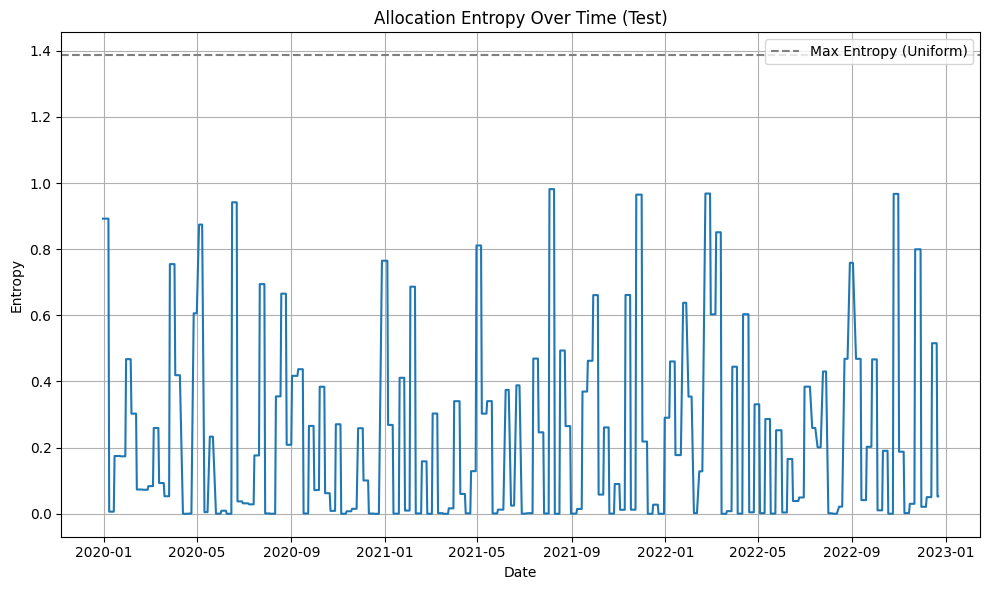

In [ ]:

def sharpe_loss_fn_fn(params):
    lambda_risk = 1.5
    lambda_entropy = params["lambda_entropy"]
    # alpha = params["alpha"]


    def loss_fn(x, y, model):
        weights_ = model(x)
        # ub_, lb_ = verified_bounds(model, x, 0.01, "CROWN-IBP")
        
        weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

        

        portfolio_returns = (weights * y).sum(1).sum(1)

        # print(portfolio_returns.shape)

        natural_loss = -(portfolio_returns.mean(0) - 0.0164)/portfolio_returns.std(0) 
        

        # print(portfolio_returns)

        # clamped_weights = weights.clamp(min=1e-8)
        # entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

        return natural_loss #-  entropy_loss
    return loss_fn
    

params_grids = [{
    "seed": [53],
    "epochs": [10],
    "model": ["MLP"],
    # "alpha": [0.01, 0.1, 0.2, 0.3, 0.5],
    # "robust_eps": [0.0001, 0.0005],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.01]
},
]

experiment_path = "../experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, sharpe_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test"], [test_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    metrics_df = display_experiment_results(experiments, dataset_key, dataset_idx )

# Standard vs robust

In [ ]:
params_grids = [{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": [0.0005],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.01]
},
{
    "seed": [3],
    "epochs": [5],
    "model": ["CNN"],
    "alpha": [0],
    "robust_eps": [0.0000],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.01]
},
]

experiment_path = "../experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

KeyError: 'loss'

In [458]:
def bound_model(model, x, eps, method, batch_size=1):
    # batch_size = 8
    upper_batches = []
    lower_batches = []
    N = x.shape[0]
    model.get_split_nodes()

    out_shape = (N, 4)
  

    for i in tqdm(range(0, N, batch_size)):
        x_batch = x[i: i+batch_size]
        eps_vector = torch.tensor(eps, dtype=torch.float32, device=x_batch.device)  # One ε per asset
        eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

        perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
        x_perturbed = BoundedTensor(x_batch, perturbation)
        lb, ub = model.compute_bounds(x=(x_perturbed,), method=method)
        lower_batches.append(lb)
        upper_batches.append(ub)

    lb_out = torch.zeros(out_shape, device=x.device)
    ub_out = torch.ones(out_shape, device=x.device)

    lower_all = torch.cat(lower_batches, dim=0)
    upper_all = torch.cat(upper_batches, dim=0)

    # print(lower_all.shape, lb_out.shape)

    lower_all = torch.max(lower_all, lb_out)
    upper_all = torch.min(upper_all, ub_out)

    return lower_all, upper_all

model = experiments["seed=3,epochs=10,model=CNN,alpha=0.5,robust_eps=0.0005,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]["model"]
bound_model(model, X_test_tensor[:5], e/100, "CROWN")

100%|██████████| 5/5 [00:00<00:00, 13.43it/s]


(tensor([[0.0724, 0.0831, 0.1082, 0.4190],
         [0.0697, 0.0800, 0.1050, 0.4313],
         [0.0768, 0.0862, 0.1116, 0.4855],
         [0.0742, 0.0841, 0.1092, 0.4710],
         [0.0735, 0.0838, 0.1087, 0.4710]]),
 tensor([[0.1917, 0.1846, 0.2072, 0.8487],
         [0.1853, 0.1804, 0.2035, 0.8655],
         [0.1635, 0.1627, 0.1871, 0.8004],
         [0.1699, 0.1666, 0.1915, 0.8208],
         [0.1704, 0.1661, 0.1915, 0.8236]]))

In [ ]:
def pgd_attack(model, x_init, y, eps, loss_fn= nn.MSELoss(), n_steps=100, step_size=0.1):
    model.eval()

    attack_point = x_init.clone().detach()
    attack_loss = (-float('inf')) * torch.ones(x_init.shape[0], device=x_init.device)

    with torch.enable_grad():
        adv_input = x_init.clone().detach().requires_grad_(True)

        for _ in range(n_steps):
            if adv_input.grad is not None:
                adv_input.grad.zero_()

            adv_outs = model(adv_input)
            obj = -loss_fn(adv_outs, y)

            attack_point = torch.where(
                (obj >= attack_loss).view((-1,) + (1,) * (x_init.dim() - 1)),
                adv_input.detach().clone(), attack_point)
            attack_loss = torch.where(obj >= attack_loss, obj.detach().clone(), attack_loss)

            grad = torch.autograd.grad(obj.sum(), adv_input)[0]
            adv_input = adv_input + step_size * grad.sign()

            # Project to L∞ ball
            delta = torch.clamp(adv_input - x_init, min=-eps, max=eps)
            adv_input = (x_init + delta).detach().requires_grad_(True)

        # Final selection
        adv_outs = model(adv_input)
        obj = loss_fn(adv_outs, y)
        attack_point = torch.where(
            (obj >= attack_loss).view((-1,) + (1,) * (x_init.dim() - 1)),
            adv_input.detach().clone(), attack_point)

    return attack_point

def loss_fn(x, y):
    loss = ((1 + y).prod(1) * x).sum(1)
    return loss

In [ ]:
test_period = 20
test_eps = [1/100, 1/200]


In [589]:
test_period = 50
test_eps = [1/200, 1/500, 1/1000]
# test_eps = [1/100]#, 1/500, 1/1000]

for model_name, experiment in experiments.items():
    x = X_test_tensor[::5][:test_period]
    model = experiment["model"]
    experiment["results"]["test"]["bounds"] = {}
    experiment["results"]["test"]["bounds"]["None"] = model(x)
    
    for method in ["IBP", "CROWN"]: # "CROWN-Optimized"
        experiment["results"]["test"]["bounds"][method] = {}
      
        for eps in test_eps:
            eps_vector = e * eps
            print(f"Bounding at {eps} with {method}")
            experiment["results"]["test"]["bounds"][method][eps] = bound_model(model, x, eps_vector, method, batch_size=1)

Bounding at 0.005 with IBP


100%|██████████| 50/50 [00:00<00:00, 212.50it/s]


Bounding at 0.002 with IBP


100%|██████████| 50/50 [00:00<00:00, 171.39it/s]


Bounding at 0.001 with IBP


100%|██████████| 50/50 [00:00<00:00, 175.53it/s]


Bounding at 0.005 with CROWN


100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


Bounding at 0.002 with CROWN


100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Bounding at 0.001 with CROWN


100%|██████████| 50/50 [00:02<00:00, 17.41it/s]


Bounding at 0.005 with IBP


100%|██████████| 50/50 [00:00<00:00, 257.45it/s]


Bounding at 0.002 with IBP


100%|██████████| 50/50 [00:00<00:00, 252.50it/s]

Bounding at 0.001 with IBP

100%|██████████| 50/50 [00:00<00:00, 273.03it/s]


Bounding at 0.005 with CROWN


100%|██████████| 50/50 [00:04<00:00, 12.23it/s]


Bounding at 0.002 with CROWN


100%|██████████| 50/50 [00:02<00:00, 17.99it/s]


Bounding at 0.001 with CROWN


100%|██████████| 50/50 [00:02<00:00, 22.27it/s]


Bounding at 0.005 with IBP


100%|██████████| 50/50 [00:00<00:00, 1263.84it/s]


Bounding at 0.002 with IBP


100%|██████████| 50/50 [00:00<00:00, 1431.10it/s]


Bounding at 0.001 with IBP


100%|██████████| 50/50 [00:00<00:00, 1654.79it/s]


Bounding at 0.005 with CROWN


100%|██████████| 50/50 [00:00<00:00, 833.10it/s]


Bounding at 0.002 with CROWN


100%|██████████| 50/50 [00:00<00:00, 681.19it/s]


Bounding at 0.001 with CROWN


100%|██████████| 50/50 [00:00<00:00, 801.11it/s]


In [590]:
for model_name, experiment in experiments.items():
    if "epochs" not in experiment["params"]:
        continue
    model = experiment["model"]
    # print(model)
    experiment["results"]["test"]["PGD"] = {}
    x = X_test_tensor[::5][:test_period]
    y = y_test_tensor[::5][:test_period]
    experiment["results"]["test"]["PGD_AdvX"]  = {}
    experiment["results"]["test"]["PGD_AdvY"]  = {}
    for eps in test_eps:
        attack_point = pgd_attack(model, x, y, eps, loss_fn)
        experiment["results"]["test"]["PGD_AdvX"][eps] = attack_point
        experiment["results"]["test"]["PGD_AdvY"][eps] = model(attack_point)

In [591]:
for model_name, experiment in experiments.items():
    model = experiment["model"]
    # x = X_test_tensor[::5][:test_period]
    y = y_test_tensor[::5][:test_period]


    model_weights = experiment["results"]["test"]["bounds"]["None"]
    returns = experiment["results"]["test"]["returns"] = {}
    asset_returns = (y+1).prod(1)-1

    returns["None"] = (asset_returns * model_weights).sum(1)

   

    for method in ["IBP", "CROWN"]:
        returns[method] = {}
        for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
            ub, lb = bounds
            returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)

    if "epochs" not in experiment["params"]:
        continue

    returns["PGD"] = {}

    for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
        returns["PGD"][eps] = (asset_returns * weights).sum(1)
        print(returns["PGD"][eps])
        

tensor([-6.2635e-02, -9.7115e-02,  2.7216e-02,  2.2922e-01, -3.5087e-03,
        -8.1989e-02,  1.0921e-01,  5.2406e-01,  1.2334e-02, -7.7027e-02,
        -3.5785e-02,  5.2103e-02, -1.5932e-01, -1.1083e-02, -8.4472e-02,
        -5.8191e-02,  2.7334e-03, -1.0291e-01, -1.3928e-02,  2.9521e-02,
         4.2112e-03, -8.4889e-02,  3.1996e-01,  1.0384e-02, -2.5161e-04,
        -7.3432e-02,  3.0746e-03, -1.4144e-01,  3.4012e-03, -6.5983e-02,
         1.1264e-02, -9.3810e-02,  7.1078e-03,  1.4348e-01, -2.4542e-02,
        -2.0029e-02,  9.0100e-02, -7.3861e-02,  4.0443e-02, -5.4119e-02,
         2.3405e-02,  2.1817e-01,  2.5370e-02, -1.9787e-01,  5.7143e-03,
        -1.0725e-01,  1.4605e-03,  3.4989e-02, -2.5955e-02, -1.8240e-02])
tensor([-4.7839e-02, -8.8638e-02,  3.5477e-02,  2.6538e-01, -8.2453e-04,
        -4.7787e-02,  1.2466e-01,  1.2280e+00,  1.2505e-02, -2.7663e-02,
        -3.4916e-02,  7.3913e-02, -1.4854e-01,  2.9890e-02, -8.4468e-02,
        -5.8191e-02,  3.0860e-03,  7.4500e-03, -1.

In [593]:
for model_name, experiment in experiments.items():
    returns = experiment["results"]["test"]["returns"] 
    deltas = experiment["results"]["test"]["deltas"] = {}
    model_returns = returns["None"]

    for method, return_dict in returns.items():
        if method == "None":
            continue
        deltas[method] = {}
        for eps, ret in return_dict.items():
            deltas[method][eps] = ((ret + 1) -(model_returns+1))/ (model_returns+1)  

# data_roboust = experiments["seed=3,epochs=10,model=CNN,alpha=0.5,robust_eps=0.0005,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]["results"]["test"]["deltas"]["CROWN"]
# data_standard = experiments["seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]["results"]["test"]["deltas"]["CROWN"]


In [594]:
model_names = list(experiments.keys())
model_names.remove("Uniform Baseline")
model_names

['seed=3,epochs=10,model=CNN,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01,loss=Standard.pth',
 'seed=3,epochs=10,model=CNN,alpha=0.1,robust_eps=0.0001,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01,loss=CROWN-IBP.pth']

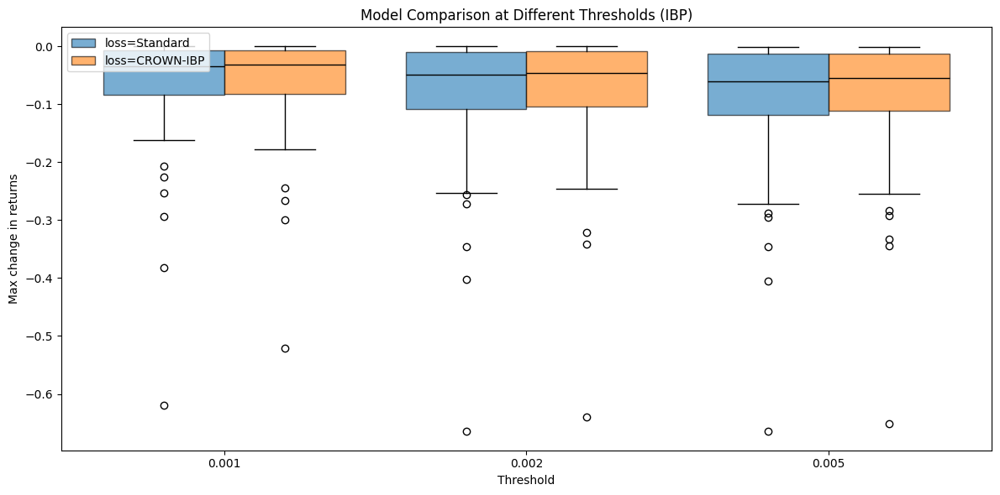

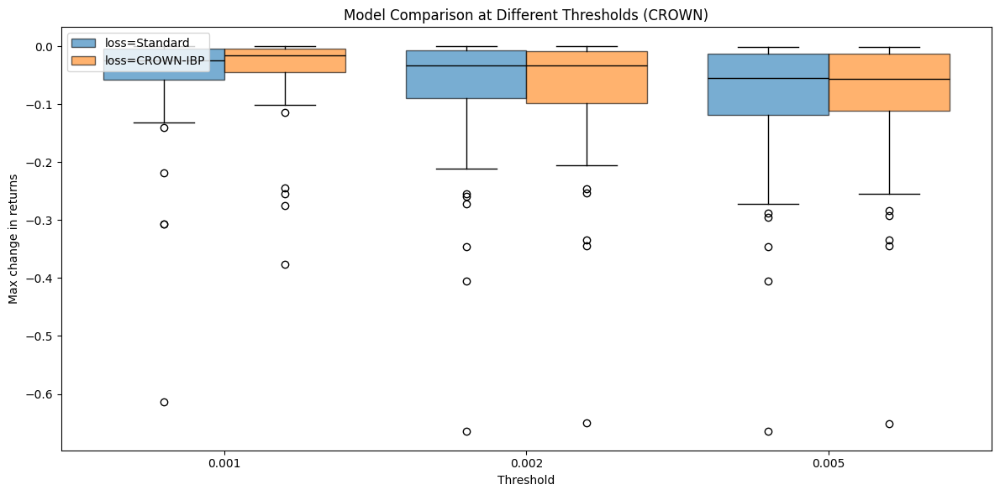

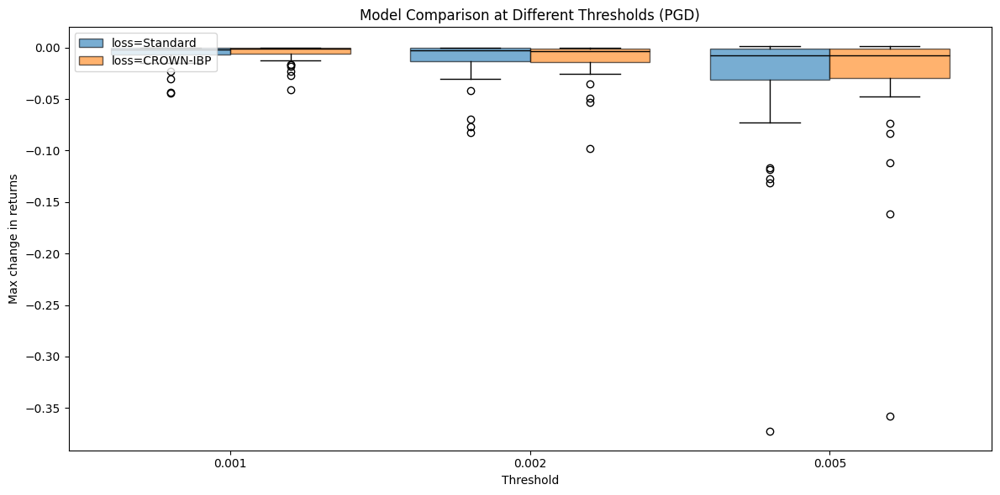

In [595]:
for method in ["IBP", "CROWN", "PGD"]:
    first = experiments[model_names[0]]["results"]["test"]["deltas"][method]
    thresholds = sorted(first.keys())
    n_thresh = len(thresholds)
    model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

    # prepare figure
    fig, ax = plt.subplots(figsize=(12,6))
    
    # width of each box, total span = width * n_models
    n_models = len(model_names)
    width = 0.8 / n_models
    ind = np.arange(n_thresh)
    
    # define a color cycle or list here if you like
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    
    # plot each model
    box_handles = []
    for i, model_name in enumerate(model_names):
        data = experiments[model_name]["results"]["test"]["deltas"][method]

        vals = [data[t] for t in thresholds]
        
        pos = ind - 0.4 + width*(i + 0.5)
        b = ax.boxplot(
            vals,
            positions=pos,
            widths=width,
            patch_artist=True,
            boxprops=dict(facecolor=colors[i % len(colors)], alpha=0.6),
            medianprops=dict(color='black'),
            manage_ticks=False
        )
        # grab one of the boxes for the legend
        box_handles.append(b["boxes"][0])
    
    # labels & legend
    ax.set_xticks(ind)
    ax.set_xticklabels([str(t) for t in thresholds])
    ax.set_xlabel('Threshold')
    ax.set_ylabel('Max change in returns')
    ax.set_title(f'Model Comparison at Different Thresholds ({method})')
    ax.legend(box_handles, model_labels, loc='upper left')
    
    plt.tight_layout()
    plt.show()


    

{0.005: tensor([-3.4015e-02, -2.1490e-02, -1.0948e-02, -3.0850e-02, -4.2845e-03,
        -6.5046e-02, -1.7246e-02, -3.7245e-01, -2.8124e-04, -1.1640e-01,
        -1.3768e-03, -2.5517e-02, -3.0641e-02, -5.4345e-02, -1.4388e-05,
        -1.0126e-06, -9.2145e-04, -1.2742e-01, -7.0446e-03, -8.3878e-04,
        -5.9122e-03, -1.4734e-03, -7.6243e-03, -1.0334e-03, -5.2420e-04,
        -3.8053e-03, -1.1039e-04, -7.3008e-02, -4.6834e-03, -3.5450e-04,
        -8.2864e-05, -4.7305e-02,  1.2066e-03, -3.1303e-02, -2.2104e-02,
        -1.4916e-02, -5.6965e-03, -2.8734e-02, -1.8537e-02, -2.2490e-02,
        -3.9116e-02, -1.3146e-01, -6.2727e-03, -1.1831e-01, -5.8709e-03,
        -3.5523e-03, -4.0824e-04, -1.8446e-02, -2.5476e-03, -1.5178e-06]), 0.002: tensor([-1.8768e-02, -1.2303e-02, -2.9939e-03, -2.3386e-03, -1.6024e-03,
        -3.0213e-02, -3.5599e-03, -8.2608e-02, -1.1184e-04, -6.9137e-02,
        -4.7725e-04, -5.3167e-03, -1.8216e-02, -1.5165e-02, -9.5702e-06,
        -6.3287e-07, -5.7012e-04, 

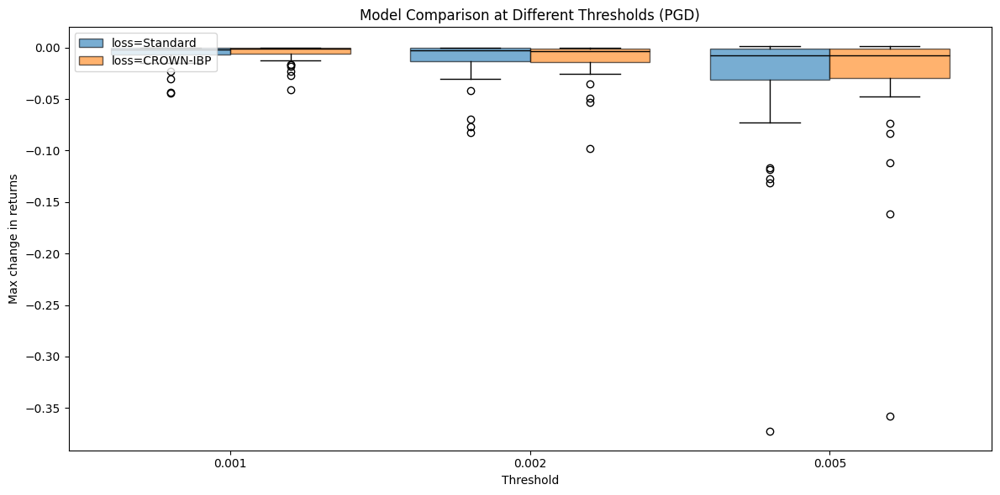

In [596]:
for method in ["PGD"]:
    first = experiments[model_names[0]]["results"]["test"]["deltas"][method]
    thresholds = sorted(first.keys())
    n_thresh = len(thresholds)
    model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

    # prepare figure
    fig, ax = plt.subplots(figsize=(12,6))
    
    # width of each box, total span = width * n_models
    n_models = len(model_names)
    width = 0.8 / n_models
    ind = np.arange(n_thresh)
    
    # define a color cycle or list here if you like
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    
    # plot each model
    box_handles = []
    for i, model_name in enumerate(model_names):
        data = experiments[model_name]["results"]["test"]["deltas"][method]

        vals = [data[t] for t in thresholds]
        print(data)
        
        pos = ind - 0.4 + width*(i + 0.5)
        b = ax.boxplot(
            vals,
            positions=pos,
            widths=width,
            patch_artist=True,
            boxprops=dict(facecolor=colors[i % len(colors)], alpha=0.6),
            medianprops=dict(color='black'),
            manage_ticks=False
        )
        # grab one of the boxes for the legend
        box_handles.append(b["boxes"][0])
    
    # labels & legend
    ax.set_xticks(ind)
    ax.set_xticklabels([str(t) for t in thresholds])
    ax.set_xlabel('Threshold')
    ax.set_ylabel('Max change in returns')
    ax.set_title(f'Model Comparison at Different Thresholds ({method})')
    ax.legend(box_handles, model_labels, loc='upper left')
    
    plt.tight_layout()
    plt.show()    

In [ ]:
# torch.min(experiments["seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]["results"]["test"]["deltas"]["PGD"][eps])

KeyError: 'seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth'

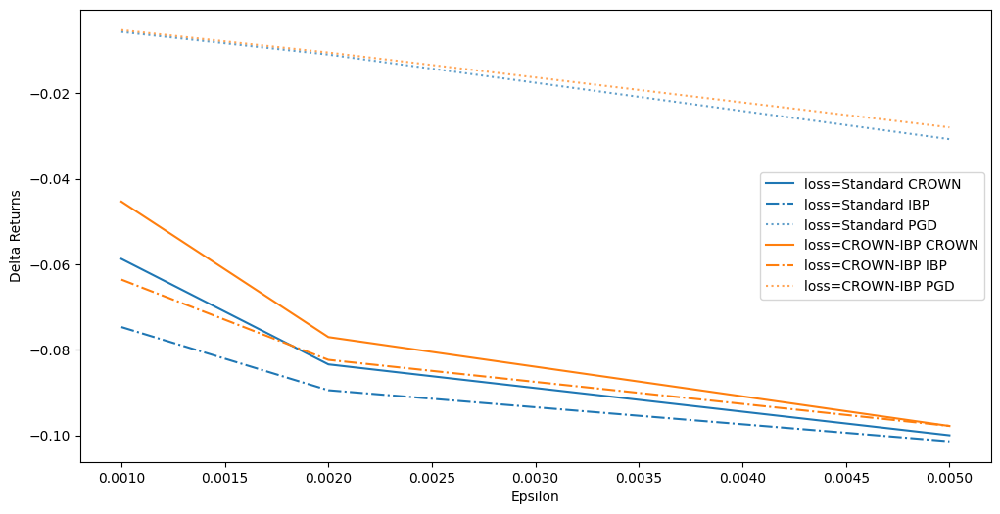

In [598]:
fig, ax = plt.subplots(figsize=(12, 6))
first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
thresholds = sorted(first.keys())

for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
    crown_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps]) for eps in thresholds]
    IBP_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["IBP"][eps]) for eps in thresholds]
    CROWN_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["IBP"][eps]) for eps in thresholds]
    PGD_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]) for eps in thresholds]
    plt.plot(thresholds, crown_bounds, color = colors[i], linestyle='-', label=f"{model_label} CROWN")
    plt.plot(thresholds, IBP_bounds, color = colors[i],  linestyle='dashdot', label=f"{model_label} IBP")
    plt.plot(thresholds, PGD_bounds, color = colors[i],  linestyle='dotted', alpha=0.7, label=f"{model_label} PGD")
plt.xlabel('Epsilon')
plt.legend()
plt.ylabel('Delta Returns')
plt.show()

In [599]:
model_labels = ["Robust Model", "Standard Model"]

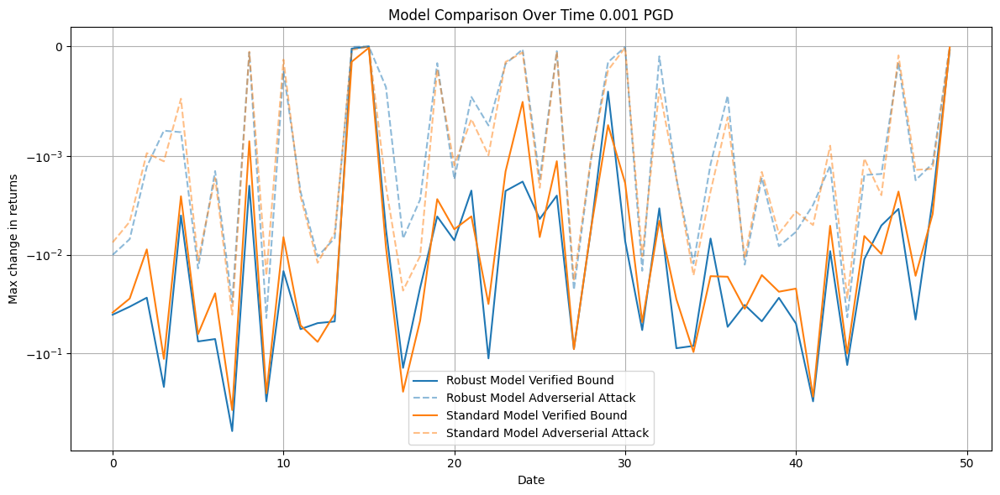

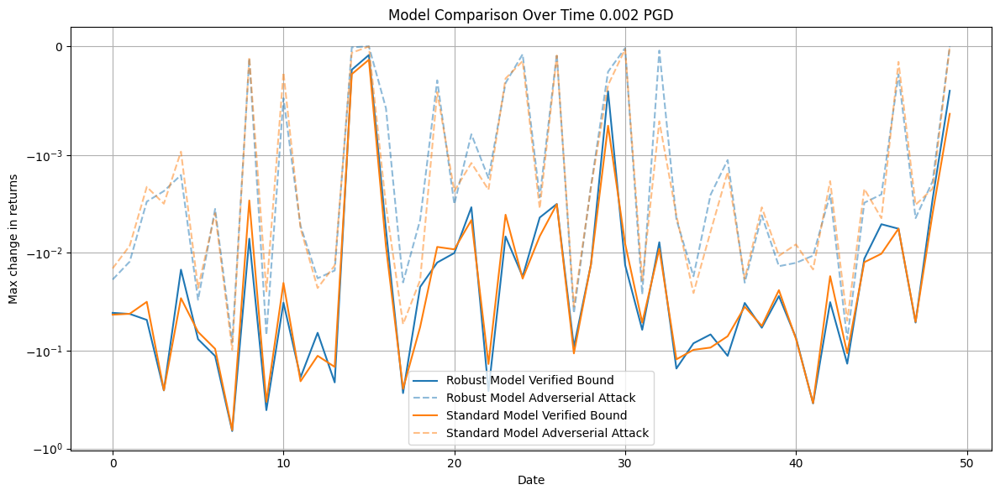

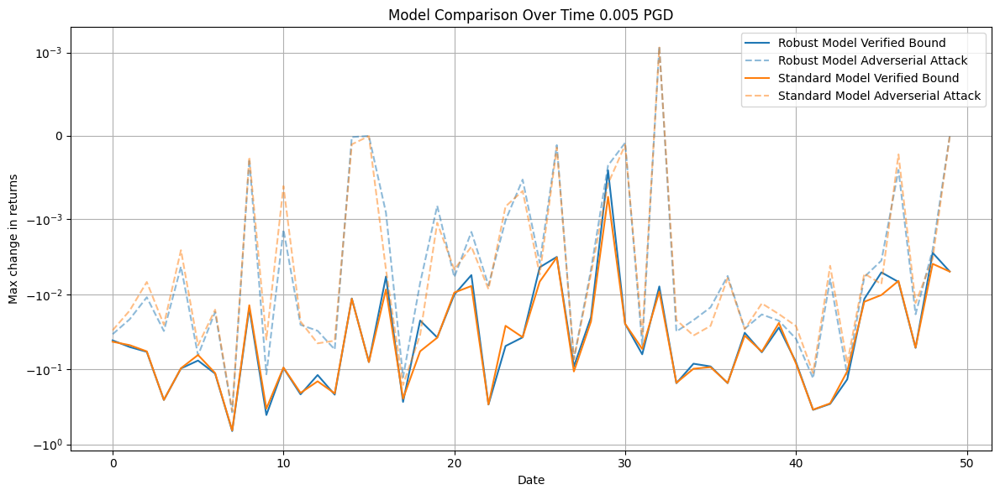

In [600]:

first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
thresholds = sorted(first.keys())

for eps in thresholds:
    fig, ax = plt.subplots(figsize=(12, 6))
    #   model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

    for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
        #     print(model_label)
            data = experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps]
            ax.plot(data, '-', label=f'{model_label} Verified Bound', color = colors[i])

            data = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]
            ax.plot(data, '--', label=f'{model_label} Adverserial Attack', alpha=0.5, color = colors[i])

    ax.set_xlabel('Date')
    ax.set_ylabel('Max change in returns')
    ax.set_title(f'Model Comparison Over Time {eps} {method}')
    ax.legend(loc='best')
    ax.grid(True)
    ax.set_yscale('symlog', linthresh=0.001, base=10)


    plt.tight_layout()
    plt.show()

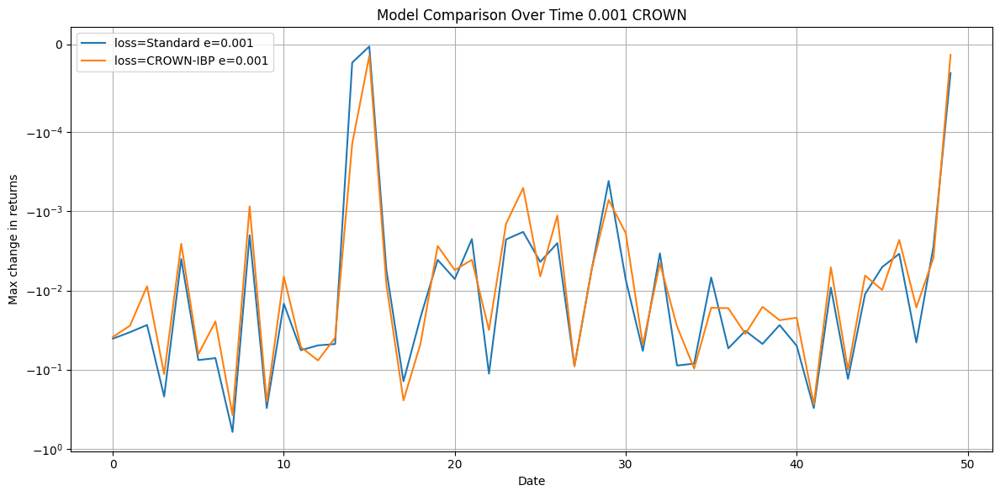

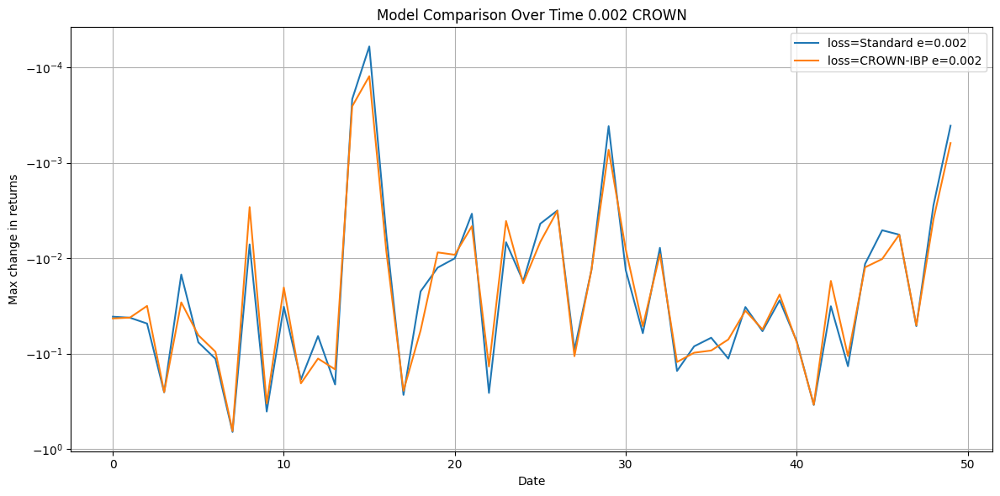

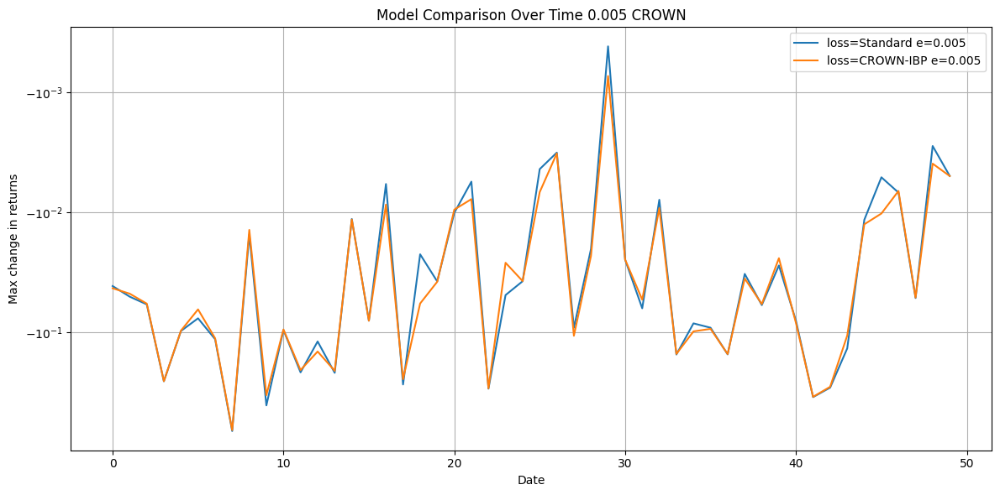

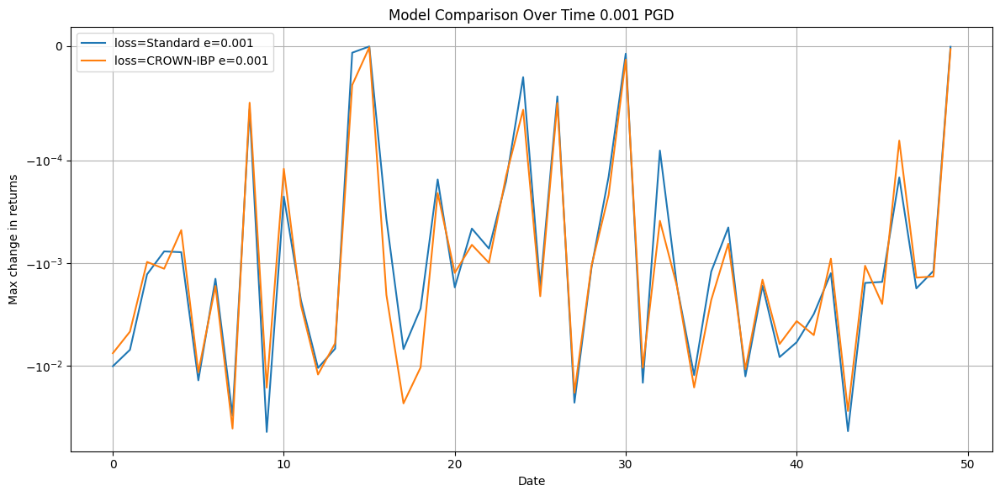

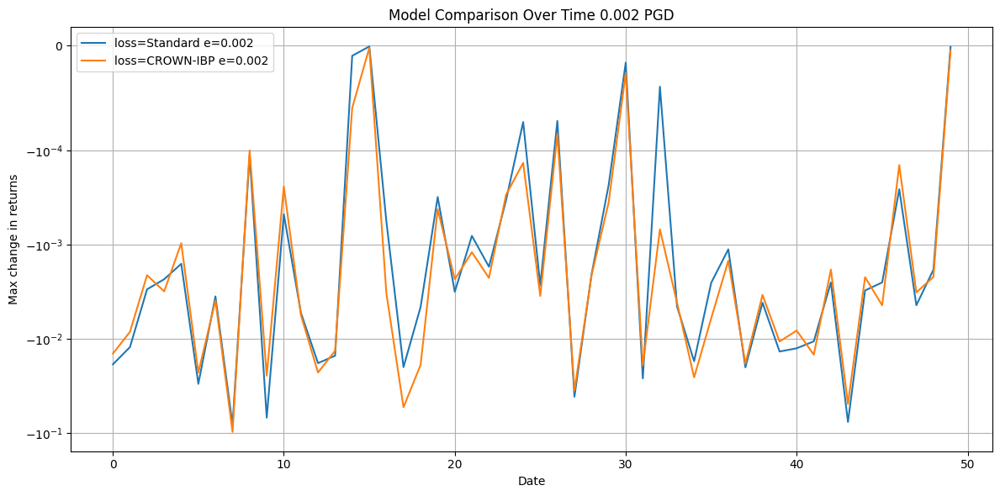

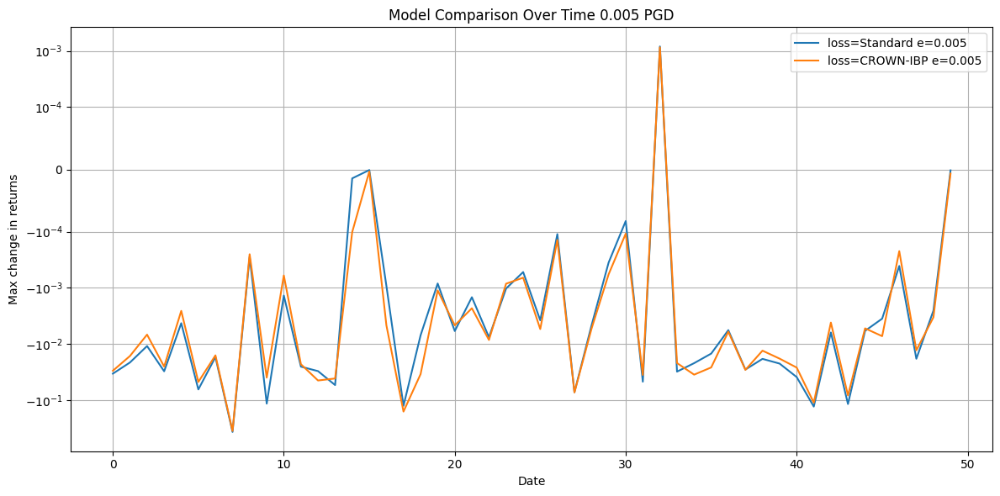

In [601]:
for method in ["CROWN", "PGD"]:
    first = experiments[model_names[0]]["results"]["test"]["deltas"][method]
    thresholds = sorted(first.keys())

    for eps in thresholds:
        fig, ax = plt.subplots(figsize=(12, 6))
        #   model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

        for i, model_name in enumerate(model_names):
                data = experiments[model_name]["results"]["test"]["deltas"][method][eps]
                ax.plot(data,   '-', label=f'{label_from_params(experiments[model_name]["params"], experiments) } e={eps}')

        ax.set_xlabel('Date')
        ax.set_ylabel('Max change in returns')
        ax.set_title(f'Model Comparison Over Time {eps} {method}')
        ax.legend(loc='best')
        ax.grid(True)
        ax.set_yscale('symlog', linthresh=1e-4, base=10)

        plt.tight_layout()
        plt.show()

tensor([0.2500, 0.2500, 0.2500, 0.2500]) tensor([0.1142, 0.1205, 0.1462, 0.6191]) tensor(-0.0032)


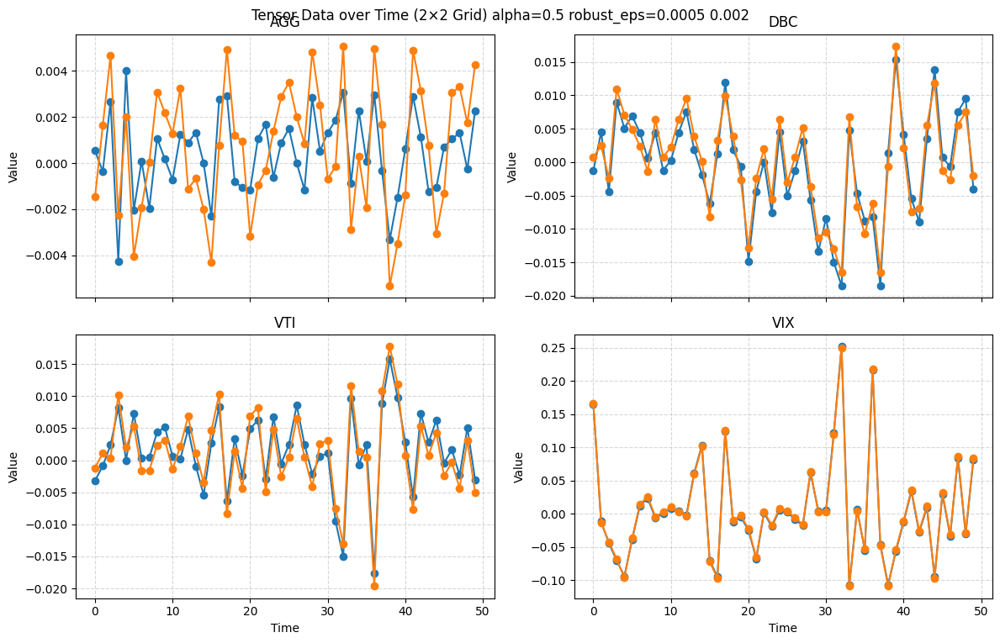

tensor([0.1128, 0.1192, 0.1450, 0.6230]) tensor([0.0525, 0.0458, 0.0421, 0.8597]) tensor(-0.0634)


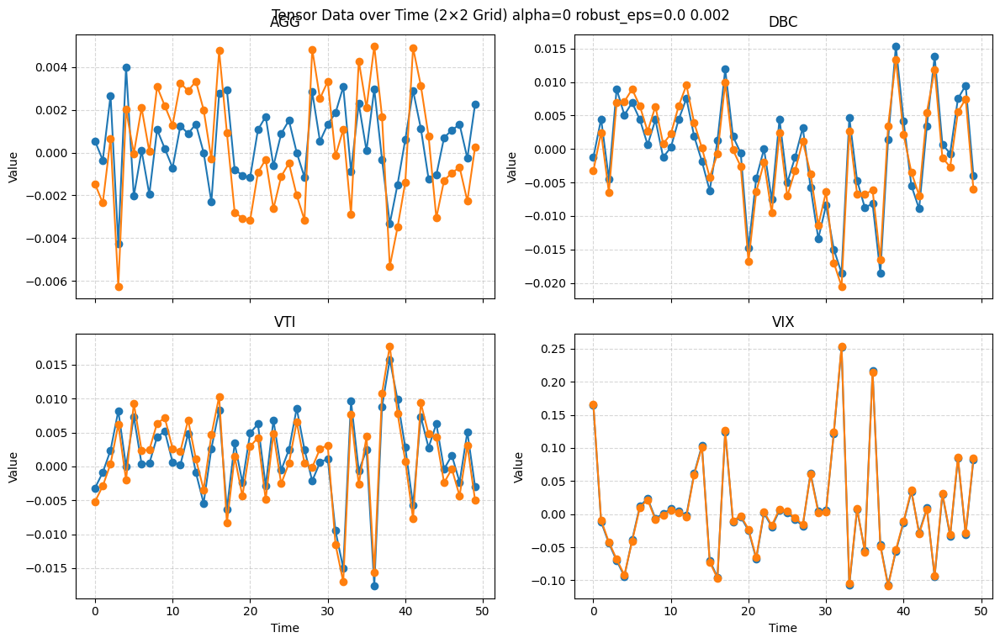

In [ ]:
for model_name in model_names:
    first = experiments[model_names[0]]["results"]["test"]["deltas"]["PGD"]
    thresholds = sorted(first.keys())
    for eps in [0.002]:
        deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

        min_idx = torch.argmin(deltas)


        adv_X = experiments[model_name]["results"]["test"]["PGD_AdvX"][eps]
        adv_Y = experiments[model_name]["results"]["test"]["PGD_AdvY"][eps]
        deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

        print(model_weights[min_idx], adv_Y[min_idx], deltas[min_idx])

        model_weights = experiments[model_name]["results"]["test"]["bounds"]["None"]

        data_np = X_test_tensor[::5][min_idx].numpy()
        data_np2 = adv_X[min_idx].numpy()

        time = range(data_np.shape[0])  # 0,1,…,49

        # Create a 2×2 grid of subplots
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), sharex=True)

        # Flatten the axes array for easy iteration
        axes = axes.flatten()

        for i, ax in enumerate(axes):
            ax.plot(time, data_np[:, i], marker='o', linestyle='-')
            ax.plot(time, data_np2[:, i], marker='o', linestyle='-')
            ax.set_title(f'{asset_names[i]}')
            ax.set_ylabel('Value')
            ax.grid(True, linestyle='--', alpha=0.5)

        # Label the shared x-axis on the bottom row
        for ax in axes[2:]:
            ax.set_xlabel('Time')

        fig.suptitle(f'Tensor Data over Time (2×2 Grid) {label_from_params(experiments[model_name]["params"], experiments)} {eps}', y=0.95)
        plt.tight_layout()
        plt.show()
        

       

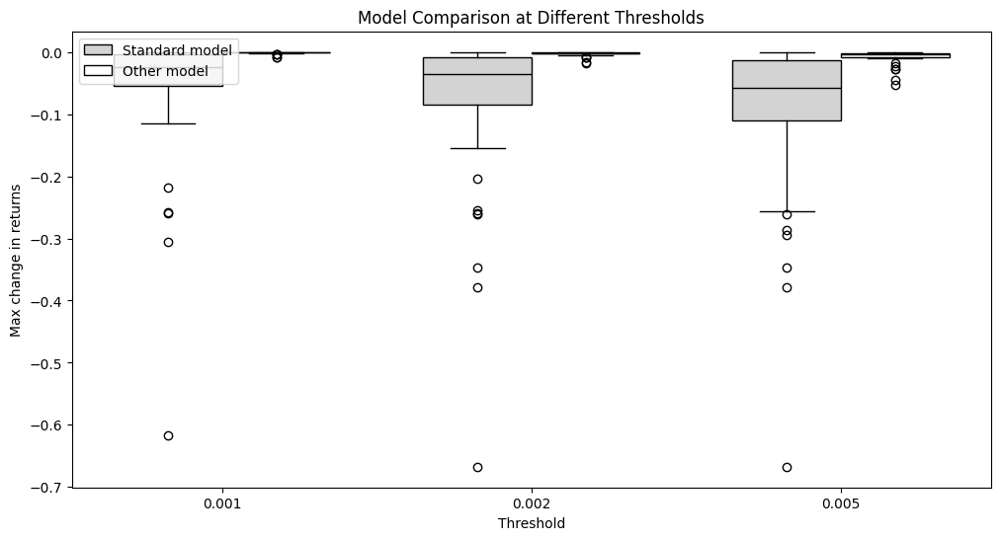

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


thresholds = sorted(data_standard.keys())
n_thresh = len(thresholds)

# collect lists
vals_std   = [data_standard[t]   for t in thresholds]
vals_other = [data_roboust[t] for t in thresholds]

# box positions
ind = np.arange(n_thresh)               # [0,1,2]
width = 0.35                            # width of each box
# plt.figure(10,10)
fig, ax = plt.subplots(figsize=(12, 6))
b1 = ax.boxplot(vals_std,
                positions=ind - width/2,
                widths=width,
                patch_artist=True,
                boxprops=dict(facecolor='lightgray'),
                medianprops=dict(color='black'),
                manage_ticks=False)

b2 = ax.boxplot(vals_other,
                positions=ind + width/2,
                widths=width,
                patch_artist=True,
                boxprops=dict(facecolor='white'),
                medianprops=dict(color='black'),
                manage_ticks=False)

ax.set_xticks(ind)
ax.set_xticklabels([str(t) for t in thresholds])
ax.set_xlabel('Threshold')
ax.set_ylabel('Max change in returns')
ax.legend([b1["boxes"][0], b2["boxes"][0]],
          ['Standard model', 'Other model'],
          loc='upper left')
ax.set_title('Model Comparison at Different Thresholds')
plt.show()

## Rebustifcation strategies

In [ ]:
import time as time

In [ ]:
model = experiments["seed=44,epochs=6,model=CNN,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.025,loss=Standard.pth"]["model"]

x = X_test_tensor[:4]
eps_vector = torch.tensor(e*0.001, dtype=torch.float32, device=x.device)
eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
x_perturbed = BoundedTensor(x, perturbation)
model.compute_bounds(x=(x_perturbed,), method="IBP")

asset_returns = ((1 + y).prod(1)-1)

(asset_returns*weights).sum(1)

torch.mean((torch.min(asset_returns*lb, asset_returns*ub)).sum(1)), torch.mean((asset_returns*weights).sum(1))




(tensor(0.0095), tensor(0.0352))

In [ ]:
def robust_loss_fn_fn(params):
    if params["loss"] == "Standard":
        lambda_entropy = params["lambda_entropy"]
    
        # def loss_fn(x, y, model):
        #     weights_ = model(x)
            
        #     weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

        #     portfolio_returns = (weights * y).sum(1).sum(1)

        #     natural_loss = -portfolio_returns.mean() 

        #     clamped_weights = weights.clamp(min=1e-8)
        #     entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

        #     return natural_loss -  entropy_loss
        # return loss_fn 
        def loss_fn(x, y, model):
            weights = model(x)


            asset_returns = ((1 + y).prod(1)-1)

            portfolio_returns = (asset_returns*weights).sum(1)

            natural_loss = -portfolio_returns.mean() 

            clamped_weights = weights.clamp(min=1e-8)
            entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

            return natural_loss -  entropy_loss
        return loss_fn 
    elif params["loss"] == "CROWN-IBP" or params["loss"] == "IBP":
        lambda_entropy = params["lambda_entropy"]
        alpha = params["alpha"]
        robust_eps = params["robust_eps"]
        eps_vector = torch.tensor(e*robust_eps, dtype=torch.float32, device=x.device)
        

        def loss_fn(x, y, model):
            weights = model(x)

            eps_tensor =eps_vector.repeat(x.shape[0], 50, 1)
            perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
            x_perturbed = BoundedTensor(x, perturbation)
            ub, lb = model.compute_bounds(x=(x_perturbed,), method=params["loss"])

            asset_returns = ((1 + y).prod(1)-1)

            portfolio_returns = (asset_returns*weights).sum(1)
            worst_returns = torch.min(asset_returns * ub, asset_returns * lb).sum(1)

            natural_loss = -portfolio_returns.mean() 
            robust_loss = -worst_returns.mean() 

            clamped_weights = weights.clamp(min=1e-8)
            entropy_loss = -lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

            return natural_loss * (1-alpha) + robust_loss * alpha + entropy_loss
        return loss_fn
    
    #     output_lb_cert = lower_bound_verified(model, x, robust_eps, method="IBP")
            #     output_adv = model(pgd_attack(model, x, y, robust_eps, loss_fn))

            #     if method == "CC-IBP":
            #         loss = loss_fn((1 - alpha) * output_adv +  alpha * output_lb_cert, y)

            #     elif method == "MTL-IBP":
            #         robust_loss = loss_fn(output_lb_cert, y)
            #         adv_loss = loss_fn(output_adv, y)

            #         loss = (1 - alpha) * adv_loss +  alpha * robust_loss

            #     elif method == "Exp-IBP":
            #         robust_loss = loss_fn(output_lb_cert, y)
            #         adv_loss = loss_fn(output_adv, y)

            #         loss = (adv_loss **(1 - alpha)) * (robust_loss ** alpha)
    
    elif params["loss"] in ["MTL-IBP", "Exp-IBP" "CC-IBP"]:
        lambda_entropy = params["lambda_entropy"]
        alpha = params["alpha"]
        robust_eps = params["robust_eps"]
        eps = e*robust_eps
        eps_vector = torch.tensor(eps, dtype=torch.float32, device=x.device)
        def pgd_attack_loss(x, y):
            loss = ((1 + y).prod(1) * x).sum(1)
            return loss
        def loss_fn(x, y, model):
            model.eval()
            output_adv = model(pgd_attack(model, x, y, eps_vector, pgd_attack_loss, n_steps=40))
            model.train()
            
            eps_tensor =eps_vector.repeat(x.shape[0], 50, 1)
            perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
            x_perturbed = BoundedTensor(x, perturbation)
            ub, lb = model.compute_bounds(x=(x_perturbed,), method="IBP")
            asset_returns = ((1 + y).prod(1)-1)

            weights = model(x)
            clamped_weights = weights.clamp(min=1e-8)
            entropy_loss = -lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

            if params["loss"] == "CC-IBP":
                returns = torch.min(asset_returns * (output_adv * alpha + ub * (1-alpha)), asset_returns * (output_adv * alpha + lb * (1-alpha))).sum(1)
                loss = returns.mean()

                return loss + entropy_loss

            else:
                worst_returns = torch.min(asset_returns * ub, asset_returns * lb).sum(1)
                robust_loss = -worst_returns.mean() 
                output_adv
                adv_returns = (output_adv * asset_returns).sum(1)
                adv_loss = -adv_returns.mean() 

               

                if params["loss"] == "MTL-IBP":
                    loss = (adv_loss *(1 - alpha)) + (robust_loss * alpha) + entropy_loss
                elif params["loss"] == "Exp-IBP":
                    loss = (adv_loss **(1 - alpha)) + (robust_loss ** alpha) + entropy_loss

                return loss
        return loss_fn
      


    raise NotImplementedError(f"Not implemented loss {params['loss']}")

params_grids = [
    {
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.1, 0.5, 0.9],
    "robust_eps": [0.00001],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["MTL-IBP", "Exp-IBP"],
}
]

experiment_path = "../experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

IndentationError: expected an indented block after 'elif' statement on line 113 (376413407.py, line 116)

In [681]:
def linestyle_map(params):
    if "robust_eps" in params:
        return "-"
    else:
        return "--"

Loading 
Loading 
Loading seed=2
Loading seed=3
Loading seed=3 loss=IBP
Loading seed=3 robust_eps=1e-05 loss=IBP


/tmp/ipykernel_4677/263050399.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


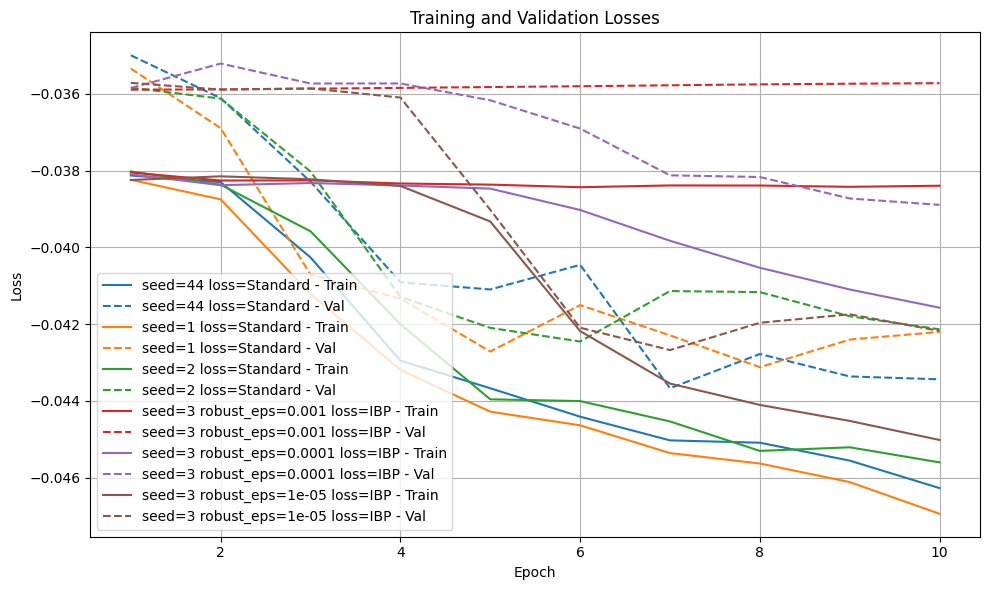

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_4677/263050399.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
seed=44 loss=Standard,8.61,0.102,0.238,1.19,0.00363,0.0356
seed=1 loss=Standard,6.56,0.0949,0.282,1.17,0.00327,0.0345
seed=2 loss=Standard,11,0.098,0.321,1.1,0.0042,0.0429
seed=3 robust_eps=0.001 loss=IBP,1.37,0.0586,0.236,1.38,0.00149,0.0255
seed=3 robust_eps=0.0001 loss=IBP,6.85,0.0861,0.293,1.21,0.00361,0.0419
seed=3 robust_eps=1e-05 loss=IBP,11.4,0.0999,0.311,1.14,0.00421,0.0422
Uniform Baseline,0.356,0.0289,0.452,1.39,0.000792,0.0274


(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)


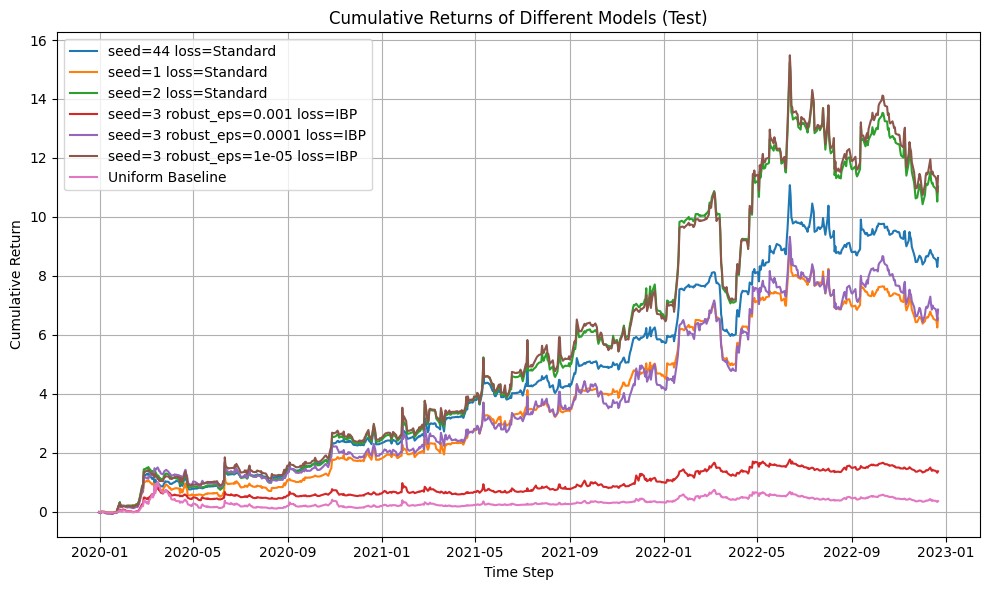

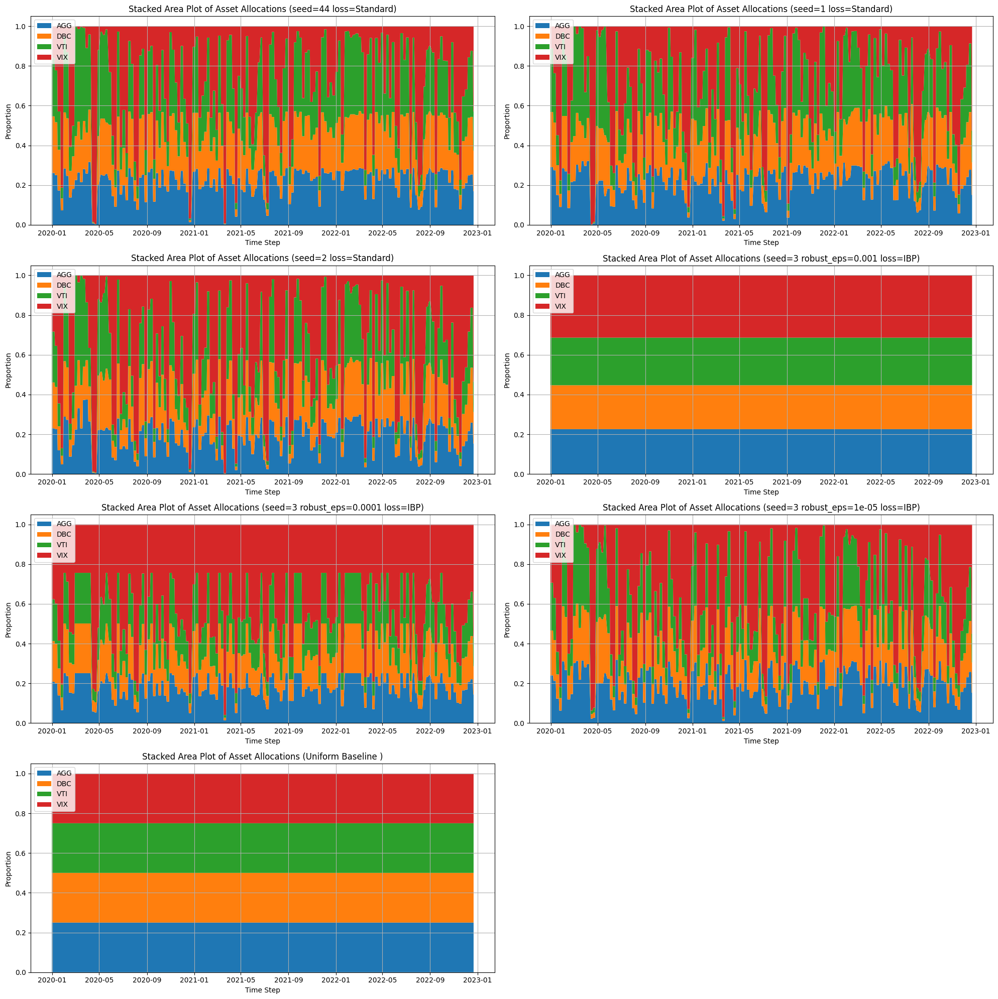

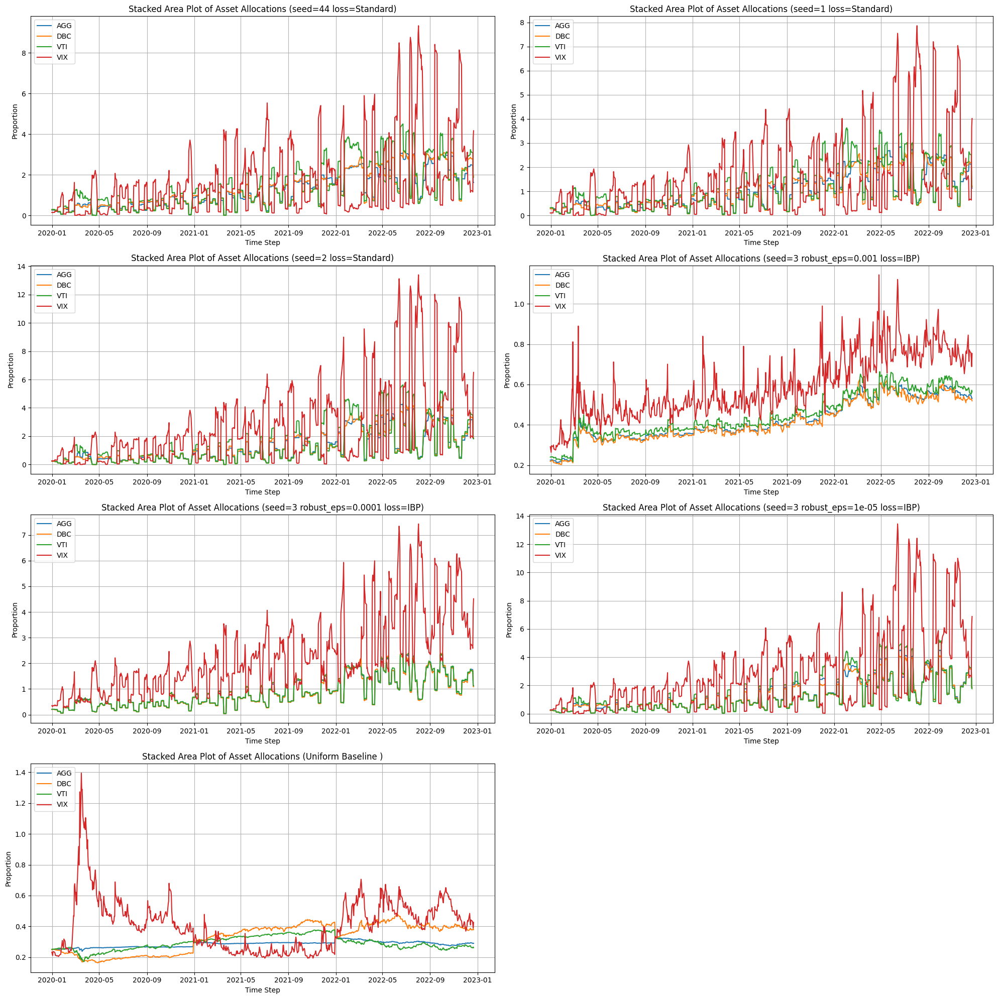

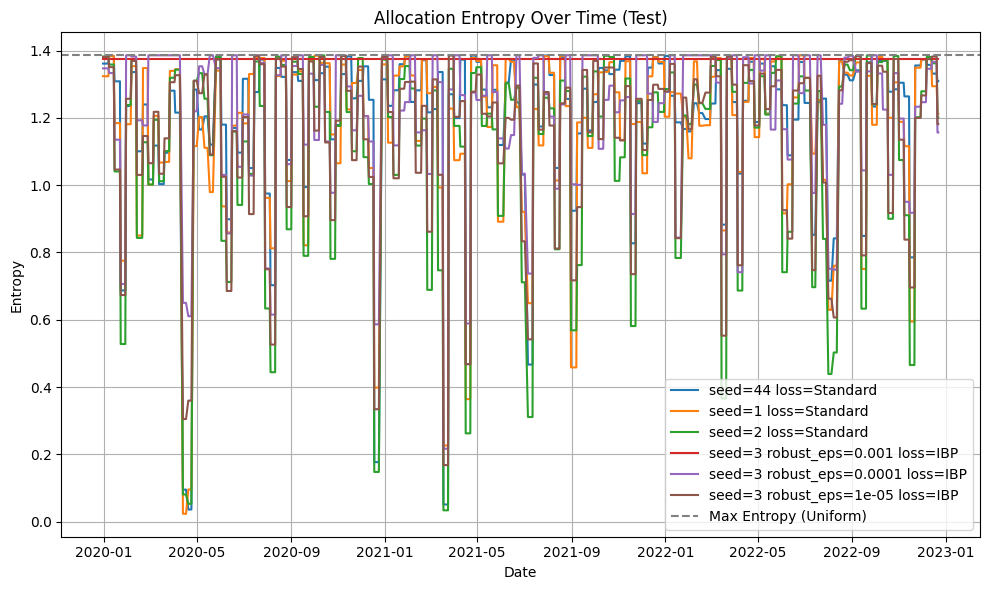

--------------------
Train RESULTS
--------------------


/tmp/ipykernel_4677/263050399.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
seed=44 loss=Standard,1.14e+04,0.112,0.261,1.21,0.00358,0.0321
seed=1 loss=Standard,4.2e+04,0.12,0.272,1.17,0.00407,0.0339
seed=2 loss=Standard,3.31e+04,0.106,0.356,1.1,0.00419,0.0397
seed=3 robust_eps=0.001 loss=IBP,5.45,0.039,0.264,1.38,0.000904,0.0232
seed=3 robust_eps=0.0001 loss=IBP,666,0.0762,0.358,1.21,0.00283,0.0371
seed=3 robust_eps=1e-05 loss=IBP,1.32e+04,0.1,0.355,1.14,0.00384,0.0382
Uniform Baseline,0.654,0.0191,0.406,1.39,0.000414,0.0217


(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)


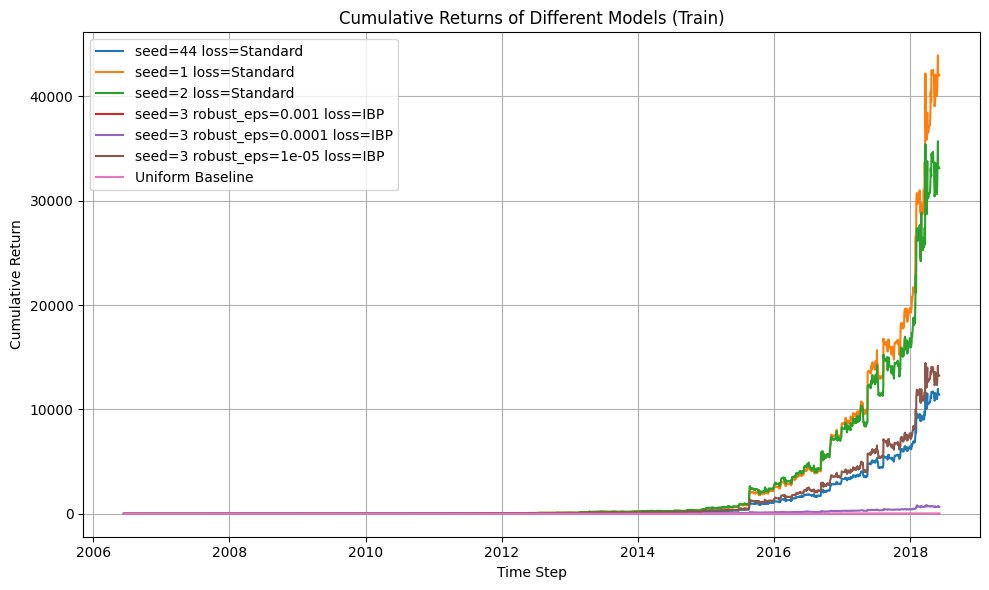

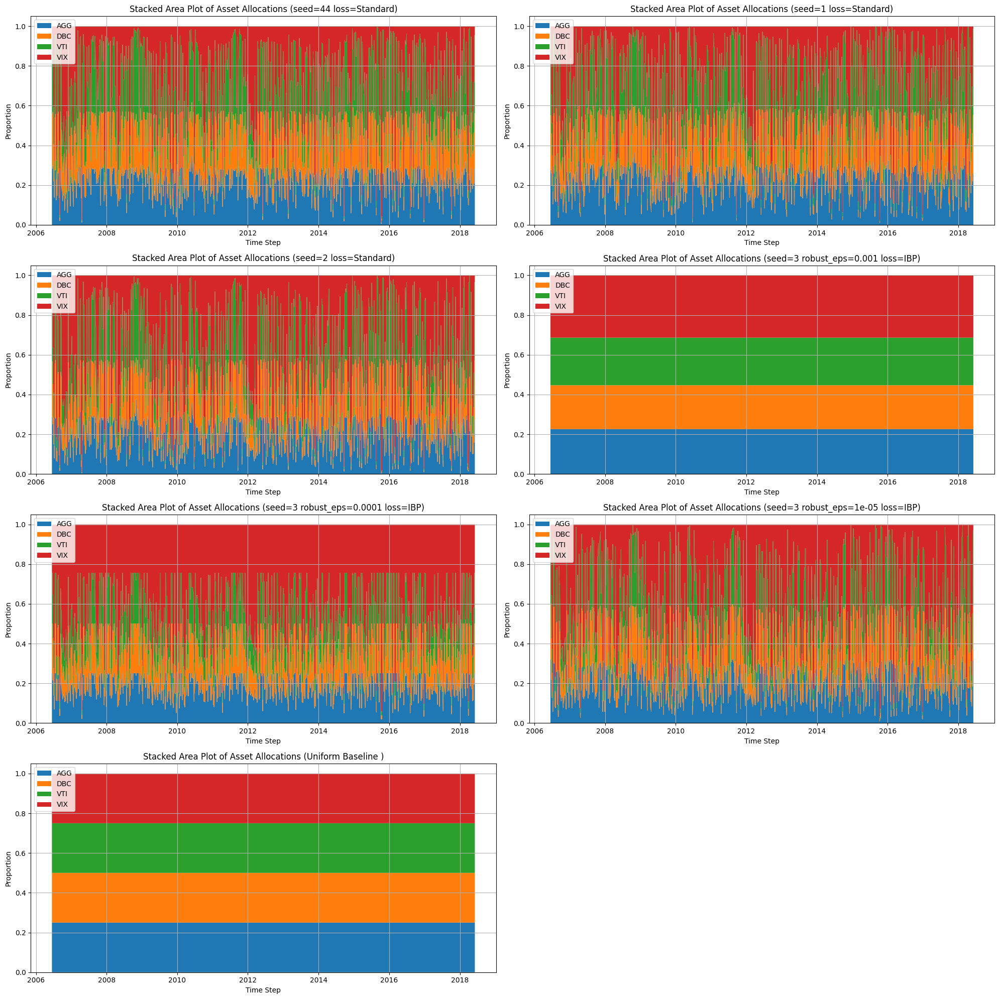

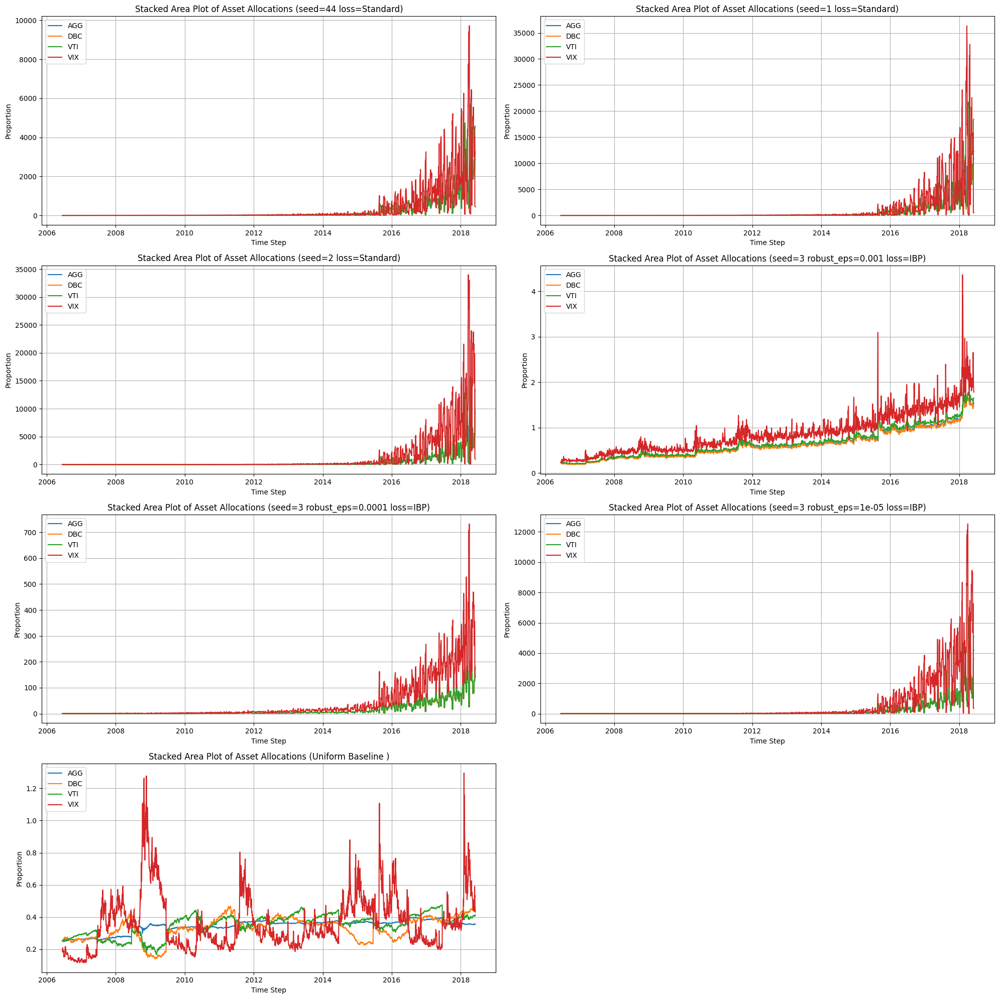

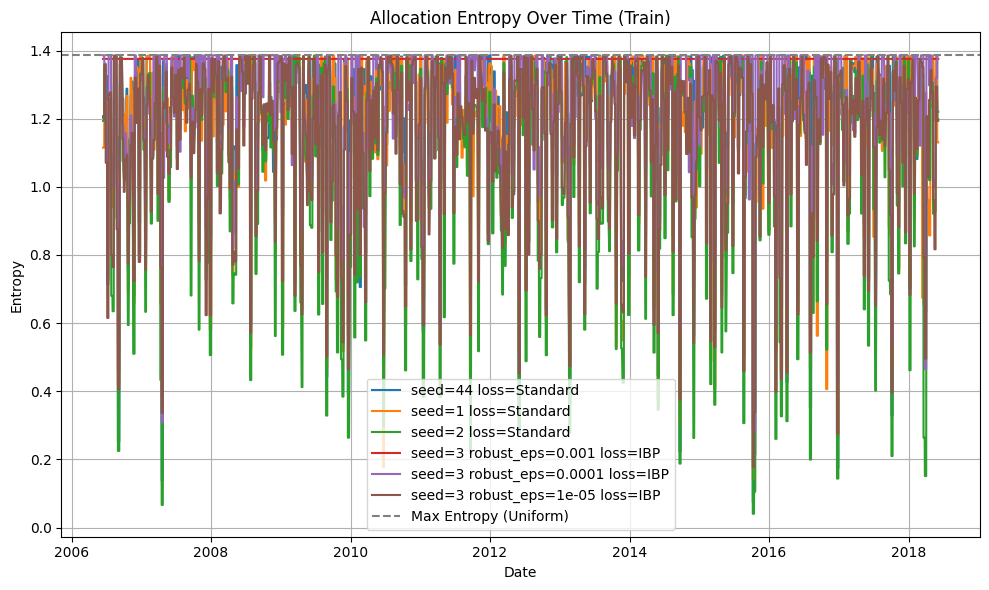

In [723]:
params_grids = [
    {
    "seed": [44, 1,2],
    "epochs": [10],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["Standard"]
},
{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": [0.001, 0.0001, 0.00001],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["IBP"],
},
]

experiment_path = "../experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

Loading 
Loading 
Loading seed=2
Loading seed=3
Training seed=3 loss=CROWN-IBP
Epoch  1, Train Loss: -0.038135: Val Loss: -0.035773
Epoch  2, Train Loss: -0.038395: Val Loss: -0.035112
Epoch  3, Train Loss: -0.038318: Val Loss: -0.035726
Epoch  4, Train Loss: -0.038372: Val Loss: -0.035696
Epoch  5, Train Loss: -0.038383: Val Loss: -0.035749
Epoch  6, Train Loss: -0.038487: Val Loss: -0.035723
Epoch  7, Train Loss: -0.038556: Val Loss: -0.036128
Epoch  8, Train Loss: -0.038581: Val Loss: -0.036402
Epoch  9, Train Loss: -0.038998: Val Loss: -0.036766
Epoch 10, Train Loss: -0.039335: Val Loss: -0.037045
Loading seed=3 robust_eps=0.0001 loss=CROWN-IBP
Loading seed=3 robust_eps=1e-05 loss=CROWN-IBP


/tmp/ipykernel_4677/263050399.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


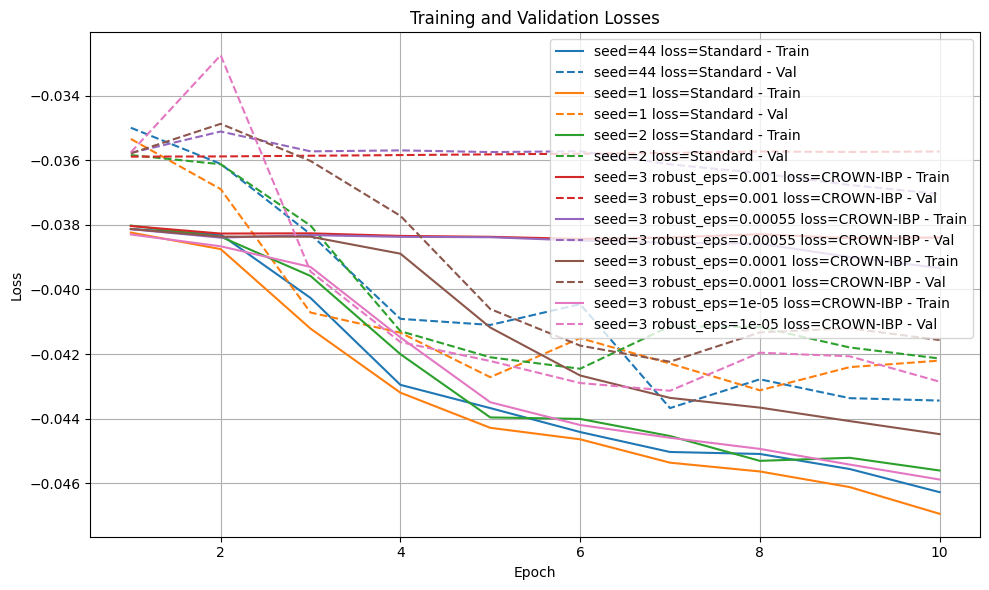

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_4677/263050399.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
seed=44 loss=Standard,8.61,0.102,0.238,1.19,0.00363,0.0356
seed=1 loss=Standard,6.56,0.0949,0.282,1.17,0.00327,0.0345
seed=2 loss=Standard,11,0.098,0.321,1.1,0.0042,0.0429
seed=3 robust_eps=0.001 loss=CROWN-IBP,1.36,0.0586,0.235,1.38,0.00149,0.0254
seed=3 robust_eps=0.00055 loss=CROWN-IBP,2.65,0.0701,0.277,1.33,0.00225,0.0321
seed=3 robust_eps=0.0001 loss=CROWN-IBP,12,0.101,0.301,1.14,0.00428,0.0423
seed=3 robust_eps=1e-05 loss=CROWN-IBP,9.85,0.0941,0.327,1.11,0.00409,0.0434
Uniform Baseline,0.356,0.0289,0.452,1.39,0.000792,0.0274


(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)


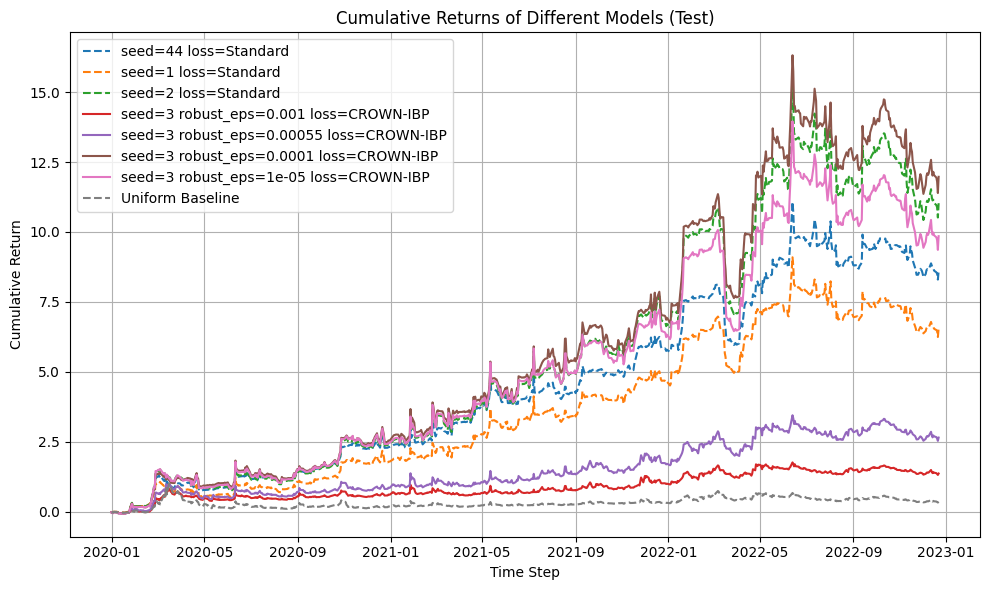

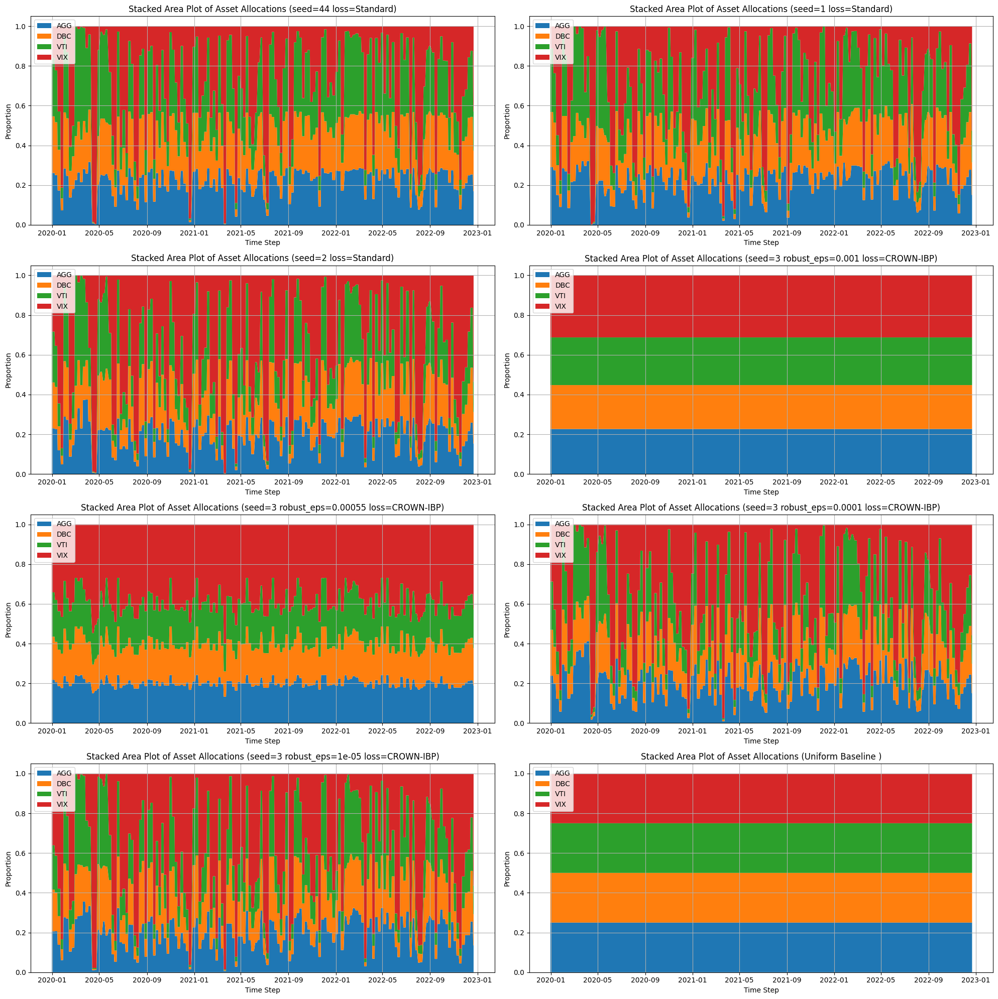

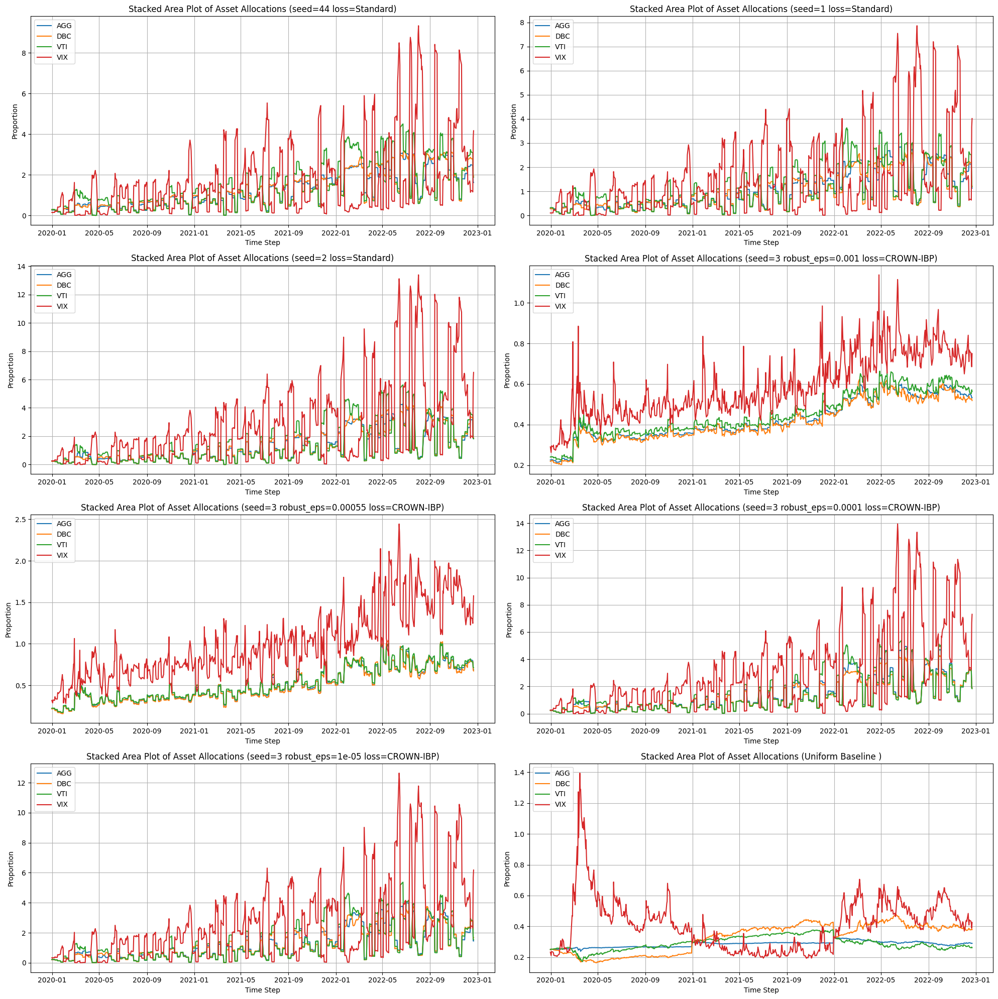

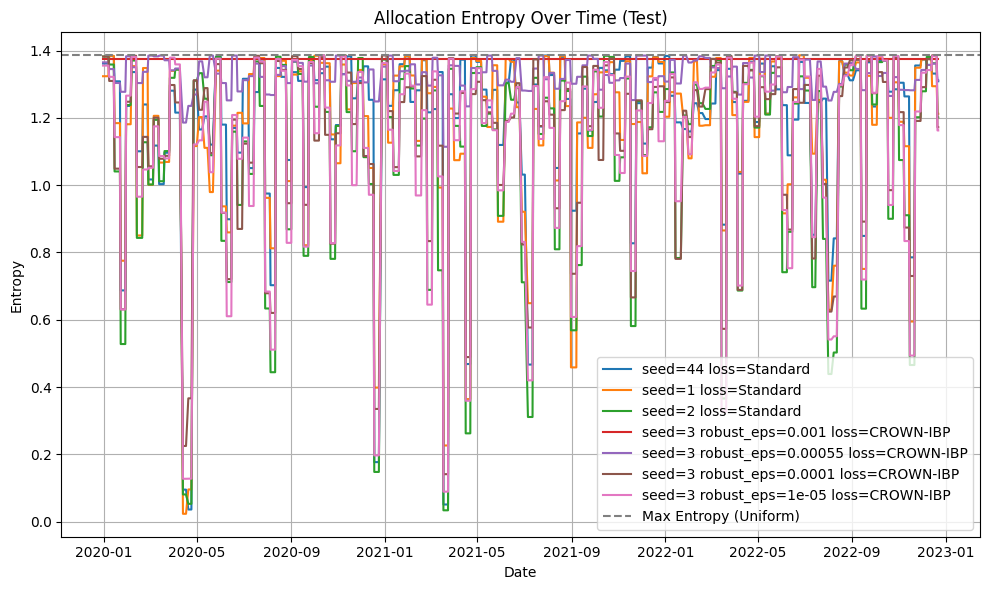

In [686]:
params_grids = [{
    "seed": [44, 1,2],
    "epochs": [10],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["Standard"]
},
{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": [1e-3, (1e-3+1e-4)/2, 1e-4, 1e-5],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["CROWN-IBP"],
},
]

experiment_path = "../experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    if dataset_key == "train":
        continue
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map)

Loading 
Training 
Epoch  1, Train Loss: -0.419254: Val Loss: -0.417060
Epoch  2, Train Loss: -0.419415: Val Loss: -0.417437
Epoch  3, Train Loss: -0.419625: Val Loss: -0.417644
Epoch  4, Train Loss: -0.419805: Val Loss: -0.417701
Epoch  5, Train Loss: -0.419917: Val Loss: -0.417593
Epoch  6, Train Loss: -0.419983: Val Loss: -0.417480
Epoch  7, Train Loss: -0.420067: Val Loss: -0.417623
Epoch  8, Train Loss: -0.420078: Val Loss: -0.417614
Epoch  9, Train Loss: -0.420099: Val Loss: -0.417565
Epoch 10, Train Loss: -0.420239: Val Loss: -0.417348
Loading lambda_entropy=0.025
Training seed=1 lambda_entropy=0.3
Epoch  1, Train Loss: -0.419217: Val Loss: -0.417048
Epoch  2, Train Loss: -0.419420: Val Loss: -0.417238
Epoch  3, Train Loss: -0.419698: Val Loss: -0.417688
Epoch  4, Train Loss: -0.419713: Val Loss: -0.417712
Epoch  5, Train Loss: -0.419971: Val Loss: -0.417689
Epoch  6, Train Loss: -0.419994: Val Loss: -0.417673
Epoch  7, Train Loss: -0.419817: Val Loss: -0.417542
Epoch  8, Train 

/tmp/ipykernel_4677/4055398947.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


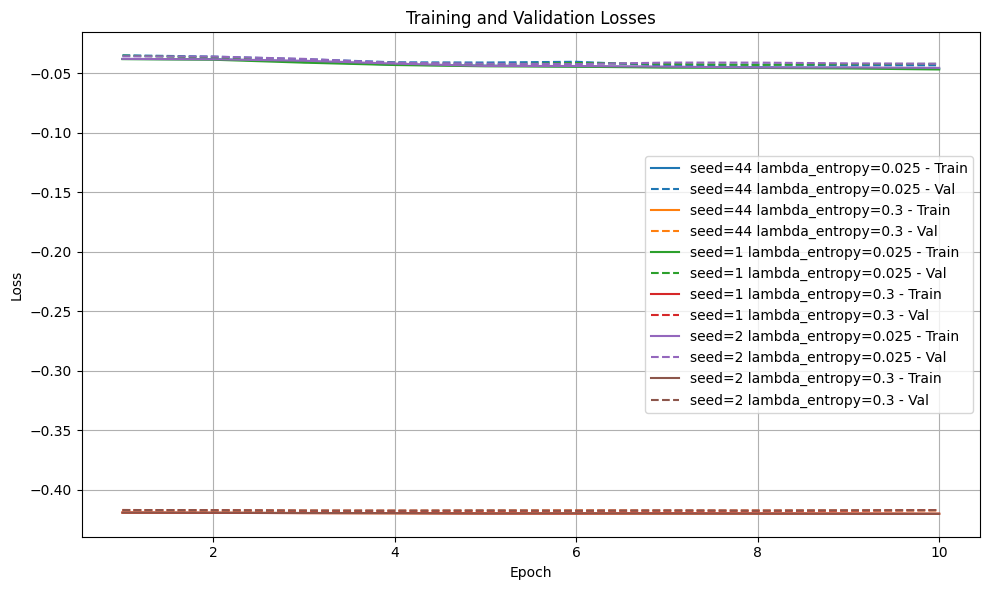

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_4677/4055398947.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
seed=44 lambda_entropy=0.025,8.61,0.102,0.238,1.19,0.00363,0.0356
seed=44 lambda_entropy=0.3,1.66,0.0753,0.17,1.38,0.00153,0.0203
seed=1 lambda_entropy=0.025,6.56,0.0949,0.282,1.17,0.00327,0.0345
seed=1 lambda_entropy=0.3,1.64,0.0776,0.163,1.38,0.0015,0.0193
seed=2 lambda_entropy=0.025,11,0.098,0.321,1.1,0.0042,0.0429
seed=2 lambda_entropy=0.3,1.8,0.075,0.176,1.38,0.00162,0.0217
Uniform Baseline,0.356,0.0289,0.452,1.39,0.000792,0.0274


(752,)
(752,)
(752,)
(752,)
(752,)
(752,)
(752,)


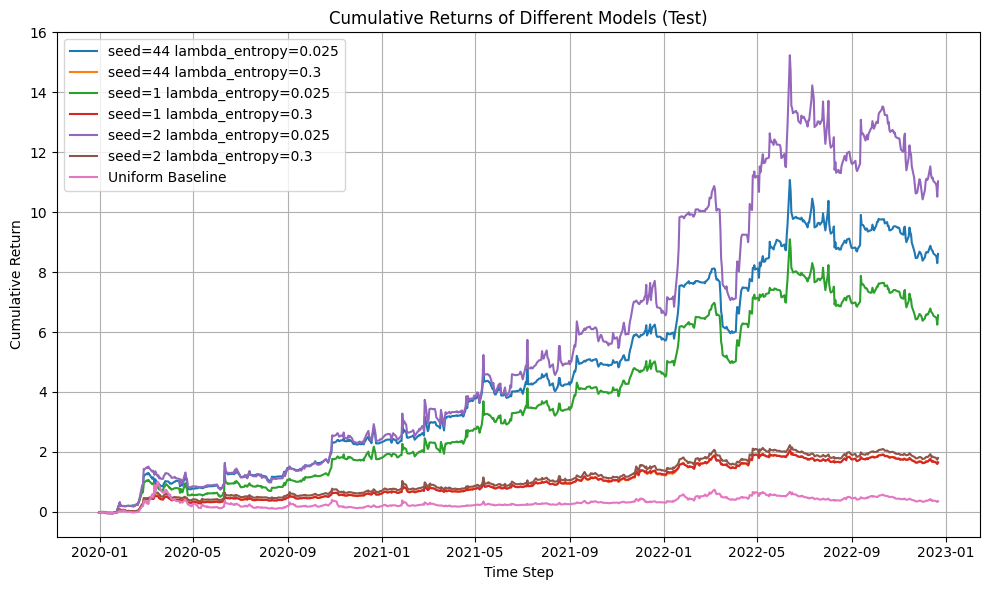

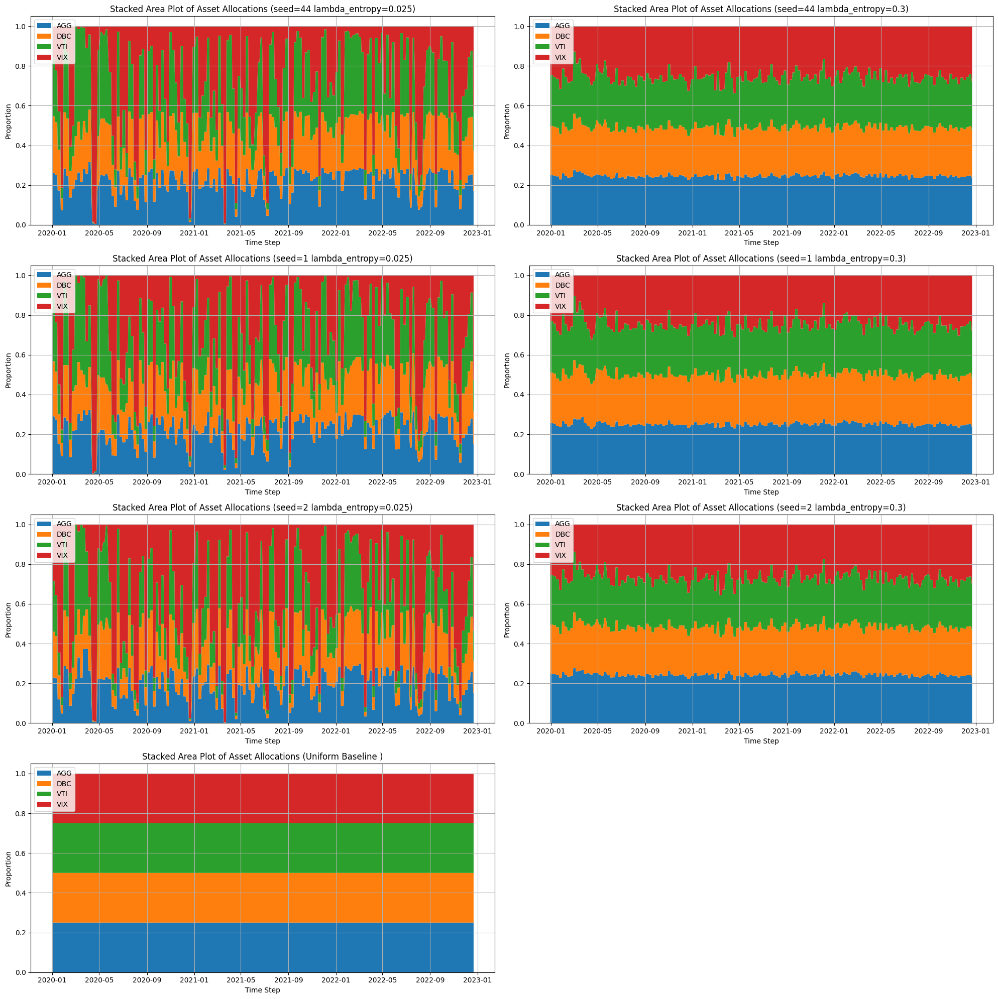

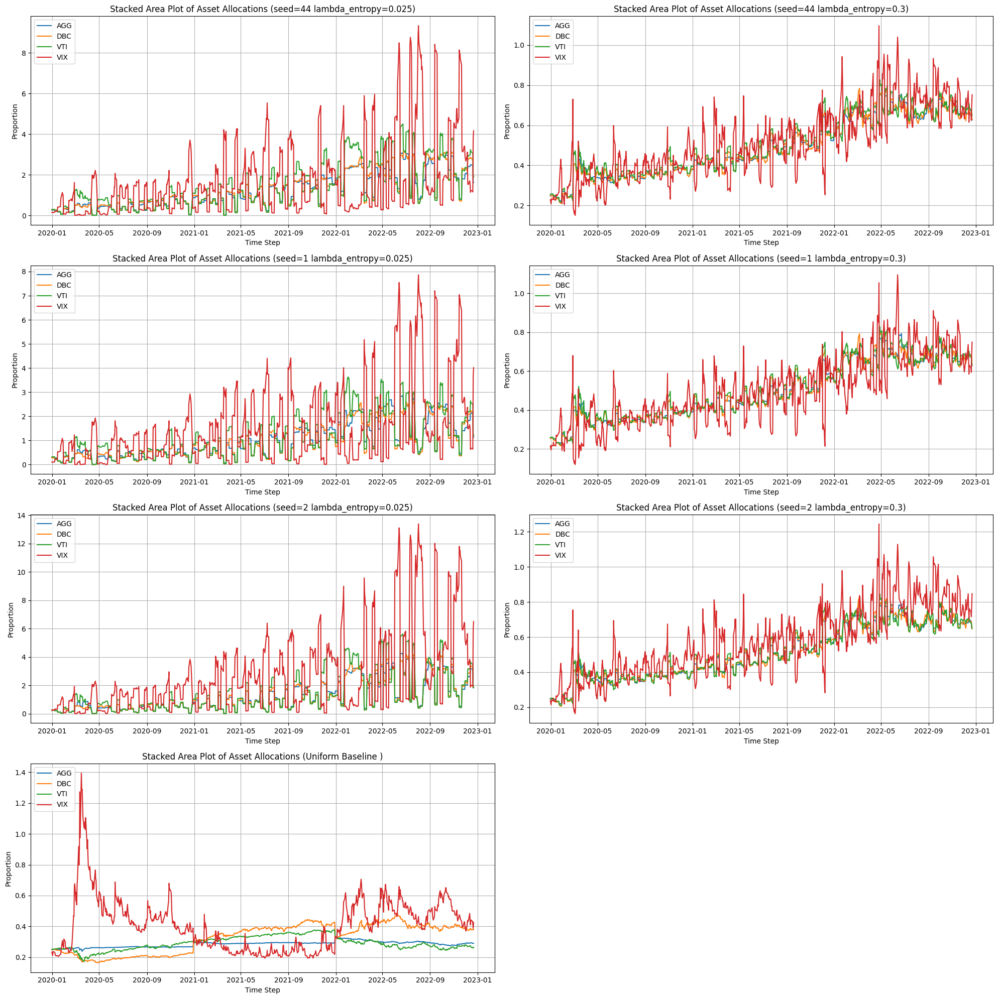

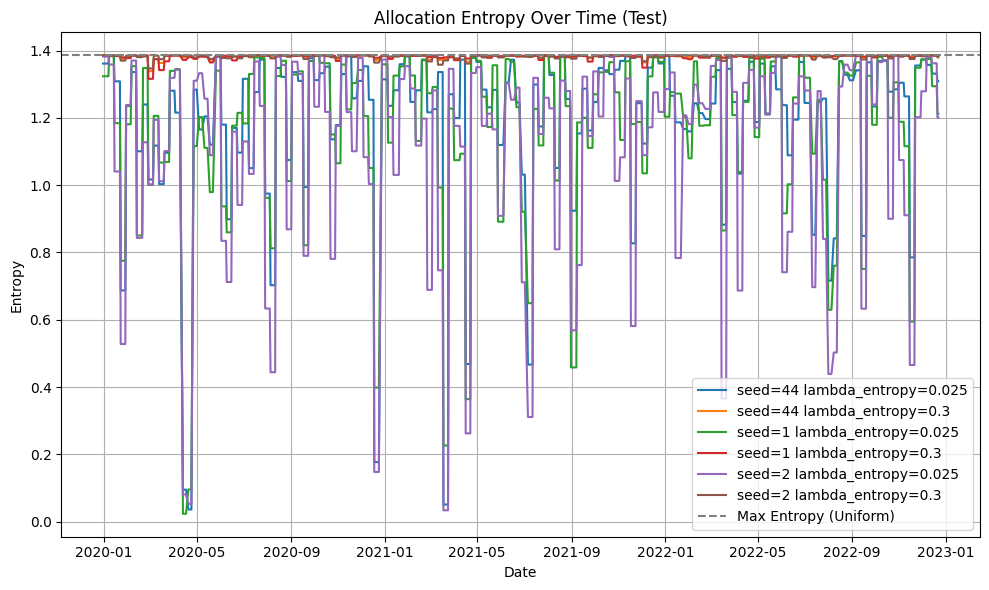

--------------------
Train RESULTS
--------------------


/tmp/ipykernel_4677/4055398947.py:27: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,shape,max_drawdown,mean_entropy,mean_return,std_return
seed=44 lambda_entropy=0.025,1.14e+04,0.112,0.261,1.21,0.00358,0.0321
seed=44 lambda_entropy=0.3,18.7,0.0615,0.186,1.38,0.00118,0.0192
seed=1 lambda_entropy=0.025,4.2e+04,0.12,0.272,1.17,0.00407,0.0339
seed=1 lambda_entropy=0.3,18.9,0.0639,0.178,1.38,0.00117,0.0183
seed=2 lambda_entropy=0.025,3.31e+04,0.106,0.356,1.1,0.00419,0.0397
seed=2 lambda_entropy=0.3,20.7,0.0609,0.202,1.38,0.00124,0.0203
Uniform Baseline,0.654,0.0191,0.406,1.39,0.000414,0.0217


(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)
(3014,)


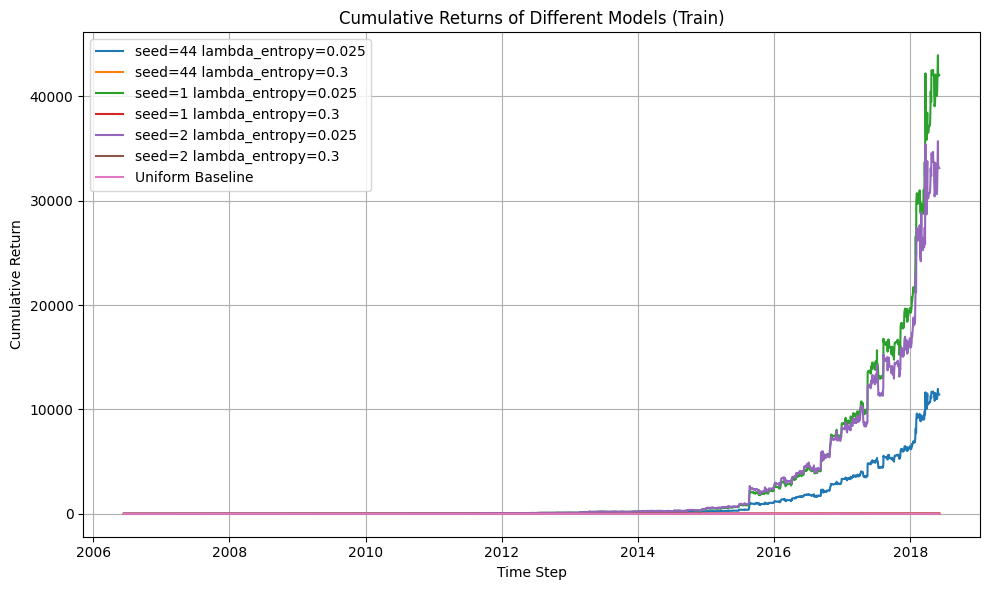

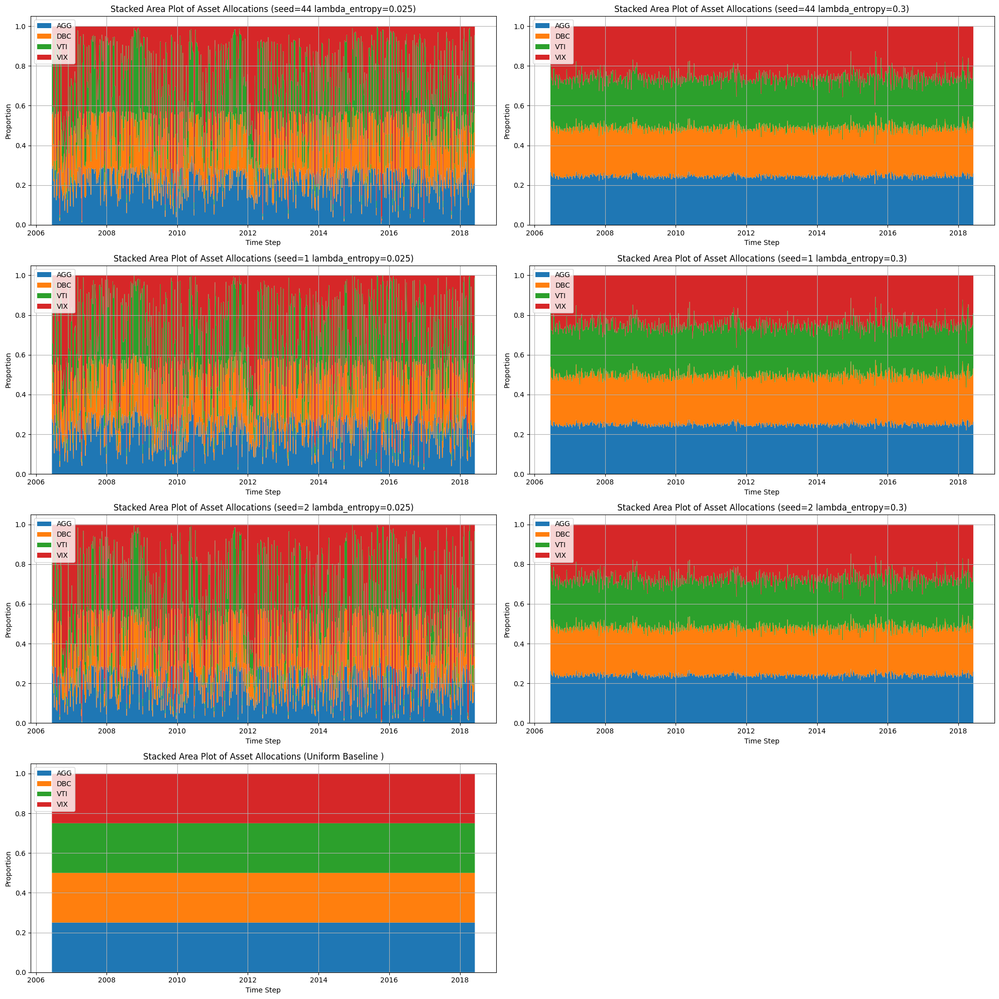

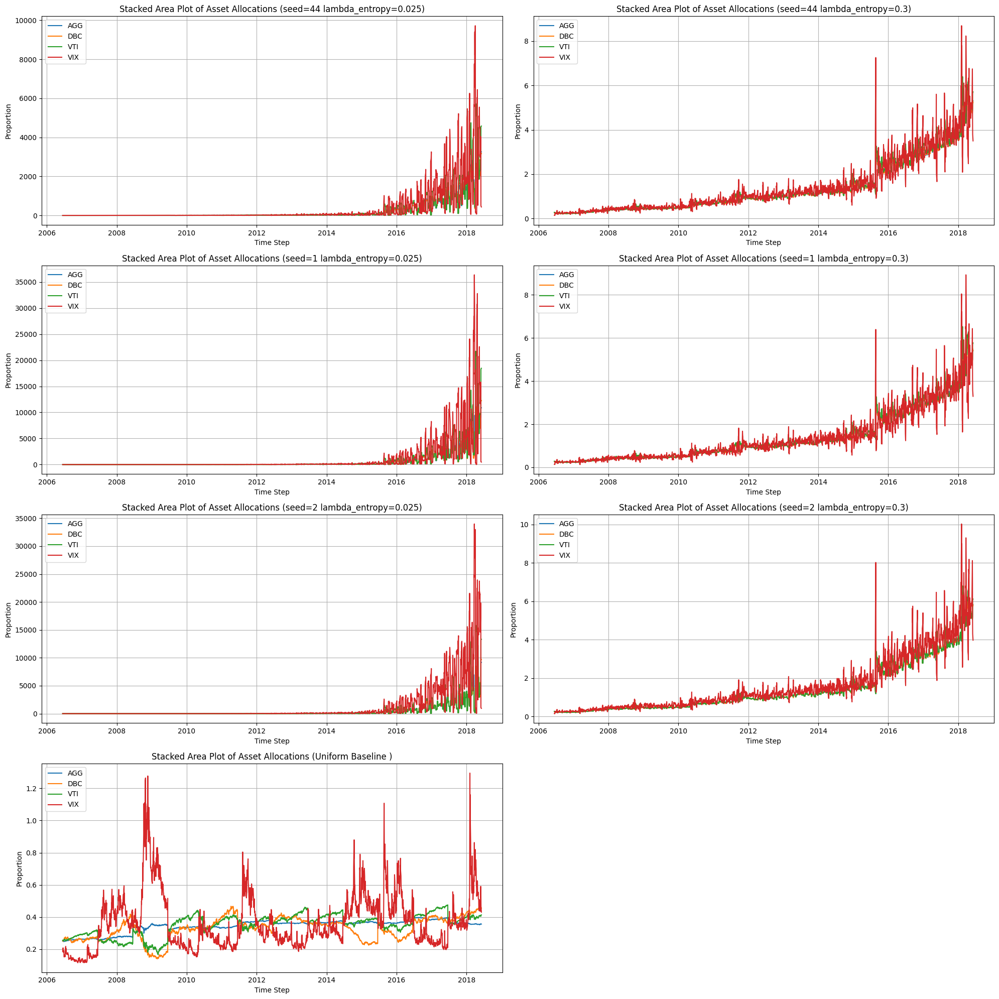

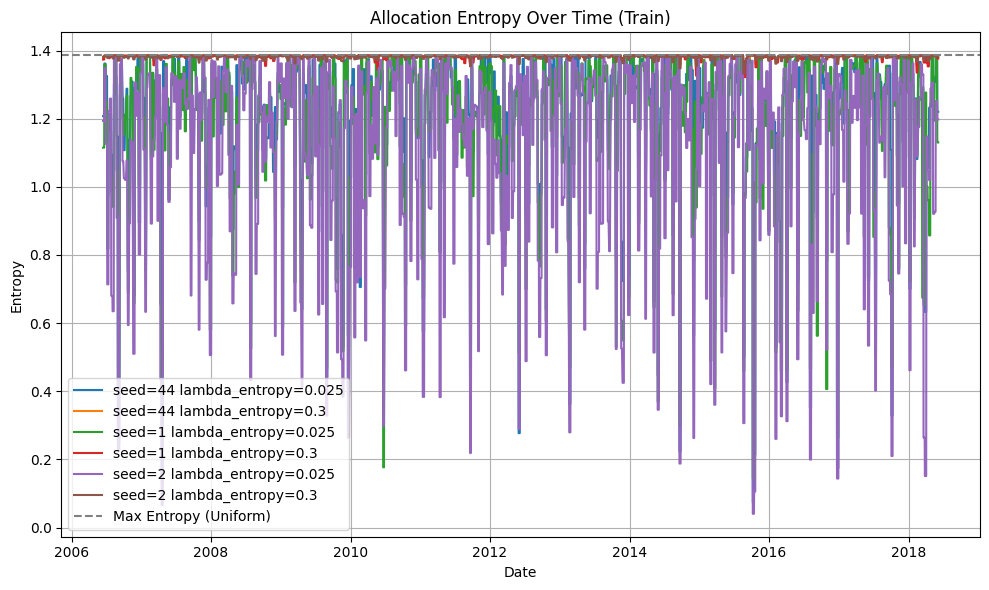

In [ ]:

# params_grids = [{
#     "seed": [44, 1, 2],
#     "epochs": [10],
#     "model": ["CNN"],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025, 0.3],#[0.01, 0.02, 0.025, 0.03],
#     "loss": ["Standard"]
# },
# ]

# experiment_path = "../experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx )

## End of useful results

In [ ]:

# standard_model = experiments["seed=3,epochs=5,model=CNN,alpha=0.5,robust_eps=0.0005,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]["model"]
# lb, ub = bound_model(standard_model, X_test_tensor[:5], 10, "IBP")

# lb, ub 

(tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]),
 tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]))

In [ ]:
# out_shape   = (x.shape[0], 4)  
# lb_out = torch.zeros(out_shape, device=x.device)
# ub_out = torch.ones (out_shape, device=x.device)

# my_intermediate_bounds = {
#     model.in[0]: (lb_out, ub_out),
# }



In [ ]:
# eps = e /10
# x = X_test_tensor[:4]

# N = x.shape[0]

# batch_size = 8
# upper_batches = []
# lower_batches = []

# for i in range(0, N, batch_size):
#     x_batch = x[i: i+batch_size]
#     eps_vector = torch.tensor(eps, dtype=torch.float32, device=x_batch.device)  # One ε per asset
#     eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
#     x_perturbed = BoundedTensor(x_batch, perturbation)
#     lb, ub = standard_model.compute_bounds(x=(x_perturbed,), method="CROWN")
#     lower_batches.append(lb)
#     upper_batches.append(ub)

# lower_all = torch.cat(lower_batches, dim=0)
# upper_all = torch.cat(upper_batches, dim=0)

# lower_all, upper_all

(tensor([[0.0776, 0.0761, 0.1333, 0.0833],
         [0.0763, 0.0748, 0.1321, 0.0816],
         [0.0782, 0.0762, 0.1336, 0.0847],
         [0.0767, 0.0750, 0.1325, 0.0819]]),
 tensor([[0.3756, 0.3694, 0.3084, 0.8849],
         [0.3768, 0.3707, 0.3092, 0.8953],
         [0.3741, 0.3682, 0.3080, 0.8831],
         [0.3761, 0.3703, 0.3090, 0.8923]]))

In [ ]:

# eps_vector = torch.tensor(eps, dtype=torch.float32, device=x.device) 
# eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

# perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
# x_perturbed = BoundedTensor(x, perturbation)
# N = x_perturbed.size(0)
# for i in range(0, N, batch_size):
#     x_batch = x_perturbed[i : i + batch_size]
    
#     print(standard_model.compute_bounds(x=(x_perturbed,), method="CROWN"))


#     print(standard_model.compute_bounds(x=(x_perturbed,), method="CROWN"))

(tensor([[0.0776, 0.0761, 0.1333, 0.0833]]), tensor([[0.3756, 0.3694, 0.3084, 0.8849]]))


In [ ]:
# def bound_model(model, x, eps, method, batch_size=8):
#     model.eval()
#     model.get_split_nodes()
#     # out_name = model.output_name[0]  # e.g. "output"
#     lower_batches = []
#     upper_batches = []

#     # build the per-example eps tensor correctly (assumes x is [N,C,...])
#     eps_vector = torch.tensor(eps, dtype=torch.float32, device=x.device)  # One ε per asset
#     eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
#     x_perturbed = BoundedTensor(x, perturbation)

#     N = x_perturbed.size(0)
#     for i in range(0, N, batch_size):
#         x_batch = x_perturbed[i : i + batch_size]

#         bs = x_batch.size(0)
#         # dynamically pick the final-output size instead of hard-coding 4
#         out_shape = (bs, 4)
#         # lb_out = torch.zeros(out_shape, device=x_batch.device)
#         # ub_out = torch.ones (out_shape, device=x_batch.device)
#         # my_intermediate_bounds = { out_name: (lb_out, ub_out) }

        

#         # unpack in the correct order and *include* your clamp
#         lb, ub = model.compute_bounds(
#             x=(x_batch,),
#             method=method,
#             # interm_bounds=my_intermediate_bounds,
#             # bound_lower=True,
#             # bound_upper=True,
#         )

#         lower_batches.append(lb)
#         upper_batches.append(ub)

#     lower_all = torch.cat(lower_batches, dim=0)
#     upper_all = torch.cat(upper_batches, dim=0)
#     return lower_all, upper_all

# # now this will clamp the final output to [0,1] and return properly ordered bounds
# bound_model(standard_model, X_test_tensor[:5], e, "CROWN")


(tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]),
 tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]))

In [ ]:
# bound_model(standard_model, X_test_tensor[:5], eps, "IBP")

(tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]),
 tensor([[0.1799, 0.1685, 0.2037, 0.4478],
         [0.1800, 0.1686, 0.2037, 0.4477],
         [0.1797, 0.1684, 0.2036, 0.4483],
         [0.1802, 0.1688, 0.2039, 0.4471],
         [0.1806, 0.1690, 0.2041, 0.4463]]))

In [ ]:
# def bound_data(model, x, eps):


#     model.eval()
#     n = y.shape[0]
#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps)
#     eps_vector = torch.tensor(eps, dtype=torch.float32) 
#     eps_tensor = eps_vector.view(1, -1).expand_as(x[0]) 

#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)

#     for t in range(0, n, rebalance_freq):
#         current_weights = model(x[t:t+1])

#         asset_returns = torch.tensor((1 + y[t:t+rebalance_freq]).prod(0))

#         model.bound_opts["optimize_bound_args"]["stop_criterion_func"] = get_func(asset_returns, current_weights, 0.02)

In [ ]:
# for t in range(0, n, rebalance_freq):
#         current_weights = model(x[t:t+1])
#         asset_returns = torch.tensor((1 + y[t:t+rebalance_freq]).prod(0))

#         model.bound_opts["optimize_bound_args"]["stop_criterion_func"] = get_func(asset_returns, current_weights, 0.02)

In [ ]:


# model_path = experiment_path + "/seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"
# model = BoundedModule(CNNAllocatorCausal(4, 50), X_train_tensor, bound_opts=bound_opts)
# # model = SimpleAssetAllocationModel()
# model.load_state_dict(torch.load(model_path, map_location=device))

In [ ]:
# def get_func(asset_returns, weights, delta):

#     # print((y * returns))


#     # print(asse/t_returns)
#     # print(weights)
#     model_returns = (asset_returns * weights).sum(1)
#     # print()

#     # print(ass)
# # 
#     # 0/0


# # model.bound_opts["optimize_bound_args"]["stop_criterion_func"] = get_func(y, model(x), None)
#     def func(x):

#         worst_weights = torch.abs(x)
#         worst_returns = (asset_returns * worst_weights).sum(1)

#         # print(model_returns, worst_returns)

#         true_delta = torch.abs((worst_returns - model_returns)) / model_returns

#         print(true_delta)

#         # print((true_delta < delta).all(dim=1, keepdim=True), true_delta)


#         # return (lambda x: (x>100).all(dim=1, keepdim=True))(x) 
#         return (true_delta < delta).unsqueeze(1).all(dim=1, keepdim=True)
#     return func

In [ ]:
# def get_portfiolio_value_bounded(model, data, rebalance_freq, eps):
#     portfolio_values = []
#     worst_values = []
#     x, y = data[0], data[1].numpy()

#     model.eval()
#     n = y.shape[0]
#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps)
#     eps_vector = torch.tensor(eps, dtype=torch.float32) 
#     eps_tensor = eps_vector.view(1, -1).expand_as(x[0]) 

#     perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)

#     ubs = []
#     lbs = []
#     returns = []
#     weights = []

#     n = 1
    
#     for t in range(0, n, rebalance_freq):
#         current_weights = model(x[t:t+1])

#         asset_returns = torch.tensor((1 + y[t:t+rebalance_freq]).prod(0))

#         model.bound_opts["optimize_bound_args"]["stop_criterion_func"] = get_func(asset_returns, current_weights, 0.02)


#         x_perturbed = BoundedTensor(x[t:t+1], perturbation)
#         ub, lb = model.compute_bounds(x=(x_perturbed,), method="CROWN-Optimized")
#         print("Final bounds")
#         print(lb, ub)
#         return

        

#         portfolio_return = current_weights * asset_returns
#         worst_return = torch.min(ub * asset_returns, lb * asset_returns).numpy()
#         portfolio_values.append(portfolio_return.sum())
#         worst_values.append(worst_return.sum())
#         ubs.append(ub)
#         lbs.append(lb)
#         returns.append(asset_returns)
#         weights.append(current_weights)


#     return np.array(portfolio_values), np.array(worst_values), ubs, lbs, weights, returns


In [ ]:
# bound_opts = {
#     "optimize_bound_args": {
#         "enable_alpha_crown": True,   # α-CROWN
#         "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
#         "optimizer": "adam",          
#         "iteration": 5,              # α/β optimization steps
#         "lr_alpha": 0.5,
#         "lr_beta": 0.05,
#         # "stop_criterion_func": func,
#         # "loss_reduction_func": func2 
#     },
    
#     # "lower_bound_verified":False,
#     "conv_mode": "matrix"
# }

# model_path = experiment_path + "/seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"
# model = BoundedModule(CNNAllocatorCausal(4, 50), X_train_tensor, bound_opts=bound_opts)


# # model = SimpleAssetAllocationModel()
# model.eval()
# model.load_state_dict(torch.load(model_path, map_location=device))
# model.get_split_nodes()
# # model =  BoundedModule(SimpleAssetAllocationModel(), X_train_tensor)


# # actual_value, worst_value = get_portfiolio_value_bounded(model, data, horizon, 1/1000)

# data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
# y = data[1][:1]
# x = data[0][:1]


In [ ]:
# get_portfiolio_value_bounded(model, data, 5, 0.0001)

/home/jamie/fourthyear/second_attempt/alpha-beta-CROWN/complete_verifier/auto_LiRPA/bound_general.py:1021: UserWarning: Creating an identity matrix with size 3200x3200 for node BoundConv(name=/input-11, inputs=[/input-7, /3, /4], perturbed=True). This may indicate poor performance for bound computation. If you see this message on a small network please submit a bug report.
  sparse_C = self.get_sparse_C(node, ref_intermediate)


tensor([0.0277], grad_fn=<DivBackward0>)
tensor([0.0273], grad_fn=<DivBackward0>)
tensor([0.0272], grad_fn=<DivBackward0>)
tensor([0.0272], grad_fn=<DivBackward0>)
tensor([0.0272])
tensor([0.0274], grad_fn=<DivBackward0>)
tensor([0.0272], grad_fn=<DivBackward0>)
tensor([0.0272], grad_fn=<DivBackward0>)


KeyboardInterrupt: 

In [ ]:
# def pgd_attack(model, x_init, y, eps, loss_fn= nn.MSELoss(), n_steps=100, step_size=0.1):
#     model.eval()

#     attack_point = x_init.clone().detach()
#     attack_loss = (-float('inf')) * torch.ones(x_init.shape[0], device=x_init.device)

#     with torch.enable_grad():
#         adv_input = x_init.clone().detach().requires_grad_(True)

#         for _ in range(n_steps):
#             if adv_input.grad is not None:
#                 adv_input.grad.zero_()

#             adv_outs = model(adv_input)
#             obj = loss_fn(adv_outs, y)

#             attack_point = torch.where(
#                 (obj >= attack_loss).view((-1,) + (1,) * (x_init.dim() - 1)),
#                 adv_input.detach().clone(), attack_point)
#             attack_loss = torch.where(obj >= attack_loss, obj.detach().clone(), attack_loss)

#             grad = torch.autograd.grad(obj.sum(), adv_input)[0]
#             adv_input = adv_input + step_size * grad.sign()

#             # Project to L∞ ball
#             delta = torch.clamp(adv_input - x_init, min=-eps, max=eps)
#             adv_input = (x_init + delta).detach().requires_grad_(True)

#         # Final selection
#         adv_outs = model(adv_input)
#         obj = loss_fn(adv_outs, y)
#         attack_point = torch.where(
#             (obj >= attack_loss).view((-1,) + (1,) * (x_init.dim() - 1)),
#             adv_input.detach().clone(), attack_point)

#     return attack_point

# def loss_fn(x, y):
#     loss = ((1 + y).prod(1) * x).sum(1)

#     return -loss

# def returns_fn(x, y):
#     loss = ((1 + y).prod(1) * x).sum(1)

#     return loss

# # pgd_attack(model, x, y, 0.01)

In [ ]:
# bound_opts = {
#     "optimize_bound_args": {
#         "enable_alpha_crown": True,   # α-CROWN
#         "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
#         "optimizer": "adam",          
#         "iteration": 10,              # α/β optimization steps
#         "lr_alpha": 0.5,
#         "lr_beta": 0.05,
#         "pruning_in_iteration": True
#     },
    
#     "conv_mode": "matrix"
# }

# model_path = experiment_path + "/seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"
# model = BoundedModule(CNNAllocatorCausal(4, 50), X_train_tensor, bound_opts=bound_opts)

# model.eval()
# # model.load_state_dict(torch.load(model_path, map_location=device))
# model.get_split_nodes()

([], {})

In [ ]:
# model = BoundedModule(CNNAllocatorCausal(4, 50), X_train_tensor, bound_opts=bound_opts)


In [ ]:
data = (X_test_tensor, y_test_tensor)
y = data[1][:1]
x = data[0][:1]

attack_point = pgd_attack(model, x, y, e, loss_fn,step_size=0.05, n_steps=200)

adv_returns = returns_fn(model(attack_point), y)
actual_returns = returns_fn(model(x), y)

(adv_returns - actual_returns)/actual_returns

tensor([-0.0003])

In [ ]:
adv_returns2 = sample_linf_ball(x[0],e , 10000)

In [ ]:
torch.min(returns_fn(model(adv_returns2), y)), adv_returns, returns_fn(model(x), y)

(tensor(0.9869), tensor([0.9867]), tensor([0.9870]))

tensor([0.1000, 0.1000, 0.1000, 0.1000])

In [ ]:
# perturbation = PerturbationLpNorm(norm=np.inf, eps=e)
# x_perturbed = BoundedTensor(x, perturbation)
# ub, lb = model.compute_bounds(x=(x_perturbed,), method="CROWN")

eps_vector = torch.tensor(e, dtype=torch.float32, device=x.device) 
eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
x_perturbed = BoundedTensor(x, perturbation)
lb, ub  = model.compute_bounds(x=(x_perturbed,), method="CROWN-Optimized")

lb, ub 

[WARNING] No optimizable parameters found. Will skip optimiziation. This happens e.g. if all optimizable layers are freezed or the network has no optimizable layers.
[WARNING] No optimizable parameters found. Will skip optimiziation. This happens e.g. if all optimizable layers are freezed or the network has no optimizable layers.


(tensor([[0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500]]),
 tensor([[0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         [0.2500, 0.2500, 0.2500, 0.2500],
         

In [ ]:

eps_tensor

tensor([[[0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         ...,
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954]],

        [[0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         ...,
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954]],

        [[0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         ...,
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954]],

        ...,

        [[0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         [0.2523, 1.0061, 1.0000, 6.4954],
         ...,
         [0.2523, 1.0

In [ ]:
e

array([0.25234786, 1.0061276 , 1.        , 6.49535039])

Bounding at [0.00252348 0.01006128 0.01       0.0649535 ]


100%|██████████| 3/3 [00:00<00:00, 876.00it/s]


(tensor([[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]),
 tensor([[1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],
         [1., 1., 1., 1.],

In [ ]:

batch_size = x.size(0)
out_shape   = (batch_size, 4) 

lb_out = torch.zeros(out_shape, device=x.device)
ub_out = torch.ones (out_shape, device=x.device)
out_name = standard_model.output_name[0]
my_intermediate_bounds = {
    out_name: (lb_out, ub_out),
}

standard_model.compute_bounds(x=(x_perturbed,), method="CROWN",  interm_bounds=my_intermediate_bounds)

(tensor([[ 3.3087e-23,  2.0762e-22,  1.4400e-20,  4.3051e-15],
         [ 4.9631e-24,  8.2304e-23,  2.3293e-21,  3.3325e-15],
         [-1.5882e-22, -3.7058e-22, -3.3881e-20,  2.5411e-21],
         [-2.6055e-14, -3.6069e-10, -5.2312e-14, -2.3469e-07],
         [ 1.9191e-22,  1.0667e-20,  5.7598e-20,  2.6173e-14],
         [-1.2622e-14, -1.4779e-10, -2.0764e-14, -1.8989e-07],
         [ 1.3764e-21,  5.1987e-19,  2.5750e-19,  1.0869e-13],
         [ 1.6907e-18,  2.9680e-18,  1.1731e-16,  1.9590e-08],
         [ 1.1980e-17,  1.0842e-17,  3.7817e-16,  1.1022e-07],
         [ 1.0842e-15,  7.4636e-16,  2.0206e-14,  4.3843e-07],
         [ 3.8719e-15,  2.1094e-15,  5.4928e-14,  7.1905e-07],
         [ 1.7130e-16,  1.1167e-16,  3.4556e-15,  3.2691e-07],
         [ 1.4658e-15,  7.5330e-16,  2.3662e-14,  4.5328e-07],
         [ 1.2108e-15,  7.0603e-16,  2.1400e-14,  4.0818e-07],
         [ 1.5416e-19,  1.9905e-19,  1.2577e-17,  7.6978e-09],
         [-4.6749e-15, -9.9217e-11, -7.2689e-16, -6.873

In [ ]:
lb_crown, ub_crown  = model.compute_bounds(x=(x_perturbed,), method="CROWN")
lb_crown, ub_crown  

/home/jamie/fourthyear/second_attempt/alpha-beta-CROWN/complete_verifier/auto_LiRPA/bound_general.py:1021: UserWarning: Creating an identity matrix with size 3200x3200 for node BoundConv(name=/input-11, inputs=[/input-7, /3, /4], perturbed=True). This may indicate poor performance for bound computation. If you see this message on a small network please submit a bug report.
  sparse_C = self.get_sparse_C(node, ref_intermediate)


(tensor([[0.1760, 0.1851, 0.1730, 0.1930]], grad_fn=<ViewBackward0>),
 tensor([[0.3488, 0.3418, 0.3496, 0.3618]], grad_fn=<ViewBackward0>))

In [ ]:
lb_crown, ub_crown  = model.compute_bounds(x=(x_perturbed,), method="CROWN",  interm_bounds=my_intermediate_bounds)
lb_crown, ub_crown 

/home/jamie/fourthyear/second_attempt/alpha-beta-CROWN/complete_verifier/auto_LiRPA/bound_general.py:1021: UserWarning: Creating an identity matrix with size 3200x3200 for node BoundConv(name=/input-11, inputs=[/input-7, /3, /4], perturbed=True). This may indicate poor performance for bound computation. If you see this message on a small network please submit a bug report.
  sparse_C = self.get_sparse_C(node, ref_intermediate)


(tensor([[0.1760, 0.1851, 0.1730, 0.1930]], grad_fn=<ViewBackward0>),
 tensor([[0.3488, 0.3418, 0.3496, 0.3618]], grad_fn=<ViewBackward0>))

In [ ]:
model.get_split_nodes()

lb, ub  = model.compute_bounds(x=(x_perturbed,), method="CROWN-Optimized")
lb, ub 

/home/jamie/fourthyear/second_attempt/alpha-beta-CROWN/complete_verifier/auto_LiRPA/bound_general.py:1021: UserWarning: Creating an identity matrix with size 3200x3200 for node BoundConv(name=/input-11, inputs=[/input-7, /3, /4], perturbed=True). This may indicate poor performance for bound computation. If you see this message on a small network please submit a bug report.
  sparse_C = self.get_sparse_C(node, ref_intermediate)


(tensor([[0.1941, 0.2016, 0.1919, 0.2104]]),
 tensor([[0.3075, 0.3071, 0.3049, 0.3219]]))

In [ ]:
# lb, ub  = model.compute_bounds(x=(x_perturbed,), method="CROWN-Optimized")
model.compute_bounds(x=(x_perturbed,), method="CROWN-Optimized",  interm_bounds=my_intermediate_bounds)

(tensor([[0.1941, 0.2016, 0.1919, 0.2104]]),
 tensor([[0.3075, 0.3071, 0.3049, 0.3219]]))

In [ ]:
model(x)

tensor([[0.2365, 0.2451, 0.2753, 0.2431]])

In [ ]:
(((1 + y).prod(1))-1)*ub, (((1 + y).prod(1))-1)*lb

(tensor([[ 0.0005,  0.0028,  0.0022, -0.0237]]),
 tensor([[ 0.0002,  0.0014,  0.0011, -0.0122]]))

In [ ]:
torch.min((((1 + y).prod(1))-1)*ub, (((1 + y).prod(1))-1)*lb).sum()+1

tensor(0.9791)

In [ ]:
torch.mean((adv_returns - actual_returns)/actual_returns)

tensor(-0.0772)

In [ ]:
e = returns_df.loc[train_indices].std()
e = (e / e["VTI"]).to_numpy()

# epses = [1/1000, 1/500, 1/2000, 0]
epses = [1/500]#[1/2000, 1/1000, 1/500]
data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
for model_name, experiment in tqdm(experiments.items()):
    experiment["results"]["test"]["worst_returns"] = {}
    model = experiment["model"]
    for eps in epses:
        actual_value, worst_value, ubs, lbs, weights, returns = get_portfiolio_value_bounded(model, data, horizon, e * eps)
        experiment["results"]["test"]["worst_returns"][eps] = worst_value - 1
        experiment["results"]["test"]["raw"]["returns_over_horizon"] = actual_value - 1
        experiment["results"]["test"]["raw"]["ubs"] = ubs
        experiment["results"]["test"]["raw"]["lbs"] = lbs
        experiment["results"]["test"]["raw"]["weights"] = weights
        experiment["results"]["test"]["raw"]["returns"] = returns
    

NameError: name 'experiments' is not defined

In [ ]:
from beta_CROWN_solver import LiRPANet

In [ ]:
from arguments import ConfigHandler


In [ ]:
model2 = BoundedModule(CNNAllocatorCausal(4, 50), X_train_tensor, bound_opts=bound_opts)

LiRPANet(model2, X_test_tensor.shape)

KeyError: 'general'

In [ ]:
test_deltas = [0.001,  0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.5]
for model_name, experiment in experiments.items():
    worst_returns_by_eps =  experiment ["results"]["test"]["worst_returns"]
    actual_returns = experiment["results"]["test"]["raw"]["returns_over_horizon"]
    experiment["results"]["test"]["metrics"]["robust_allocations"] = {}
    for eps, worst_returns in worst_returns_by_eps.items():
        delta = np.abs(worst_returns - actual_returns)/ (actual_returns+1)

        experiment["results"]["test"]["metrics"]["robust_allocations"][eps] = {}
        for test_delta in test_deltas:
            robust_allocations = sum(delta <= test_delta) / len(delta)
            experiment["results"]["test"]["metrics"]["robust_allocations"][eps][test_delta] = robust_allocations

rows = []
for e in experiments.values():
    model_label = label_from_params(e["params"], experiments)

    if "robust_eps" not in e["params"]:
        model_label = "Uniform baseline"
    elif e["params"]["robust_eps"] > 0:
        model_label = "Robust Model"
    else:
        model_label = "Standard Model"

    
    nested_allocations = e["results"]["test"]["metrics"]["robust_allocations"]
    
    for eps, delta_dict in nested_allocations.items():
        for delta, robust_allocation in delta_dict.items():
            rows.append({
                "model": model_label,
                "Test EPS": eps,
                "Test Delta": delta,
                "Roboust Allocation %": round(robust_allocation * 100, 2)
            })

df = pd.DataFrame(rows)
df = df[df["model"] != "Uniform baseline"]
df

,model,Test EPS,Test Delta,Roboust Allocation %
0,Robust Model,0.002,0.001,0.00
1,Robust Model,0.002,0.005,0.00
2,Robust Model,0.002,0.010,9.27
3,Robust Model,0.002,0.050,86.75
4,Robust Model,0.002,0.100,100.00
5,Robust Model,0.002,0.200,100.00
6,Robust Model,0.002,0.300,100.00
7,Robust Model,0.002,0.500,100.00
8,Standard Model,0.002,0.001,0.00
9,Standard Model,0.002,0.005,0.00


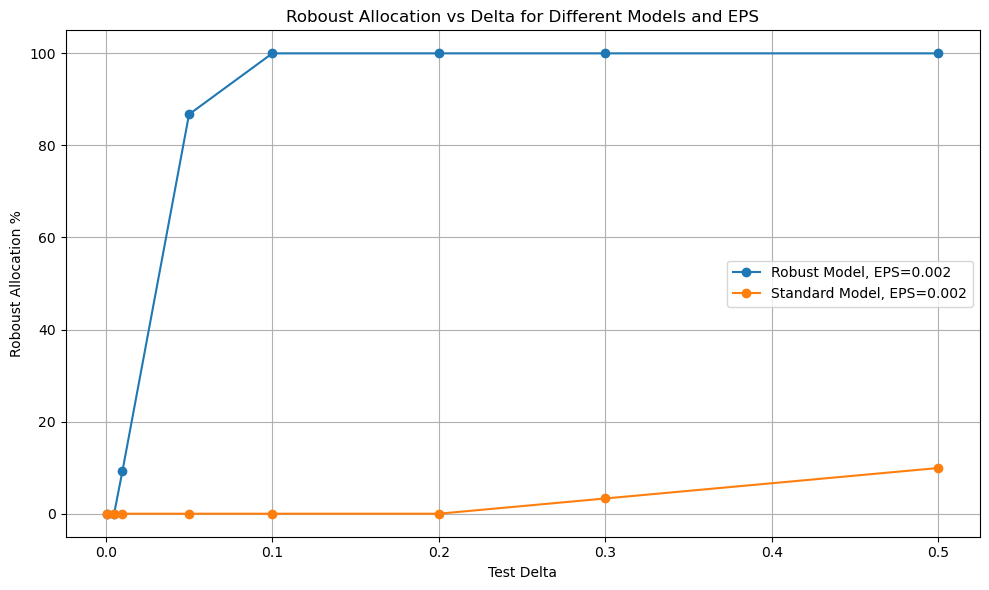

In [ ]:
plt.figure(figsize=(10, 6))

# Loop through each model
for model in df["model"].unique():
    subset = df[df["model"] == model]
    
    # Plot each Test EPS as a separate line
    for eps in sorted(subset["Test EPS"].unique()):
        data = subset[subset["Test EPS"] == eps]
        plt.plot(
            data["Test Delta"], 
            data["Roboust Allocation %"], 
            marker='o', 
            label=f"{model}, EPS={eps}"
        )

plt.xlabel("Test Delta")
plt.ylabel("Roboust Allocation %")
plt.title("Roboust Allocation vs Delta for Different Models and EPS")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

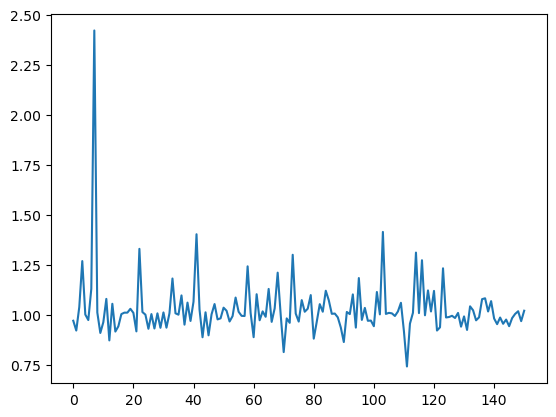

In [ ]:
model = experiments["seed=3,epochs=10,model=CNN,alpha=0,robust_eps=0.0,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]
# model = experiments["seed=3,epochs=10,model=CNN,alpha=0.5,robust_eps=0.0005,dropout=0.1,learning_rate=0.001,rebalance_freq=5,lambda_entropy=0.01.pth"]


returns = np.array(model["results"]["test"]["raw"]["returns"])
weights = np.array(model["results"]["test"]["raw"]["weights"]).squeeze(1)
lbs = np.array(model["results"]["test"]["raw"]["lbs"]).squeeze(1)
ubs = np.array(model["results"]["test"]["raw"]["ubs"]).squeeze(1)

returns_over_horizon = np.array(model["results"]["test"]["raw"]["returns_over_horizon"])


plt.figure()
plt.plot((returns * weights).sum(1))
plt.show()

In [ ]:
returns*ubs.shape

ValueError: operands could not be broadcast together with shapes (151,4) (2,) 

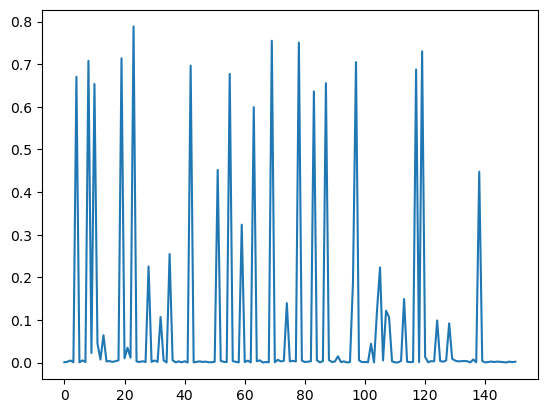

In [ ]:
worst_returns = torch.min(torch.tensor(returns*ubs), torch.tensor(lbs*returns)).sum(1)

plt.figure()
plt.plot(worst_returns)
plt.show()

In [ ]:
worst_returns

tensor([7.8187e-04, 1.6988e-03, 4.7304e-03, 6.4739e-04, 6.7065e-01, 4.1851e-04,
        4.9564e-03, 1.2090e-03, 7.0796e-01, 2.2318e-02, 6.5370e-01, 4.4794e-02,
        6.9775e-03, 6.4109e-02, 2.7010e-03, 3.2955e-03, 1.4513e-03, 3.0929e-03,
        5.0483e-03, 7.1412e-01, 9.8627e-03, 3.4693e-02, 1.1434e-02, 7.8868e-01,
        2.4625e-03, 1.2460e-03, 2.9594e-03, 1.0918e-03, 2.2542e-01, 1.4309e-03,
        4.7942e-03, 1.5087e-03, 1.0682e-01, 5.0876e-03, 1.0995e-04, 2.5467e-01,
        5.0482e-03, 3.0577e-04, 2.7633e-03, 3.6294e-04, 2.9189e-03, 9.8457e-05,
        6.9695e-01, 3.1686e-04, 1.6336e-03, 2.7174e-03, 1.3400e-03, 2.0197e-03,
        6.8706e-04, 6.4917e-04, 1.7982e-03, 4.5194e-01, 3.9273e-03, 1.5027e-03,
        1.1353e-03, 6.7729e-01, 3.4455e-03, 1.4556e-03, 4.4091e-04, 3.2350e-01,
        1.0235e-03, 4.3655e-03, 3.6805e-04, 5.9932e-01, 3.1072e-03, 5.0657e-03,
        8.2760e-05, 1.2790e-03, 3.4039e-04, 7.5520e-01, 7.4600e-04, 6.3772e-03,
        2.6200e-03, 3.8795e-03, 1.3929e-

In [ ]:
returns_tensor = torch.tensor(returns_over_horizon) + 1

In [ ]:

def sample_linf_ball(x: torch.Tensor, epsilon: torch.Tensor, num_samples: int = 100) -> torch.Tensor:

    N, D = x.shape
    # uniform in [-1, 1]
    noise_unit = torch.rand((num_samples, N, D), device=x.device, dtype=x.dtype) * 2 - 1
    # scale each feature by its ε[d]
    # epsilon: (D,) → (1, 1, D)
    eps = epsilon.reshape(1, 1, D)
    noise = noise_unit * eps

    # broadcast x: (N, D) → (1, N, D)
    samples = x.unsqueeze(0) + noise

    return samples

# Example usage:


In [ ]:
actual_model = model["model"]

In [ ]:
test_delta = 0.10

certified_robust = ((returns_tensor - worst_returns) / returns_tensor) <= test_delta
undecided = ((returns_tensor - worst_returns) / returns_tensor) > test_delta
undecided_i = np.where(undecided.numpy())[0]
cr_i = np.where(certified_robust.numpy())[0]

result = np.array(["Undecided"]*151)
result[cr_i] = "Robost"

In [ ]:
# points = sample_linf_ball(x, epsilon, num_samples=200)

/tmp/ipykernel_80487/3814489213.py:9: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  noise = noise_unit * eps


In [ ]:
e = returns_df.loc[train_indices].std()
e = (e / e["VTI"]).to_numpy()
             # your base tensor


epsilon = e/500

advX = torch.zeros(151,50,4)
adv_returns = torch.zeros(151)

for i in undecided_i:
    x = X_test_tensor[i]
    points = sample_linf_ball(x, epsilon, num_samples=200)
    points = torch.tensor(points, dtype=torch.float)


    advs = (actual_model(points) * returns[i]).sum(1)

    # print((actual_model(points) * returns[i]).sum(1).shape)

    adv_return, avd_idxs = advs.min(dim=0)

    advX[i] = points[avd_idxs]
    adv_returns[i] = adv_return

    # adv_return = min((actual_model(points) * returns[i]).sum(1))

    adv_delta = (returns_tensor[i] - adv_return)/ returns_tensor[i]
    

    if adv_delta > test_delta:
        # print(i)
        result[i] = "Non Robust"


/tmp/ipykernel_80487/3814489213.py:9: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  noise = noise_unit * eps
/tmp/ipykernel_80487/3168804381.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  points = torch.tensor(points, dtype=torch.float)


In [ ]:
result

NameError: name 'result' is not defined

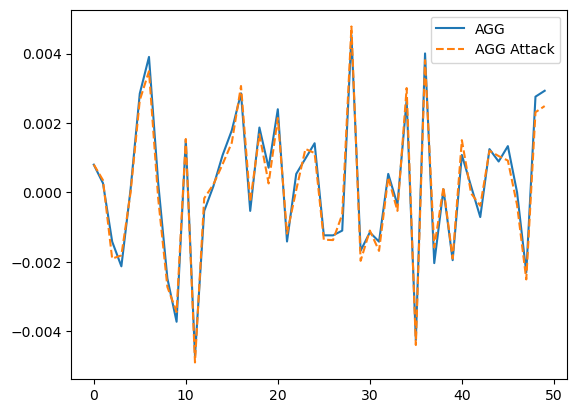

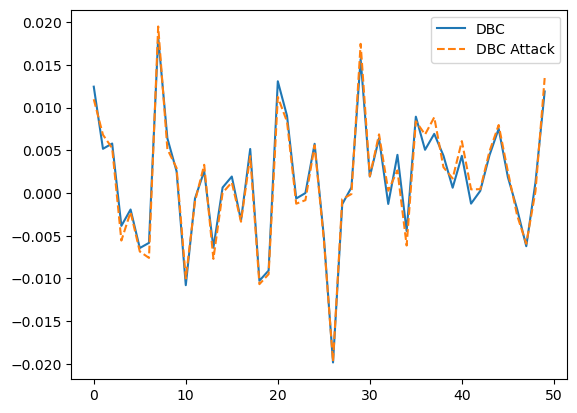

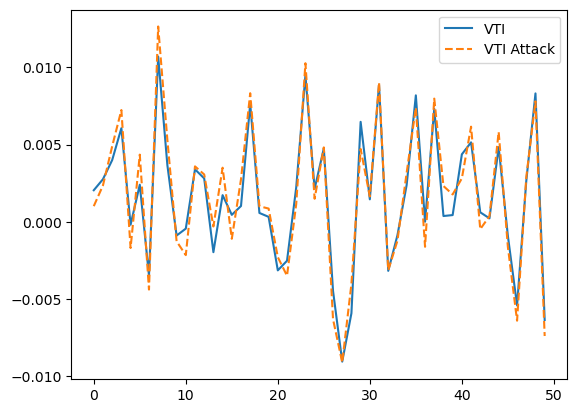

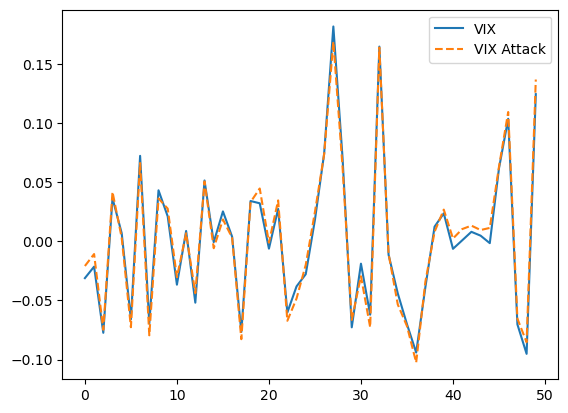

tensor(0.1405)


In [ ]:
non_robust_idx = np.where(result=="Non Robus")

i = non_robust_idx[0][0]


for j, asset in enumerate(asset_names):
    plt.figure()
    plt.plot(X_test_tensor[i].T[j], label=f"{asset}")
    plt.plot(advX[i].T[j], label=f"{asset} Attack", linestyle="--")
    # plt.plot(range(50,55),y_test_tensor[i].T[j], label)
    plt.legend()
    plt.show()

print((returns_tensor[i] - adv_returns[i])/ returns_tensor[i])

In [ ]:
torch.norm(X_test_tensor[i] - advX[i], p=float('inf'), dim=0), e/500


(tensor([0.0005, 0.0019, 0.0019, 0.0129]),
 array([0.00050469, 0.00201226, 0.002     , 0.0129907 ]))

In [ ]:
actual_model(X_test_tensor[i].unsqueeze(0)), actual_model(advX[i].unsqueeze(0))

(tensor([[0.1311, 0.1323, 0.1208, 0.6158]]),
 tensor([[0.2061, 0.2112, 0.2105, 0.3723]]))

In [ ]:
torch.max(torch.abs(A - B), dim=1)

array([0.2571807 , 0.25636262, 0.45534447, 0.03111224], dtype=float32)

0.02

In [ ]:
 > test_delta

tensor(True)

In [ ]:
model

torch.Size([50, 4])

## Complete verification

In [ ]:
import torch
import numpy as np
from auto_LiRPA import BoundedModule, BoundedTensor
from auto_LiRPA.perturbations import PerturbationLpNorm

# ————————————————————————————————————————————————
# 1) Wrap your forecasting model with β-CROWN enabled
# ————————————————————————————————————————————————
bound_opts = {
    "optimize_bound_args": {
        "enable_alpha_crown": True,   # α-CROWN
        "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
        # "optimizer": "adam",          
        # "iteration": 15,              # α/β optimization steps
        "lr_alpha": 0.5,
        # "lr_beta": 0.05,
    }
}
# Use a dummy input to infer shapes
dummy_x = torch.randn(1, 50, 4)
model = BoundedModule(SimpleAssetAllocationModel(200), (dummy_x,), bound_opts=bound_opts)
model.eval()

# ————————————————————————————————————————————————
# 2) Select your real batch & perturbation
# ————————————————————————————————————————————————
# Suppose X_test_tensor is shape (N, 50, 4)
t = 0
x_pt = X_test_tensor[t:t+1]  # shape (1,50,4)

ptb = PerturbationLpNorm(norm=np.inf, eps=dummy_x)
x_bounded = BoundedTensor(x_pt, ptb)

# ————————————————————————————————————————————————
# 3) Compute full (α+β) bounds and get the A-matrices
# ————————————————————————————————————————————————
# No C matrix → returns lb/ub of shape (1,50,4)
lb, ub, A_dict = model.compute_bounds(
    x=(x_bounded,),
    method="CROWN-Optimized",
    return_A=True
)

# print("Lower bounds shape:", lb.shape)   # (1,50,4)
# print("Upper bounds shape:", ub.shape)   # (1,50,4)

# # ————————————————————————————————————————————————
# # 4) Scan for a violation & concretize
# # ————————————————————————————————————————————————
# # For example, find any (time, feature) where lb < 0
# lb_np = lb.detach().cpu().numpy().reshape(-1)
# if (lb_np < 0).any() or True:
#     idx = int(np.argmin(lb_np))      # flat index of worst violation
#     t_idx = idx // 4                 # time step
#     f_idx = idx % 4                  # feature channel

#     # A_dict[x_bounded] is a flat list of (lA, uA) for each output neuron
#     lA, uA = A_dict[x_bounded][idx]  

#     # sign=+1 gives the perturbation that hits the upper-bound adversarial example
#     x_adv = ptb.concretize(x_pt, uA, sign=+1)

#     print(f"✗ Violation at time step {t_idx}, feature {f_idx}")
#     print("Lower bound:", lb_np[idx])
#     # print("Co

A_dict

AttributeError: 'BoundedModule' object has no attribute 'split_nodes'

In [ ]:

data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
x, y =data

model.eval()

perturbation = PerturbationLpNorm(norm=np.inf, eps=(0.1))

t = 0
x_perturbed = BoundedTensor(x[t:t+1], perturbation)

bound_opts = {
    # turn on branching
    "branch": True,
    # how many splits (you can tune; more splits = tighter but slower)
    "max_splits": 20,
    # heuristic: split the neuron/layer with largest bound‐gap
    "branching_heuristic": "largest_interval",
    # overall timeout (secs)
    "timeout": 60,
}
model = BoundedModule(UniformModel(), X_train_tensor, bound_opts)
# 4) do the complete verification pass
#    return_inputs=True tells auto_LiRPA to also give you the adversarial example
ub, lb = model.compute_bounds(
    x=(x_perturbed,),
    method="backward",        # still using the backward pass, but now with B&B
    # bound_opts=bound_opts,
    # return_inputs=True        # ⟵ request the worst‐case input
)
# ub, lb = model.compute_bounds(x=(x_perturbed,), method="backward", return_inputs=True )

# for t in range(0, n, rebalance_freq):
#     current_weights = model(x[t:t+1]).detach().numpy()
#     x_perturbed = BoundedTensor(x[t:t+1], perturbation)
#     ub, lb = model.compute_bounds(x=(x_perturbed,), method="backward")

#     asset_returns = (1 + y[t:t+rebalance_freq]).prod(0)

#     portfolio_return = current_weights * asset_returns
#     worst_return = torch.min(ub * asset_returns, lb * asset_returns).numpy()
#     portfolio_values.append(portfolio_return.sum())
#     worst_values.append(worst_return.sum())

# return np.array(portfolio_values), np.array(worst_values)
ub, lb 

(tensor([[0.2500, 0.2500, 0.2500, 0.2500]]),
 tensor([[0.2500, 0.2500, 0.2500, 0.2500]]))

In [ ]:
model.verify()

AttributeError: 'BoundedModule' object has no attribute 'verify'

In [ ]:
def round_sf(x, sig=2):
    if x == 0:
        return 0
    return round(x, sig - int(np.floor(np.log10(abs(x)))) - 1)

In [ ]:
results_grid = [{
    "eps": [e/ 1000, e/ 2000],
    "delta": [0.01, 0.05, 0.1],
}]

sets = grid_to_sets(results_grid)

for i,asset in enumerate(asset_names):
    sets = [ {f"{asset} ε" : round_sf(x["eps"][i])} | x for x in sets]

sets_df = pd.DataFrame(sets)
sets_df.drop(columns=["eps"])

,VIX ε,VTI ε,DBC ε,AGG ε,delta
0,0.0065,0.0010,0.0010,0.00025,0.01
1,0.0065,0.0010,0.0010,0.00025,0.05
2,0.0065,0.0010,0.0010,0.00025,0.10
3,0.0032,0.0005,0.0005,0.00013,0.01
4,0.0032,0.0005,0.0005,0.00013,0.05
5,0.0032,0.0005,0.0005,0.00013,0.10


In [ ]:

data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = robust_model

e_ = np.array([0.0001, 0.0001, 0.0001, 0.0001])

# portfolio_values, worst_values = get_portfiolio_value_bounded(model, data, 5, 0.0001)
portfolio_values_, worst_values_ = get_portfiolio_value_bounded(model, data, 5, e/1000)





/tmp/ipykernel_4820/1492607090.py:29: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  worst_return = torch.min(ub * asset_returns, lb * asset_returns).numpy()


In [ ]:
epses = [1/1000,1/2000,1/5000,1/10000]
worst_values_by_eps = {}
model = robust_model
for eps in epses:
    print(eps)
    portfolio_values, worst_values = get_portfiolio_value_bounded(model, data, 5, e*eps)
    worst_values_by_eps[eps] = worst_values

0.001


/tmp/ipykernel_4820/1492607090.py:29: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  worst_return = torch.min(ub * asset_returns, lb * asset_returns).numpy()


0.0005
0.0002
0.0001


In [ ]:
results_grid = [{
    "eps": epses,
    "delta": [0.01, 0.05, 0.1, 0.2, 0.3, .5],
}]


sets = grid_to_sets(results_grid)
# sets_df = pd.DataFrame(sets)

aug_sets = []

for set in sets:
    worst_values = worst_values_by_eps[set["eps"]]
    test_delta = set["delta"]

    actual_detla = ((worst_values- portfolio_values)/(portfolio_values-1))

    abs_robust_count = sum(np.abs(actual_detla) <= test_delta)
    robust_count = sum((actual_detla) <= test_delta)

    counter = np.where(np.abs(actual_detla) <= test_delta, portfolio_values, worst_values)

    

    metrics = {"abs_robust": round(abs_robust_count/151*100), "robust": round(robust_count/151*100),
               "actual_returns": portfolio_values.prod(),
               "worst_returns": worst_values.prod(),
               "counterfactual": counter.prod()
               }

    # print(abs_robust_count, robust_count)
    aug_sets.append(set | metrics)

pd.DataFrame(aug_sets)

,eps,delta,abs_robust,robust,actual_returns,worst_returns,counterfactual
0,0.0010,0.01,0,43,4.228312,0.000817,0.000817
1,0.0010,0.05,0,43,4.228312,0.000817,0.000817
2,0.0010,0.10,0,43,4.228312,0.000817,0.000817
3,0.0010,0.20,1,43,4.228312,0.000817,0.000869
4,0.0010,0.30,3,43,4.228312,0.000817,0.000992
5,0.0010,0.50,12,46,4.228312,0.000817,0.002021
6,0.0005,0.01,0,43,4.228312,0.080566,0.080566
7,0.0005,0.05,0,43,4.228312,0.080566,0.080566
8,0.0005,0.10,1,43,4.228312,0.080566,0.082937
9,0.0005,0.20,6,44,4.228312,0.080566,0.096862


In [ ]:
epses = [1/1000,1/2000,1/5000,1/10000]
worst_values_by_eps = {}
model = standard_model
for eps in epses:
    print(eps)
    portfolio_values, worst_values = get_portfiolio_value_bounded(model, data, 5, e*eps)
    worst_values_by_eps[eps] = worst_values

results_grid = [{
    "eps": epses,
    "delta": [0.01, 0.05, 0.1, 0.2, 0.3],
}]


sets = grid_to_sets(results_grid)
# sets_df = pd.DataFrame(sets)

aug_sets = []

for set in sets:
    worst_values = worst_values_by_eps[set["eps"]]
    test_delta = set["delta"]

    actual_detla = ((worst_values- portfolio_values)/(portfolio_values-1))

    abs_robust_count = sum(np.abs(actual_detla) <= test_delta)
    robust_count = sum((actual_detla) <= test_delta)
    print(abs_robust_count, robust_count)
    aug_sets.append(set | {"abs_robust": round(abs_robust_count/151*100), "robust": round(robust_count/151*100)})

pd.DataFrame(aug_sets)

0.001


/tmp/ipykernel_4820/1492607090.py:29: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  worst_return = torch.min(ub * asset_returns, lb * asset_returns).numpy()


0.0005
0.0002
0.0001
0 83
0 83
0 83
0 83
0 83
0 83
0 83
0 83
0 83
1 83
0 83
1 83
1 83
6 87
7 87
0 83
4 85
7 87
14 88
22 90


,eps,delta,abs_robust,robust
0,0.0010,0.01,0,55
1,0.0010,0.05,0,55
2,0.0010,0.10,0,55
3,0.0010,0.20,0,55
4,0.0010,0.30,0,55
5,0.0005,0.01,0,55
6,0.0005,0.05,0,55
7,0.0005,0.10,0,55
8,0.0005,0.20,0,55
9,0.0005,0.30,1,55


In [ ]:
# TODO get robsust bounds with beta crown

array([False, False,  True,  True,  True, False,  True,  True,  True,
       False, False,  True, False,  True, False, False,  True,  True,
        True,  True,  True, False,  True,  True, False, False,  True,
       False, False, False,  True, False,  True,  True,  True, False,
        True, False,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True, False, False,  True,  True, False,  True,
        True, False, False,  True,  True,  True, False,  True, False,
        True,  True,  True, False,  True,  True, False, False, False,
       False,  True,  True, False,  True,  True,  True,  True, False,
       False, False,  True,  True,  True, False,  True, False, False,
       False,  True,  True,  True, False,  True, False,  True, False,
       False, False, False, False,  True,  True,  True,  True, False,
        True,  True, False,  True, False,  True,  True,  True,  True,
       False,  True,  True,  True,  True, False, False, False, False,
        True, False,

In [ ]:
portfolio_values.prod(), worst_values.prod()

(np.float32(12.491333), np.float32(0.0056120516))

In [ ]:
values, _, _ = get_portfiolio_value(standard_model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)),5)

In [ ]:
values

array([ 0.99297833,  0.9899508 ,  0.99993134,  1.0006613 ,  0.9989188 ,
        0.9894779 ,  0.9705469 ,  0.9705136 ,  0.9654833 ,  0.96795875,
        0.96894574,  0.96697414,  0.96003133,  0.9856914 ,  0.9858613 ,
        0.98870903,  1.0646106 ,  1.2435169 ,  1.1481788 ,  1.1533082 ,
        1.151495  ,  1.1420332 ,  1.1408738 ,  1.1480025 ,  1.1570781 ,
        1.1487265 ,  1.1727091 ,  1.1515735 ,  1.1591935 ,  1.0906732 ,
        1.1162552 ,  1.087175  ,  1.1592058 ,  1.1323408 ,  1.2053685 ,
        1.2638361 ,  1.5735002 ,  1.6774086 ,  1.6627111 ,  2.1173892 ,
        2.1024013 ,  2.1721792 ,  2.1350243 ,  2.1949875 ,  2.1396084 ,
        2.1032443 ,  1.9676362 ,  2.0327055 ,  1.9593394 ,  1.8178936 ,
        1.9432876 ,  1.7646923 ,  1.8181428 ,  1.7244873 ,  1.7439848 ,
        1.687928  ,  1.6620342 ,  1.7279936 ,  1.7590275 ,  1.7817521 ,
        1.7509722 ,  1.7782892 ,  1.7578323 ,  1.7003533 ,  1.7275453 ,
        1.7234504 ,  1.786511  ,  1.7916428 ,  1.821799  ,  1.84

In [ ]:
data = (X_test_tensor[::5], y_test_tensor[::5])
x, y = data

x = x
y = y

# eps_vector = torch.tensor(e, dtype=torch.float32, device=x.device)  # One ε per asset
# eps_tensor = eps_vector.view(1, 1, -1).expand_as(x) 

# perturbation = PerturbationLpNorm(norm=np.inf, eps=(0.1))
# x_perturbed = BoundedTensor(x, perturbation)
# ub, lb = model.compute_bounds(x=(x_perturbed,), method="backward")

#    ub_, lb_ = model.compute_bounds(x=(x_perturbed,), method="CROWN-IBP")

weights = model(x)
weights = weights.unsqueeze(1).repeat(1, horizon, 1)



        # ub = ub_.unsqueeze(1).repeat(1, horizon, 1)
        # lb = lb_.unsqueeze(1).repeat(1, horizon, 1)

        # portfolio_returns = (weights * y).sum(1).sum(1)
        # worst_returns = torch.min(ub * y, lb * y).sum(1).sum(1)


# cr = (y+1).prod(1)

# actual_returns = (cr * weights).sum(1).cumprod(0)
# # counterfactual_returns = torch.min(ub * cr, lb * cr).sum(1).cumprod(0)
# actual_returns

(((weights * y)).sum(2)+1).prod(1).prod()

tensor(12.8757)

In [ ]:
def get_portfiolio_value(model, data, rebalance_freq):
    # data = X_test_tensor, y_test_tensor

    portfolio_values = [1]
    x, y = data

    # y = y_[:,:1:,].squeeze(1)
    model.eval()
    n = y.shape[0]

    returns = y.numpy()

    # print(returns.shape)

    initial_weights = model(x[:1]).detach().numpy()
    current_weights = initial_weights.copy()

    asset_values = initial_weights.copy()

    weights = []
    holdings = []
    weights.append(initial_weights)
    holdings.append(asset_values)
    for t in range(1, len(returns)):
        # print(returns[t])
        asset_values = asset_values * (1 + returns[t])
        if t % rebalance_freq == 0:
            total_value = asset_values.sum()
            current_weights = model(x[t:t+1]).detach().numpy()
            asset_values = total_value * current_weights

        portfolio_values.append(asset_values.sum())
        weights.append(current_weights)
        holdings.append(asset_values)

    return np.array(portfolio_values), np.array(weights), np.array(holdings)


data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = standard_model
get_portfiolio_value(model, data, 5)[0]

array([1.        , 0.9964056 , 1.00707829, 1.0077343 , 1.00596702,
       1.00170147, 0.98218858, 0.98217082, 0.97695959, 0.97949564,
       0.98012662, 0.97813344, 0.97112393, 0.99703729, 0.99719256,
       0.99878609, 1.07524061, 1.25548005, 1.15942478, 1.16458702,
       1.11887312, 1.10982084, 1.10860562, 1.11543322, 1.12422919,
       1.12700415, 1.15068007, 1.12983274, 1.13733721, 1.06970859,
       1.0897944 , 1.06158447, 1.1314851 , 1.10545206, 1.17629528,
       1.26703548, 1.56253064, 1.66105723, 1.64667976, 2.0808568 ,
       2.11432457, 2.18457031, 2.14720297, 2.20749164, 2.15176082,
       2.1125586 , 1.97555232, 2.04136157, 1.96755123, 1.82530797,
       1.92771494, 1.752859  , 1.80407095, 1.71175396, 1.73147452,
       1.6800853 , 1.65244627, 1.71828771, 1.74958658, 1.77170038,
       1.77494299, 1.80312729, 1.78229344, 1.72352862, 1.75129426,
       1.74557149, 1.8102318 , 1.8153851 , 1.84637332, 1.87034488,
       1.86443663, 1.75100541, 1.85059428, 1.82608902, 1.76379

In [ ]:
def get_portfiolio_value2(model, data, rebalance_freq, y_):
    # data = X_test_tensor, y_test_tensor

    portfolio_values = [1]
    x, y = data

    # y = y_[:,:1:,].squeeze(1)
    model.eval()
    n = y.shape[0]

    returns = y.numpy()

    # print(returns.shape)

    initial_weights = model(x[:1]).detach().numpy()
    current_weights = initial_weights.copy()

    asset_values = initial_weights.copy()

    print(asset_values)
  

    t = 1
    while t <len(returns):

        for i in range(0, rebalance_freq):
            asset_values = asset_values * (1 + returns[t])
            # print(t, asset_values)
            t+=1
            if t >= len(returns):
                break
        # 0/0
        t-=1
        
        if t % rebalance_freq == 0:
            total_value = asset_values.sum()
            current_weights = model(x[t:t+1]).detach().numpy()
            asset_values = total_value * current_weights

        portfolio_values.append(asset_values.sum())


        t+=1

    return np.array(portfolio_values), np.array(weights), np.array(holdings)


data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = standard_model
b = get_portfiolio_value2(model, data, 5, y_test_tensor)[0]


[[0.24577539 0.26115805 0.40892696 0.08413951]]


NameError: name 'holdings' is not defined

In [ ]:
def get_portfiolio_value3(model, data, rebalance_freq, y_):
    # data = X_test_tensor, y_test_tensor

    portfolio_values = [1]
    x, y = data

    # y = y_[:,:1:,].squeeze(1)
    model.eval()
    n = y.shape[0]

    returns = y.numpy()

    t = 0
    total_value = 1

    print(t, len(returns))
    while t < len(returns):
        # print(t)
        
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights


        for i in range(0, rebalance_freq):
            t+=1
            if t >= len(returns):
                break
            asset_values = asset_values * (1 + returns[t])            
      
 
        portfolio_values.append(asset_values.sum())
    
        total_value = asset_values.sum()



    return np.array(portfolio_values)


data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = standard_model
a = get_portfiolio_value3(model, data, 5, y_test_tensor)

0 752


In [ ]:
def get_portfiolio_value4(model, data, rebalance_freq, y_):
    # data = X_test_tensor, y_test_tensor

    portfolio_values = [1]
    x, y = data

    # y = y_[:,:1:,].squeeze(1)
    model.eval()
    n = y.shape[0]

    returns = y.numpy()

    t = 0
    total_value = 1

    # print(t, len(returns))
    k = 0
    while t < len(returns):
        # print(t)
        
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights


        for i in range(0, rebalance_freq):
           
            if t >= len(returns):
                break

            # bruh
            asset_values = asset_values * (1 + returns[t]) 
            t+=1

            # print(t, k, returns[t], y_[k][i])           
      
 
        portfolio_values.append(asset_values.sum())
    
        total_value = asset_values.sum()
        k+=5



    return np.array(portfolio_values)


data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = standard_model
get_portfiolio_value4(model, data, 5, y_test_tensor)


# model = UniformModel()
# data = (X_test_tensor_annual, y_test_tensor_annual[:, 0:1, :].squeeze(1))
# get_portfiolio_value4(model, data, 252, y_test_tensor)

array([ 1.        ,  0.99891901,  0.96795845,  0.98586088,  1.15330791,
        1.15707779,  1.09067297,  1.20536864,  2.11738324,  2.13960147,
        1.81788814,  1.74397922,  1.78174663,  1.72754061,  1.84528089,
        1.72985339,  1.64831662,  1.67957282,  1.71379328,  1.93696904,
        1.99089229,  2.0028367 ,  1.86049044,  2.4638896 ,  2.49261999,
        2.48751783,  2.32299924,  2.33500886,  2.2434752 ,  2.23994207,
        2.14755201,  2.17037582,  2.04397964,  2.05757952,  2.34228706,
        2.409688  ,  2.31293297,  2.51031566,  2.44238663,  2.50447559,
        2.52895308,  2.71483374,  3.64166594,  3.76111054,  3.02735806,
        3.07438183,  2.8249712 ,  2.83166647,  2.89859438,  2.8285327 ,
        2.77801299,  2.84285808,  2.91183257,  2.81881094,  2.82388902,
        3.03284025,  2.95907927,  2.94452   ,  2.95410228,  3.42761278,
        3.4844687 ,  3.09003758,  3.38687682,  3.38370061,  3.44138789,
        3.44662952,  3.87193632,  3.8021102 ,  3.8674593 ,  4.23

In [ ]:
def get_portfiolio_value4(model, data, rebalance_freq):
    portfolio_values = [1]
    x, y = data[0], data[1].numpy()

    model.eval()
    n = y.shape[0]
    total_value = 1

    for t in range(0, n, rebalance_freq):
        
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights
        asset_values *= (1 + y[t]).prod(0)
        portfolio_values.append(asset_values.sum())
        total_value = asset_values.sum()

    return np.array(portfolio_values)


data = (X_test_tensor, y_test_tensor)
model = standard_model
get_portfiolio_value4(model, data, 5)


array([ 1.        ,  0.99891901,  0.96795851,  0.98586082,  1.15330803,
        1.15707779,  1.09067297,  1.20536852,  2.11738324,  2.13960171,
        1.81788838,  1.74397969,  1.7817471 ,  1.72754097,  1.84528112,
        1.72985375,  1.6483171 ,  1.6795733 ,  1.71379375,  1.93696988,
        1.99089301,  2.00283766,  1.86049128,  2.46389055,  2.49262094,
        2.48751879,  2.32300019,  2.33500957,  2.24347591,  2.23994303,
        2.14755297,  2.17037678,  2.04398036,  2.05757999,  2.34228778,
        2.40968871,  2.31293368,  2.5103159 ,  2.44238687,  2.50447559,
        2.52895308,  2.7148335 ,  3.64166594,  3.76111078,  3.02735829,
        3.07438159,  2.8249712 ,  2.83166623,  2.8985939 ,  2.82853198,
        2.77801204,  2.84285688,  2.91183138,  2.81880975,  2.8238883 ,
        3.0328393 ,  2.95907831,  2.94451904,  2.95410109,  3.42761135,
        3.48446751,  3.09003639,  3.38687515,  3.38369918,  3.4413867 ,
        3.44662857,  3.87193584,  3.80210996,  3.86745882,  4.23

In [ ]:
def get_portfiolio_value6(model, data, rebalance_freq):
    portfolio_values = []
    x, y = data[0], data[1].numpy()

    model.eval()
    n = y.shape[0]
    total_value = 1

    weights = []

    for t in range(0, n, rebalance_freq):
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights
        weights.extend([current_weights] * rebalance_freq)
        portfolio_values.extend((1 + y[t:t+rebalance_freq]).cumprod(0) * asset_values)
        asset_values *= (1 + y[t:t+rebalance_freq]).prod(0)
        total_value = asset_values.sum()

    portfolio_values = np.array(portfolio_values)
    weights = np.array(weights)

    return portfolio_values.sum(1), weights[:n], portfolio_values

data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))
model = UniformModel()

In [ ]:
def get_portfiolio_value5(model, data, rebalance_freq):
    portfolio_values = []
    x, y = data[0], data[1].numpy()

    model.eval()
    n = y.shape[0]
    total_value = 1

    for t in range(0, n, rebalance_freq):
        
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights
        portfolio_values.extend((1 + y[t]).cumprod(0) * asset_values)
        asset_values *= (1 + y[t]).prod(0)
        total_value = asset_values.sum()

    portfolio_values = np.array(portfolio_values)

    return portfolio_values.sum(1)


data = (X_test_tensor, y_test_tensor)
model = standard_model
get_portfiolio_value5(model, data, 5)


array([ 0.99297845,  0.989951  ,  0.9999314 ,  1.0006614 ,  0.998919  ,
        0.989478  ,  0.9705468 ,  0.97051346,  0.96548307,  0.9679585 ,
        0.9689454 ,  0.9669739 ,  0.96003103,  0.985691  ,  0.9858608 ,
        0.9887085 ,  1.0646102 ,  1.2435169 ,  1.1481786 ,  1.153308  ,
        1.151495  ,  1.1420331 ,  1.1408734 ,  1.1480021 ,  1.1570778 ,
        1.148726  ,  1.1727085 ,  1.1515731 ,  1.159193  ,  1.090673  ,
        1.116255  ,  1.0871749 ,  1.1592058 ,  1.1323407 ,  1.2053685 ,
        1.2638361 ,  1.5734981 ,  1.6774058 ,  1.6627082 ,  2.1173832 ,
        2.1023953 ,  2.1721725 ,  2.1350183 ,  2.194981  ,  2.1396017 ,
        2.103238  ,  1.9676306 ,  2.0326998 ,  1.9593338 ,  1.8178884 ,
        1.9432825 ,  1.7646874 ,  1.8181375 ,  1.724482  ,  1.7439797 ,
        1.6879232 ,  1.6620294 ,  1.7279887 ,  1.7590226 ,  1.7817471 ,
        1.7509674 ,  1.7782844 ,  1.7578276 ,  1.7003487 ,  1.727541  ,
        1.7234454 ,  1.7865059 ,  1.7916377 ,  1.8217943 ,  1.84

In [ ]:
data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))

portfolio_values = [1]
rebalance_freq = 5
x, y = data

# y = y_[:,:1:,].squeeze(1)
model.eval()
n = y.shape[0]

returns = y.numpy()

# print(returns.shape)

initial_weights = model(x[:1]).detach().numpy()
current_weights = initial_weights.copy()

asset_values = initial_weights.copy()

weights = []
holdings = []
weights.append(initial_weights)
holdings.append(asset_values)
for t in range(1, len(returns)):
    # print(returns[t])
    asset_values = asset_values * (1 + returns[t])
    if t % rebalance_freq == 0:
        total_value = asset_values.sum()
        current_weights = model(x[t:t+1]).detach().numpy()
        asset_values = total_value * current_weights

    portfolio_values.append(asset_values.sum())

portfolio_values

[1,
 np.float32(0.99640584),
 np.float32(1.0070784),
 np.float32(1.0077344),
 np.float32(1.0059671),
 np.float32(1.0017016),
 np.float32(0.9821886),
 np.float32(0.9821708),
 np.float32(0.97695947),
 np.float32(0.9794955),
 np.float32(0.9801265),
 np.float32(0.9781333),
 np.float32(0.9711238),
 np.float32(0.99703705),
 np.float32(0.99719226),
 np.float32(0.99878573),
 np.float32(1.0752404),
 np.float32(1.2554803),
 np.float32(1.1594247),
 np.float32(1.164587),
 np.float32(1.1188731),
 np.float32(1.1098208),
 np.float32(1.1086054),
 np.float32(1.1154329),
 np.float32(1.1242288),
 np.float32(1.127004),
 np.float32(1.1506798),
 np.float32(1.1298325),
 np.float32(1.1373371),
 np.float32(1.0697086),
 np.float32(1.0897945),
 np.float32(1.0615845),
 np.float32(1.1314852),
 np.float32(1.1054522),
 np.float32(1.1762955),
 np.float32(1.267036),
 np.float32(1.5625293),
 np.float32(1.6610552),
 np.float32(1.6466775),
 np.float32(2.0808518),
 np.float32(2.114319),
 np.float32(2.1845639),
 np.float32

In [ ]:
model = standard_model

data = (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1))

portfolio_values = [1]
rebalance_freq = 5
x, y = data

# y = y_[:,:1:,].squeeze(1)
model.eval()
n = y.shape[0]

returns = y.numpy()

# print(returns.shape)

initial_weights = model(x[:1]).detach().numpy()
current_weights = initial_weights.copy()

asset_values = initial_weights.copy()


num_steps = len(returns)
t = 0

while t < num_steps:
    # Get model weights at time t (rebalance point)
    weights = model(x[t:t+1]).detach().squeeze().numpy()  # shape: [num_assets]
    
    # Compute current total portfolio value
    total_value = asset_values.sum()
    # Reallocate according to weights
    asset_values = total_value * weights

    # Track portfolio value at rebalance
    portfolio_values.append(asset_values.sum())

    # Compound returns over the next rebalance_freq steps (exclusive of t)
    for i in range(1, rebalance_freq):
        if t + i > num_steps:
            break
        asset_values *= (1 + returns[t + i])
        portfolio_values.append(asset_values.sum())

    # Move to next rebalance point

    
    t += rebalance_freq


[1,
 np.float32(1.0),
 np.float32(0.99640584),
 np.float32(1.0070784),
 np.float32(1.0077344),
 np.float32(1.0059671),
 np.float32(1.0059673),
 np.float32(0.98637104),
 np.float32(0.98635316),
 np.float32(0.9811197),
 np.float32(0.9836664),
 np.float32(0.98366636),
 np.float32(0.981666),
 np.float32(0.9746313),
 np.float32(1.000638),
 np.float32(1.0007939),
 np.float32(1.0007939),
 np.float32(1.0774024),
 np.float32(1.2580045),
 np.float32(1.1617558),
 np.float32(1.1669285),
 np.float32(1.1669286),
 np.float32(1.1574876),
 np.float32(1.15622),
 np.float32(1.1633404),
 np.float32(1.1725144),
 np.float32(1.1725144),
 np.float32(1.1971462),
 np.float32(1.175457),
 np.float32(1.1832647),
 np.float32(1.1129053),
 np.float32(1.1129053),
 np.float32(1.084097),
 np.float32(1.1554801),
 np.float32(1.1288949),
 np.float32(1.2012405),
 np.float32(1.2012405),
 np.float32(1.4813893),
 np.float32(1.5747991),
 np.float32(1.5611681),
 np.float32(1.9727962),
 np.float32(1.9727961),
 np.float32(2.038339

In [ ]:
model = standard_model

data = (X_test_tensor, y_test_tensor)

portfolio_values = [1]
rebalance_freq = 5
x, y = data

# y = y_[:,:1:,].squeeze(1)
model.eval()
n = y.shape[0]

# returns = y.numpy()

# print(returns.shape)

initial_weights = model(x[:1]).detach().numpy()
current_weights = initial_weights.copy()

asset_values = initial_weights.copy()

returns = y.numpy()

num_steps = len(returns)
t = 0

while t < num_steps:
    # Get model weights at time t (rebalance point)
    weights = model(x[t:t+1]).detach().squeeze().numpy() 
      # Compute current total portfolio value
    total_value = asset_values.sum()
    # Reallocate according to weights
    asset_values = total_value * weights

    # Track portfolio value at rebalance
    portfolio_values.append(asset_values.sum())
    

    for i in range(1, rebalance_freq):
        asset_values *= (1 + returns[t][i])
        portfolio_values.append(asset_values.sum())

    t += rebalance_freq
portfolio_values

[1,
 np.float32(1.0),
 np.float32(0.99640584),
 np.float32(1.0070784),
 np.float32(1.0077344),
 np.float32(1.0059671),
 np.float32(1.0059673),
 np.float32(0.98637104),
 np.float32(0.98635316),
 np.float32(0.9811197),
 np.float32(0.9836664),
 np.float32(0.98366636),
 np.float32(0.981666),
 np.float32(0.9746313),
 np.float32(1.000638),
 np.float32(1.0007939),
 np.float32(1.0007939),
 np.float32(1.0774024),
 np.float32(1.2580045),
 np.float32(1.1617558),
 np.float32(1.1669285),
 np.float32(1.1669286),
 np.float32(1.1574876),
 np.float32(1.15622),
 np.float32(1.1633404),
 np.float32(1.1725144),
 np.float32(1.1725144),
 np.float32(1.1971462),
 np.float32(1.175457),
 np.float32(1.1832647),
 np.float32(1.1129053),
 np.float32(1.1129053),
 np.float32(1.084097),
 np.float32(1.1554801),
 np.float32(1.1288949),
 np.float32(1.2012405),
 np.float32(1.2012405),
 np.float32(1.4813893),
 np.float32(1.5747991),
 np.float32(1.5611681),
 np.float32(1.9727962),
 np.float32(1.9727961),
 np.float32(2.038339

In [ ]:
model = UniformModel

data = (X_test_tensor, y_test_tensor)

portfolio_values = [1]
rebalance_freq = 5
x, y = data

# y = y_[:,:1:,].squeeze(1)
model.eval()
n = y.shape[0]

# returns = y.numpy()

# print(returns.shape)

initial_weights = model(x[:1]).detach().numpy()
current_weights = initial_weights.copy()

asset_values = initial_weights.copy()

returns = y.numpy()

num_steps = len(returns)
t = 0

while t < num_steps:
    # Get model weights at time t (rebalance point)
    weights = model(x[t:t+1]).detach().squeeze().numpy() 
      # Compute current total portfolio value
    total_value = asset_values.sum()
    # Reallocate according to weights
    asset_values = total_value * weights

    # Track portfolio value at rebalance
    portfolio_values.append(asset_values.sum())


    asset_values = asset_values.copy()
    asset_values *= (1 + returns[t][:]).prod(0)

    # asset_values_b *=  (1 + returns[t][1]) * (1 + returns[t][2]) * (1 + returns[t][3]) * (1 + returns[t][4])


    # for i in range(1, rebalance_freq):
    #     asset_values *= (1 + returns[t][i])
    #     print(i, asset_values)
    #     portfolio_values.append(asset_values.sum())

    # print(asset_values, asset_values_b)
    

    t += rebalance_freq
portfolio_values

[1,
 np.float32(1.0),
 np.float32(0.9864214),
 np.float32(0.95996404),
 np.float32(0.96850157),
 np.float32(1.0221026),
 np.float32(1.0022604),
 np.float32(0.98463315),
 np.float32(1.0219128),
 np.float32(1.3638651),
 np.float32(1.3768729),
 np.float32(1.5577922),
 np.float32(1.4917392),
 np.float32(1.5054781),
 np.float32(1.416891),
 np.float32(1.4122574),
 np.float32(1.3883445),
 np.float32(1.34236),
 np.float32(1.3557106),
 np.float32(1.2995489),
 np.float32(1.3370767),
 np.float32(1.3222154),
 np.float32(1.3441864),
 np.float32(1.3457694),
 np.float32(1.4397609),
 np.float32(1.4276272),
 np.float32(1.4154937),
 np.float32(1.4107263),
 np.float32(1.4185491),
 np.float32(1.3782487),
 np.float32(1.3861521),
 np.float32(1.3800342),
 np.float32(1.3818552),
 np.float32(1.3627666),
 np.float32(1.3752321),
 np.float32(1.4504578),
 np.float32(1.4564782),
 np.float32(1.4303013),
 np.float32(1.4398596),
 np.float32(1.4306353),
 np.float32(1.4640045),
 np.float32(1.4554577),
 np.float32(1.4790

In [ ]:
model = standard_model

data = (X_test_tensor, y_test_tensor)

portfolio_values = [1]
rebalance_freq = 5
x, y = data

# y = y_[:,:1:,].squeeze(1)
model.eval()
n = y.shape[0]

# returns = y.numpy()

# print(returns.shape)

initial_weights = model(x[:1]).detach().numpy()
current_weights = initial_weights.copy()

asset_values = initial_weights.copy()

returns = y.numpy()

num_steps = len(returns)
t = 1

asset_values = initial_weights

r = 1

while t < num_steps:
    # Get model weights at time t (rebalance point)
    weights = model(x[t:t+1]).detach().squeeze().numpy() 
    t_returns = (1 + returns[t]).prod(0)

    print(t_returns * weights).sum()
    0/0

    r *= (t_returns * weights).sum()


    # 0/0
      # Compute current total portfolio value
    # total_value = asset_values.sum()
    # Reallocate according to weights
    # asset_values = total_value * weights

    # Track portfolio value at rebalance
    portfolio_values.append(r)


    # asset_values = asset_values.copy()
    

    # asset_values_b *=  (1 + returns[t][1]) * (1 + returns[t][2]) * (1 + returns[t][3]) * (1 + returns[t][4])


    # for i in range(1, rebalance_freq):
    #     asset_values *= (1 + returns[t][i])
    #     print(i, asset_values)
    #     portfolio_values.append(asset_values.sum())

    # print(asset_values, asset_values_b)
    

    t += rebalance_freq
portfolio_values

[0.06710009 0.06770609 0.07556277 0.7714311 ]


AttributeError: 'NoneType' object has no attribute 'sum'

[1,
 np.float32(0.99297845),
 np.float32(0.989951),
 np.float32(0.9999314),
 np.float32(1.0006614),
 np.float32(0.998919),
 np.float32(0.9247564),
 np.float32(1.0140831),
 np.float32(1.0046734),
 np.float32(1.0009434),
 np.float32(0.98073876),
 np.float32(1.0932304),
 np.float32(1.0810323),
 np.float32(1.0765816),
 np.float32(1.0516622),
 np.float32(0.98582256),
 np.float32(0.982888),
 np.float32(0.9805131),
 np.float32(0.9705558),
 np.float32(0.94991547),
 np.float32(0.94995177),
 np.float32(0.94800913),
 np.float32(0.9413295),
 np.float32(0.93011945),
 np.float32(0.9298398),
 np.float32(0.926926),
 np.float32(0.9181654),
 np.float32(0.9005985),
 np.float32(0.90056765),
 np.float32(0.8958998),
 np.float32(0.8981968),
 np.float32(0.85639787),
 np.float32(0.8571805),
 np.float32(0.8460405),
 np.float32(0.84968936),
 np.float32(0.8510199),
 np.float32(0.8511313),
 np.float32(0.8455307),
 np.float32(0.84796876),
 np.float32(0.84862816),
 np.float32(0.84793246),
 np.float32(0.83715886),
 n